# Models Evaluation

In [1]:
import pickle
import matplotlib.pyplot as plt
from input_pipeline import *
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix
import hyperparams
from models import *
from utils import *

2021-08-31 12:44:41.751154: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


# 1) 12kws task

In [2]:
current_task = hyperparams._TASKS_[0]
print(current_task)
core_kws, aux_kws, output_classes = get_kws(hyperparams._DATA_DIR_, current_task)
print("Core keywords: ", core_kws)
print()
print("Auxiliary keywords: ", aux_kws)
print()
print("Output Classes: ", output_classes)

10kws+U+S
Core keywords:  ['yes', 'no', 'up', 'down', 'left', 'right', 'on', 'off', 'stop', 'go']

Auxiliary keywords:  ['zero', 'seven', 'five', 'nine', 'learn', 'happy', 'marvin', 'three', 'wow', 'bird', 'tree', 'backward', 'sheila', 'cat', 'bed', 'dog', 'six', 'four', 'visual', 'one', 'house', 'two', 'eight', 'follow', 'forward']

Output Classes:  ['yes', 'no', 'up', 'down', 'left', 'right', 'on', 'off', 'stop', 'go', 'filler', 'silence']


In [3]:
if len(os.listdir(hyperparams._BINARIES_DIR_/current_task)) == 0:
    #Get train, validation and test data from the splits provided in the data directory
    make_and_save_original_splits(current_task, return_canonical_test_set=False)

X_train, y_train, X_valid, y_valid, X_test, y_test = load_original_splits(current_task, smoke_size=-1)

batch_size = 64
train_dataset, train_steps, valid_dataset, valid_steps, test_dataset = get_tf_datasets(X_train, 
                             y_train, 
                             X_valid, 
                             y_valid, 
                             X_test, 
                             y_test, 
                             batch_size=batch_size,
                            task=current_task)

2021-08-31 12:30:24.371429: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-08-31 12:30:24.429985: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-08-31 12:30:24.430329: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: GeForce GTX 1060 6GB computeCapability: 6.1
coreClock: 1.7845GHz coreCount: 10 deviceMemorySize: 5.93GiB deviceMemoryBandwidth: 178.99GiB/s
2021-08-31 12:30:24.430371: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-08-31 12:30:24.452084: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2021-08-31 12:30:24.452216: I tensorflow/stream_executor/platf

Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.
Train steps: 577
Validations steps: 70
Example of dataset element:
(<tf.Tensor: shape=(64, 16000), dtype=float32, numpy=
array([[ 0.00059203, -0.00084077,  0.00306487, ...,  0.        ,
         0.        ,  0.        ],
       [-0.00206157, -0.00128953, -0.00090976, ...,  0.        ,
         0.        ,  0.        ],
       [-0.31263384, -0.14989293, -0.2719486 , ..., -0.04068523,
        -0.06638116,  0.0235546 ],
       ...,
       [-0.00580055,  0.01284022, -0.00894772, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.34049502, -0.5741142 ,  0.19711906, ..., -0.06628621,
         0.02047792,  0.56990266],
       [-0.00207241,  0.00201024, -0.00207241, ...,  0.        ,
         0.        ,  0.        ]], dtype=float32)>, <tf.Tensor: shape=(64,), dtype=int64, numpy=
array([ 5,  8, 11,  4,  1, 11,  0,  5,  9, 11,  4, 10,  1,  3,  8,

2021-08-31 12:30:25.741608: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2021-08-31 12:30:25.769933: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 2699905000 Hz


In [4]:
# just iterate one time on the test set in order to create the cache file
for i in iter(test_dataset):
    pass

In [2]:
def plot_learning_curves(training_data):
    plt.figure(figsize=(18,7))
    plt.subplot(1,2,1)
    plt.plot(range(len(training_data['loss'])), training_data['loss'], label="Training Loss")
    plt.plot(range(len(training_data['val_out_layer_loss'])), training_data['val_out_layer_loss'], label="Validation Loss")
    plt.legend(fontsize=16)

    plt.subplot(1,2,2)
    plt.plot(range(len(training_data['out_layer_accuracy'])), training_data['out_layer_accuracy'], label="Training Accuracy")
    plt.plot(range(len(training_data['val_out_layer_accuracy'])), training_data['val_out_layer_accuracy'], label="Validation Accuracy")

    plt.legend(fontsize=16)
    plt.show()

def make_confmatrix(model, test_dataset):
    y_scores, att_scores = model.predict(test_dataset.batch(batch_size))
    y_pred = np.array(np.argmax(y_scores, axis=1))
    y_true = np.array(y_test)
    # compute test accuracy
    test_acc = sum(np.equal(y_pred, y_true)) / len(y_true)
    print(f'Test set accuracy: {test_acc:.3%}')

    confusion_mtx = confusion_matrix(y_true, y_pred, normalize='true') 
    plt.figure(figsize=(20, 15))
    sns.heatmap(confusion_mtx, xticklabels=output_classes, yticklabels=output_classes, 
                annot=True, fmt =".2f")
    plt.xlabel('Prediction')
    plt.ylabel('Label')
    plt.title(f"Model: {model.name}; Task: {current_task}; Accuracy: {round(test_acc*100,2)}%", fontsize=15)
    # plt.savefig(_MODELS_DIR_/current_task/f'{model.name}.png', dpi=300)
    plt.show()
    return y_scores, att_scores, test_acc

In [3]:
## this dictionary will be loaded with all the results (prediction scores, attention scores, 
# test accuracy, n_parameters of the model)

results_12kws_task = {}
results_35kws_task = {}

def update_results(results_dict, model, key_name, y_scores, att_scores, test_acc):
    fpr, fnr, roc_auc = get_fpr_fnr_aucs(y_test, y_scores, output_classes)
    results_dict[key_name] = {}
    results_dict[key_name]['y_scores'] = y_scores
    results_dict[key_name]['att_scores'] = att_scores
    results_dict[key_name]['test_acc'] = test_acc
    results_dict[key_name]['n_params'] = get_n_of_trainable_variables(model)
    results_dict[key_name]['fpr'] = fpr
    results_dict[key_name]['fnr'] = fnr
    results_dict[key_name]['roc_auc'] = roc_auc
    return results_dict

## Simple Attention RNN

In [7]:
model_simple_att = simple_attention_rnn(train_dataset, output_classes, "eval", mfccs=True)
model_simple_att.summary()

Input shape: (16000,)
Model: "simple_attention_rnn_eval"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 16000)]      0                                            
__________________________________________________________________________________________________
random_noise_augment (RandomNoi (None, 16000)        0           input_1[0][0]                    
__________________________________________________________________________________________________
mfcc (MFCC)                     (None, 98, 40, 1)    0           random_noise_augment[0][0]       
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 98, 40, 1)    4           mfcc[0][0]                       
____________________________________________________

In [8]:
model_simple_att.load_weights(f"models/{current_task}/simple_attention_rnn_mfccs/weights").expect_partial()
with (open("models/10kws+U+S/andreade_original_mfccs/train_history.pkl", "rb")) as openfile:
    history_simple_att = pickle.load(openfile)

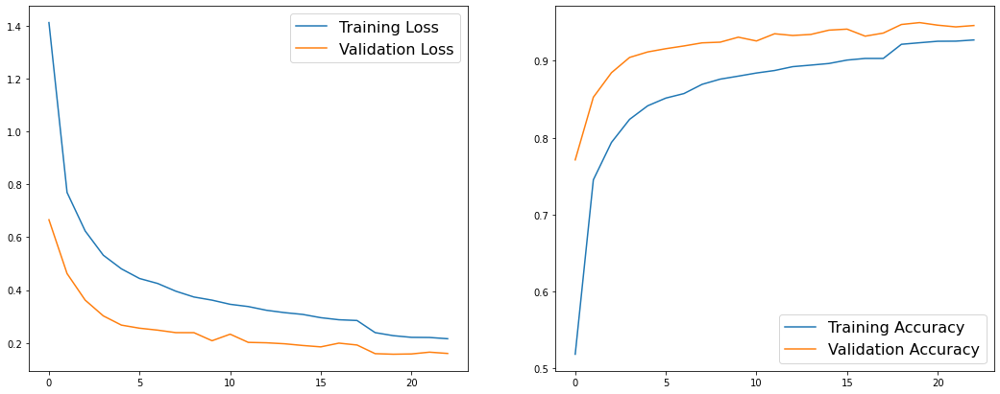

In [9]:
plot_learning_curves(history_simple_att['train_history'])

2021-08-31 11:59:16.297289: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }
2021-08-31 11:59:16.366180: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcufft.so.10
2021-08-31 11:59:16.479407: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2021-08-31 11:59:17.41102

Test set accuracy: 92.921%


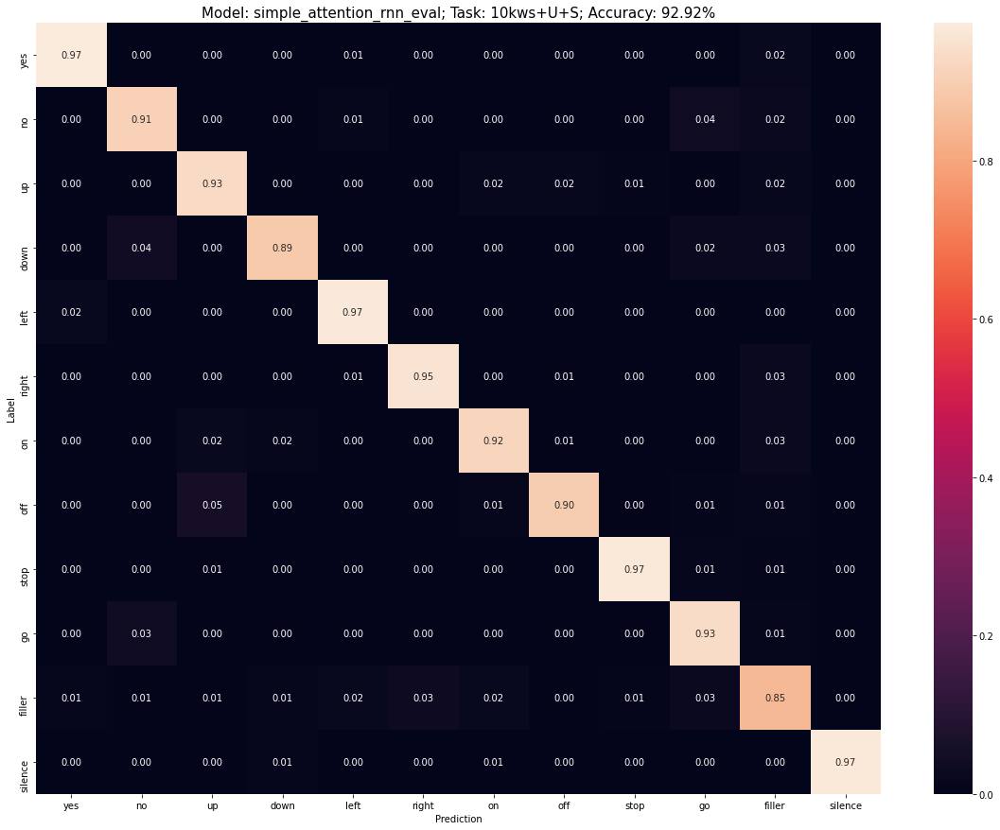

In [10]:
y_scores, att_scores, test_acc = make_confmatrix(model_simple_att, test_dataset)

In [11]:
#update results
results_12kws_task = update_results(results_12kws_task, 
                                    model_simple_att, 
                                    "SimpleAttModel", 
                                    y_scores, 
                                    att_scores, 
                                    test_acc)

## De Andreade Attention model

In [12]:
model_att_andreade = attention_rnn_andreade(train_dataset, output_classes, "test_train", mfccs=True)
model_att_andreade.summary()

Input shape: (16000,)
Model: "andreade_original_test_train"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 16000)]      0                                            
__________________________________________________________________________________________________
random_noise_augment_1 (RandomN (None, 16000)        0           input_2[0][0]                    
__________________________________________________________________________________________________
mfcc_1 (MFCC)                   (None, 98, 40, 1)    0           random_noise_augment_1[0][0]     
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 98, 40, 1)    4           mfcc_1[0][0]                     
_________________________________________________

In [13]:
model_att_andreade.load_weights(f"models/{current_task}/andreade_original_mfccs/weights").expect_partial()
with (open(f"models/{current_task}/andreade_original_mfccs/train_history.pkl", "rb")) as openfile:
    history_andreade = pickle.load(openfile)

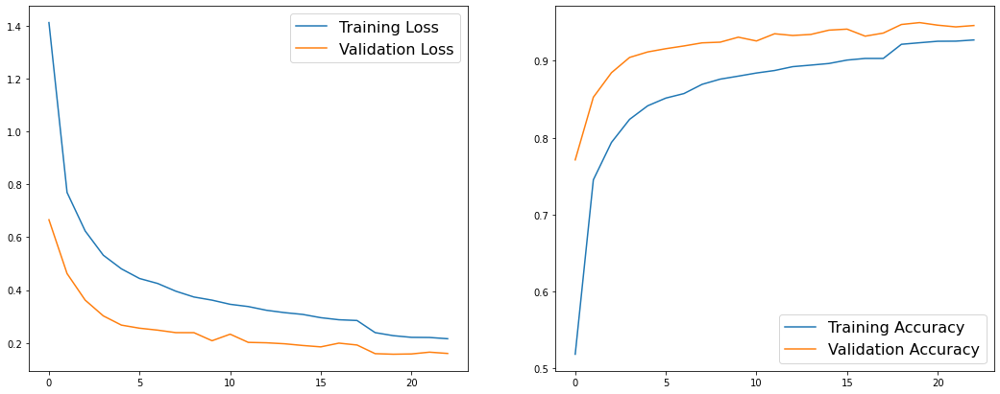

In [14]:
plot_learning_curves(history_andreade['train_history'])

2021-08-31 11:59:22.323732: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 94.742%


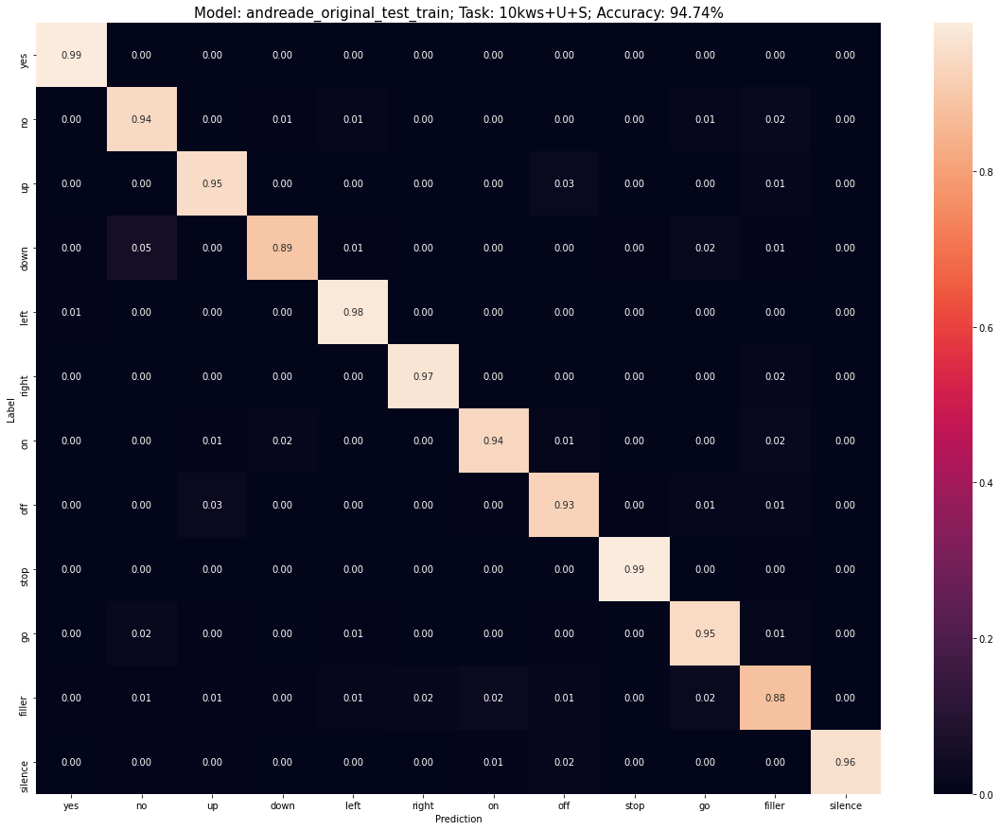

In [15]:
y_scores, att_scores, test_acc = make_confmatrix(model_att_andreade, test_dataset)

In [16]:
results_12kws_task = update_results(results_12kws_task, 
                                    model_att_andreade, 
                                    "AndreadeOriginal", 
                                    y_scores, 
                                    att_scores, 
                                    test_acc)

## De Andreade Attention model - seq query

In [17]:
andreade_seq_query = attention_rnn_andreade_seq_query(train_dataset, output_classes, "test_train", mfccs=True)
andreade_seq_query.summary()

Input shape: (16000,)
Model: "andreade_seq_query_test_train"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 16000)]      0                                            
__________________________________________________________________________________________________
random_noise_augment_2 (RandomN (None, 16000)        0           input_3[0][0]                    
__________________________________________________________________________________________________
mfcc_2 (MFCC)                   (None, 98, 40, 1)    0           random_noise_augment_2[0][0]     
__________________________________________________________________________________________________
batch_normalization_4 (BatchNor (None, 98, 40, 1)    4           mfcc_2[0][0]                     
________________________________________________

In [19]:
andreade_seq_query.load_weights(f"models/{current_task}/andreade_seq_query_mfccs_2rnn_layers/weights").expect_partial()
with (open(f"models/{current_task}/andreade_seq_query_mfccs_2rnn_layers/train_history.pkl", "rb")) as openfile:
    history_seq_query = pickle.load(openfile)

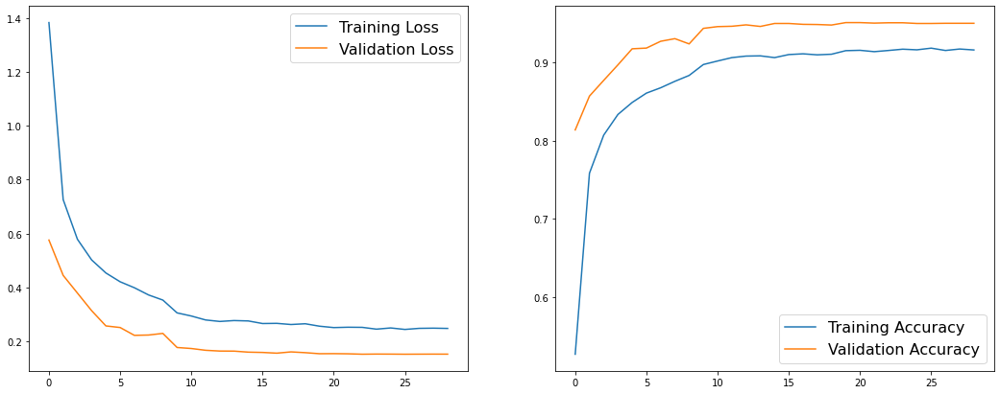

In [20]:
plot_learning_curves(history_seq_query['train_history'])

2021-08-31 12:00:16.573570: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 94.947%


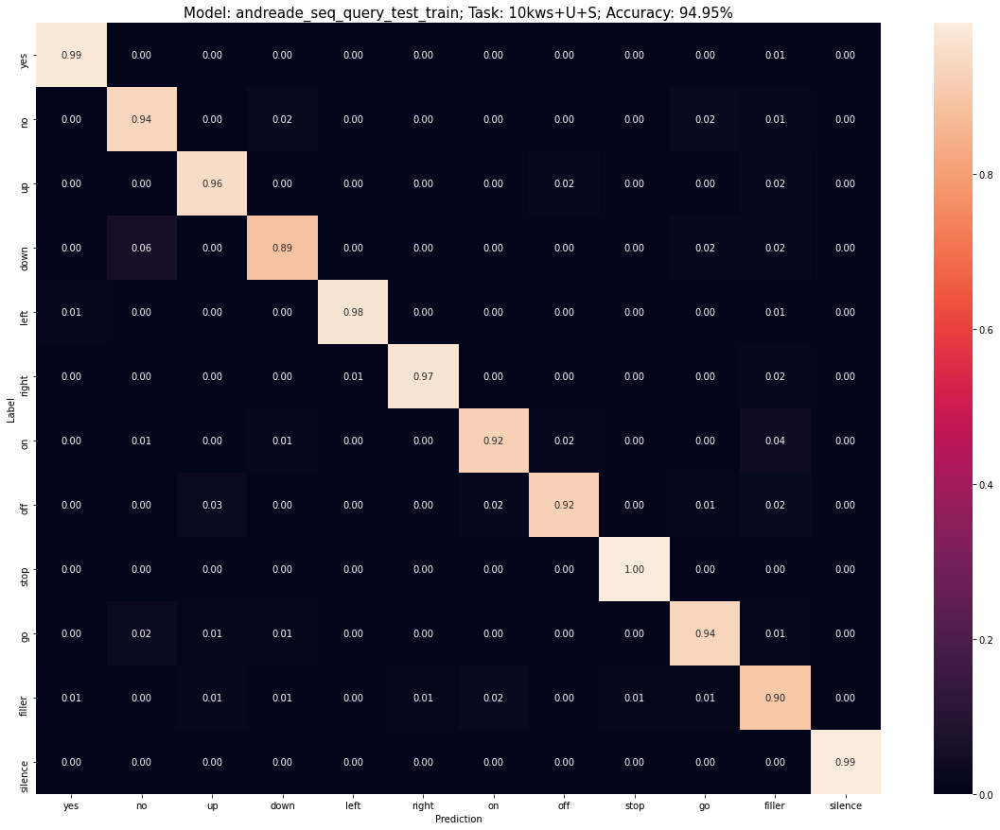

In [21]:
y_scores, att_scores, test_acc = make_confmatrix(andreade_seq_query, test_dataset)

In [22]:
results_12kws_task = update_results(results_12kws_task, 
                                    andreade_seq_query, 
                                    "AndreadeSeqQuery", 
                                    y_scores, 
                                    att_scores, 
                                    test_acc)

## Seq Query, no CNN

In [23]:
seq_query_no_cnn = andreade_seq_query_no_cnn(train_dataset, output_classes, "test_train", mfccs=True)
seq_query_no_cnn.summary()
seq_query_no_cnn.load_weights(f"models/{current_task}/andreade_seq_query_no_CNN_mfccs/weights").expect_partial()
with (open(f"models/{current_task}/andreade_seq_query_no_CNN_mfccs/train_history.pkl", "rb")) as openfile:
    history_seq_query_no_cnn = pickle.load(openfile)

Input shape: (16000,)
Model: "andreade_seq_query_no_CNN_test_train"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 16000)]      0                                            
__________________________________________________________________________________________________
random_noise_augment_3 (RandomN (None, 16000)        0           input_4[0][0]                    
__________________________________________________________________________________________________
mfcc_3 (MFCC)                   (None, 98, 40, 1)    0           random_noise_augment_3[0][0]     
__________________________________________________________________________________________________
batch_normalization_7 (BatchNor (None, 98, 40, 1)    4           mfcc_3[0][0]                     
_________________________________________

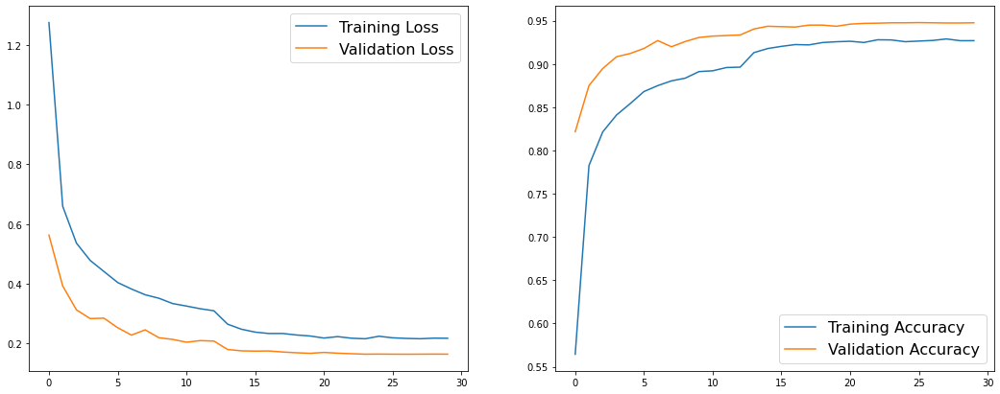

In [24]:
plot_learning_curves(history_seq_query_no_cnn['train_history'])

2021-08-31 12:01:05.377091: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 94.804%


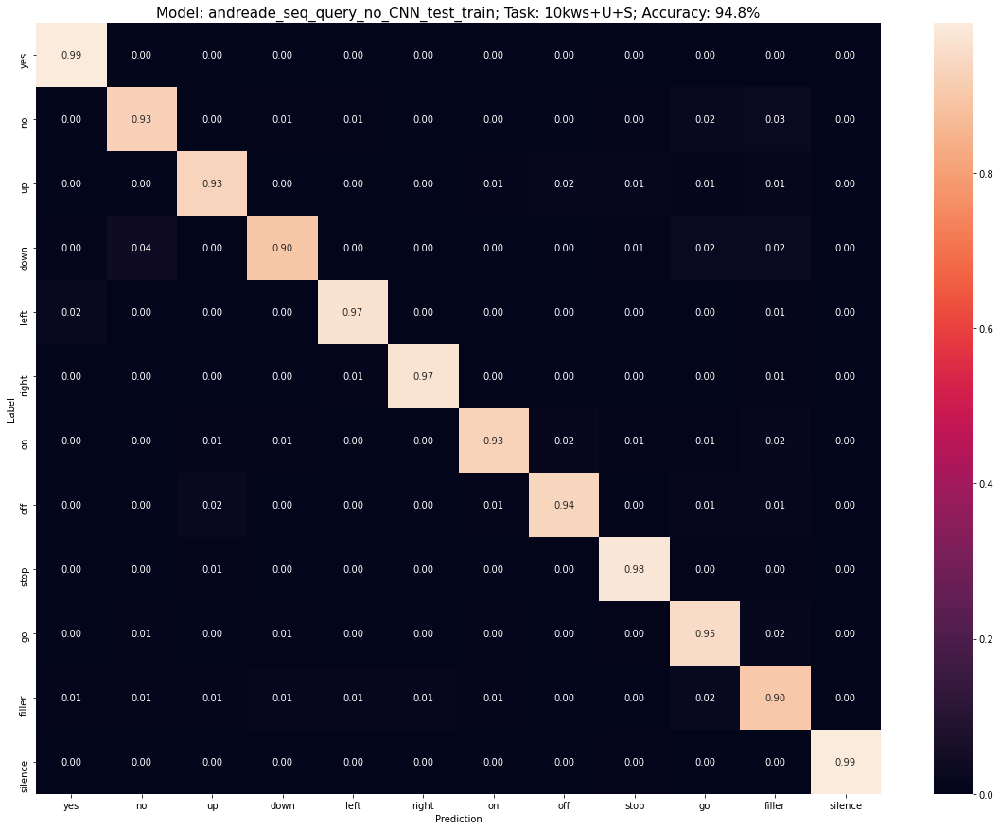

In [25]:
y_scores, att_scores, test_acc = make_confmatrix(seq_query_no_cnn, test_dataset)

In [26]:
results_12kws_task = update_results(results_12kws_task, 
                                    seq_query_no_cnn, 
                                    "SeqQueryNoCNN", 
                                    y_scores, 
                                    att_scores, 
                                    test_acc)

## MHAtt-RNN

Input shape: (16000,)


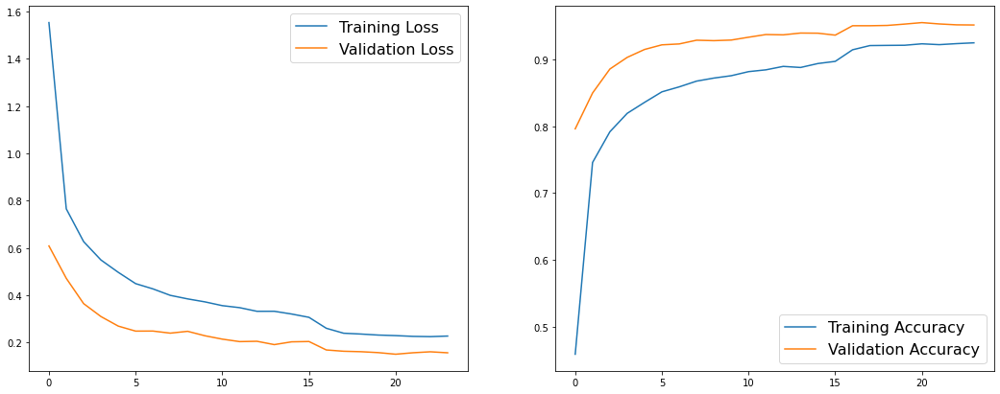

Test set accuracy: 95.110%


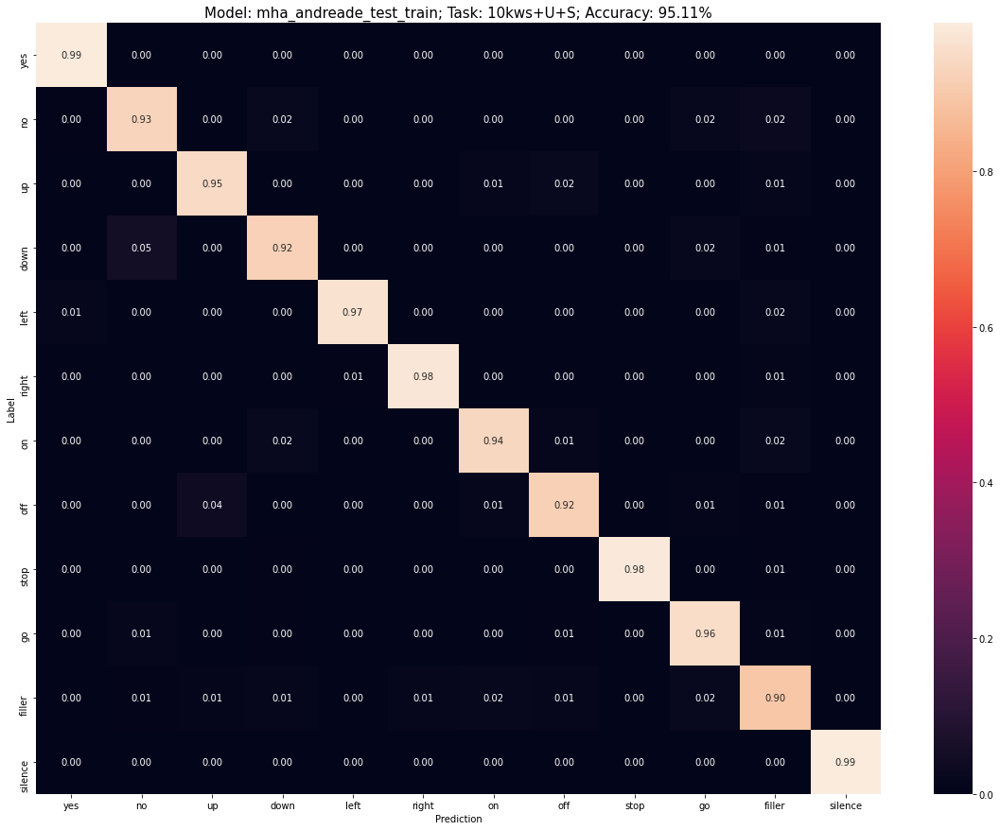

Input shape: (16000,)


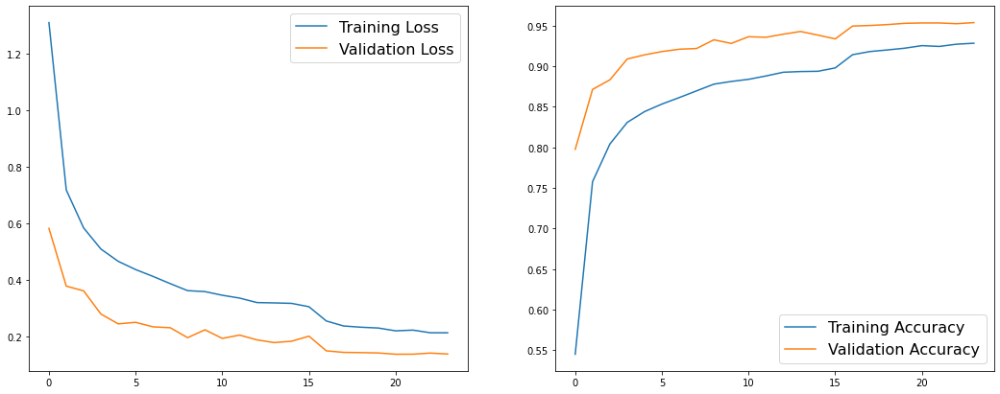

Test set accuracy: 95.254%


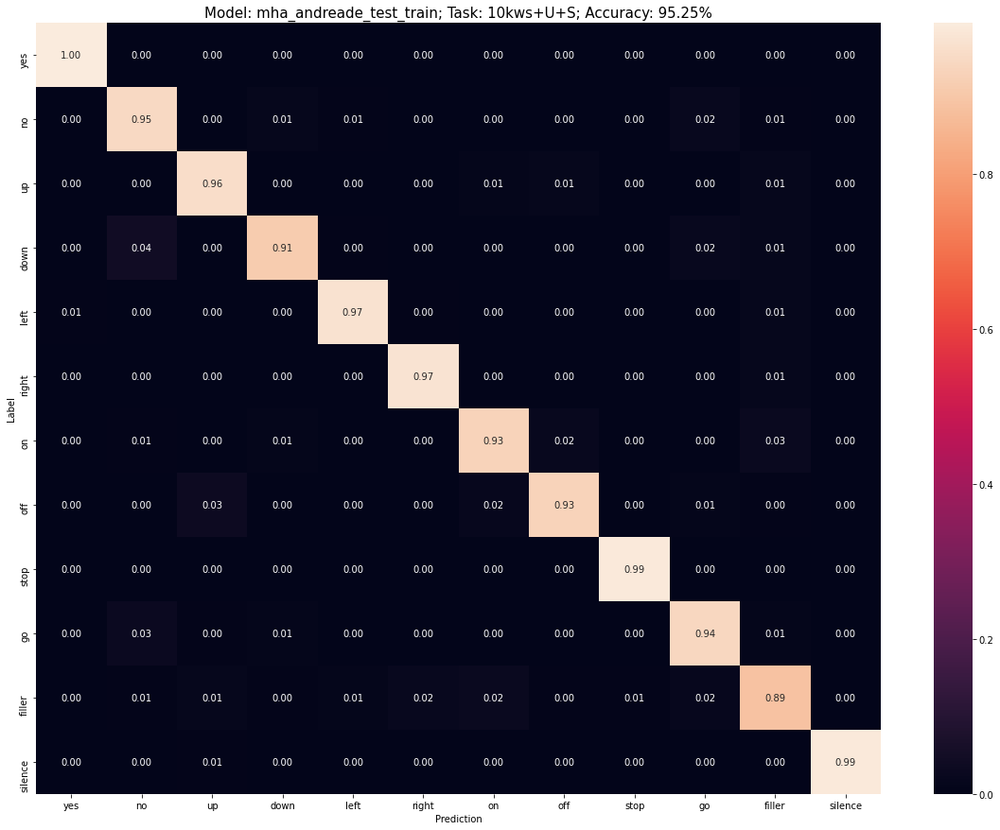

Input shape: (16000,)


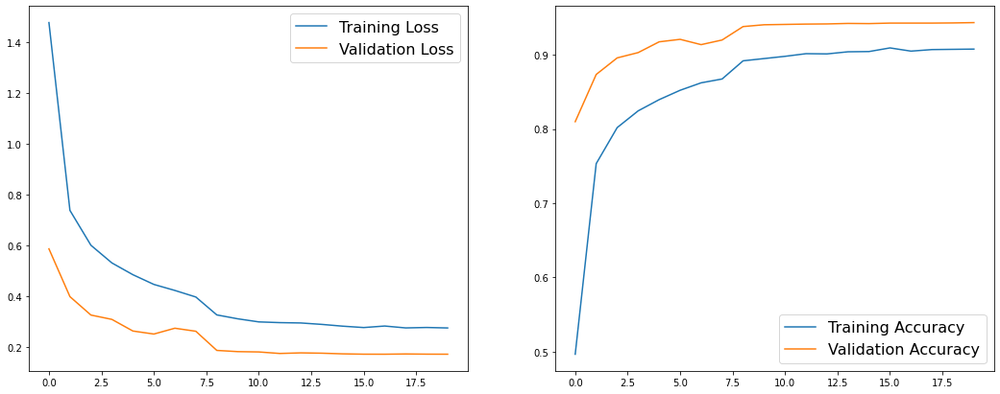

Test set accuracy: 94.394%


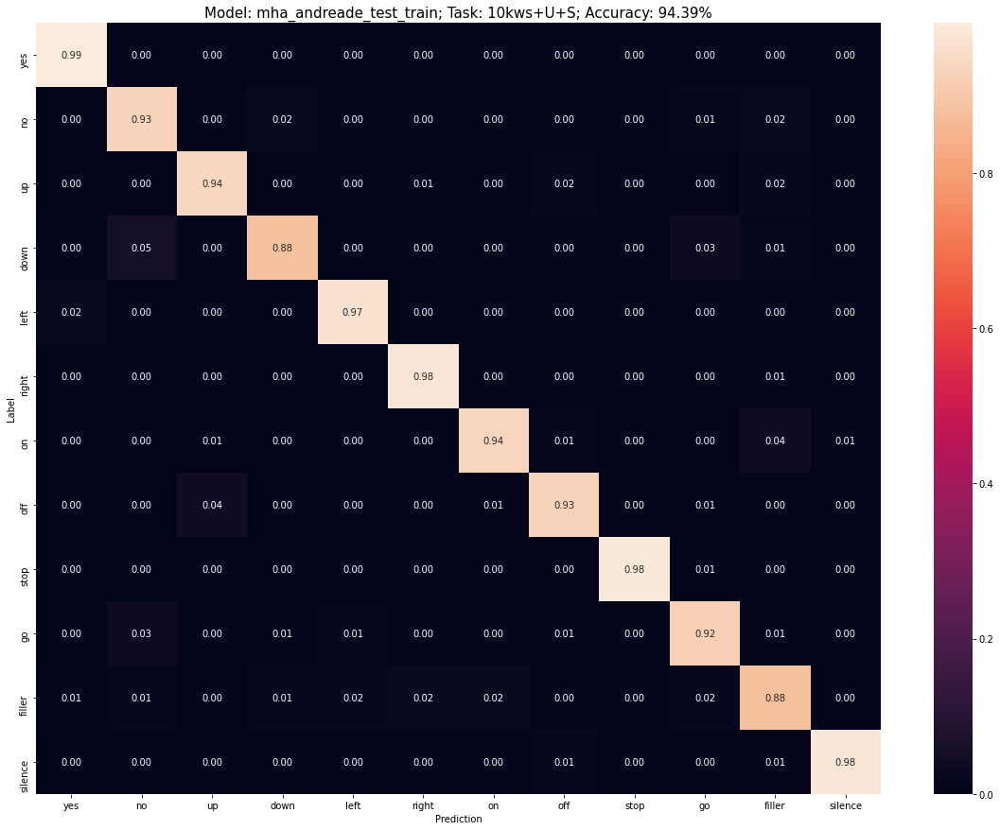

Input shape: (16000,)


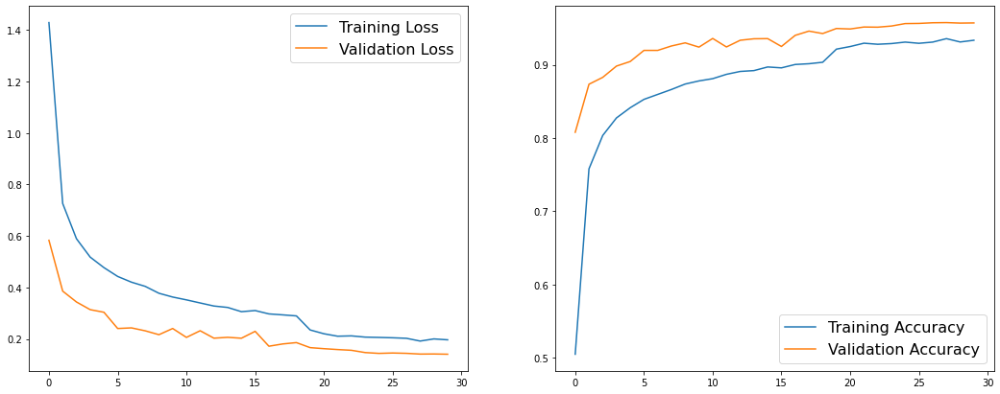

Test set accuracy: 95.499%


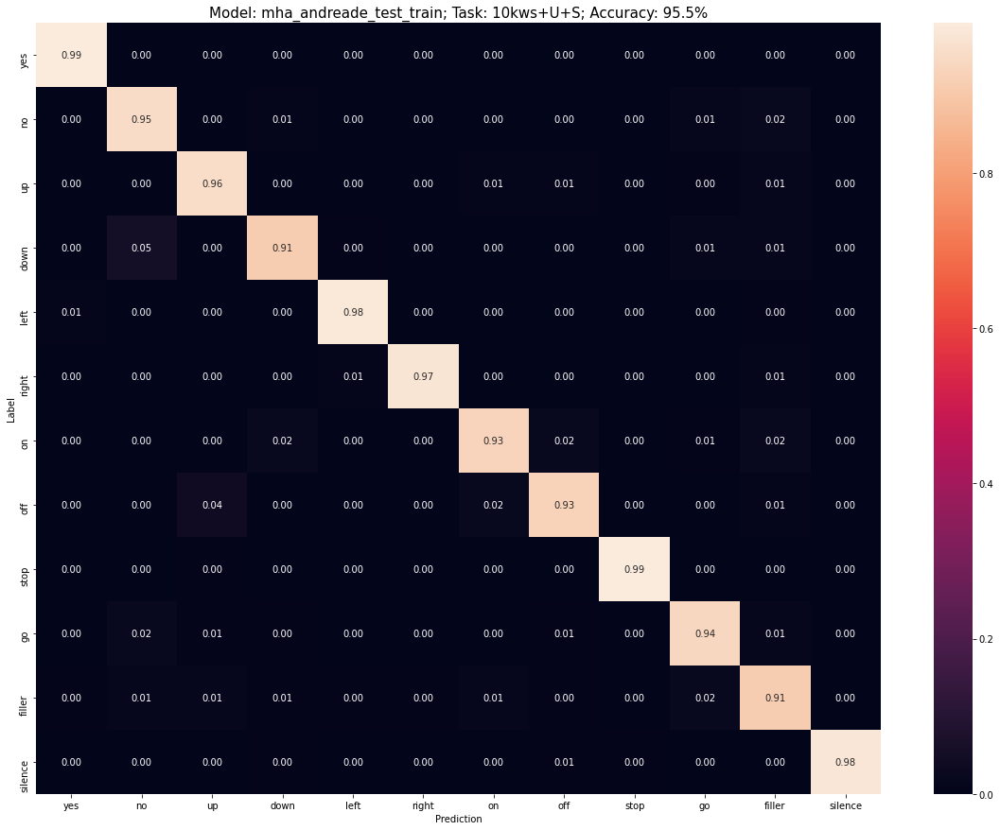

In [27]:
for n_heads in [2,3,4,5]:
    current_mha_model = mha_andreade(train_dataset, output_classes, "test_train", mfccs=True, n_heads=n_heads)
    current_mha_model.load_weights(f"models/{current_task}/mha_andreade_mfccs_{n_heads}heads/weights").expect_partial()
    with (open(f"models/{current_task}/mha_andreade_mfccs_{n_heads}heads/train_history.pkl", "rb")) as openfile:
        history_current_mha_model = pickle.load(openfile)
    plot_learning_curves(history_current_mha_model['train_history'])
    y_scores, att_scores, test_acc = make_confmatrix(current_mha_model, test_dataset)
    results_12kws_task = update_results(results_12kws_task, 
                                    current_mha_model, 
                                    f"MHattRNN_{n_heads}heads", 
                                    y_scores, 
                                    att_scores, 
                                    test_acc)

## Seq Query MHA

Input shape: (16000,)


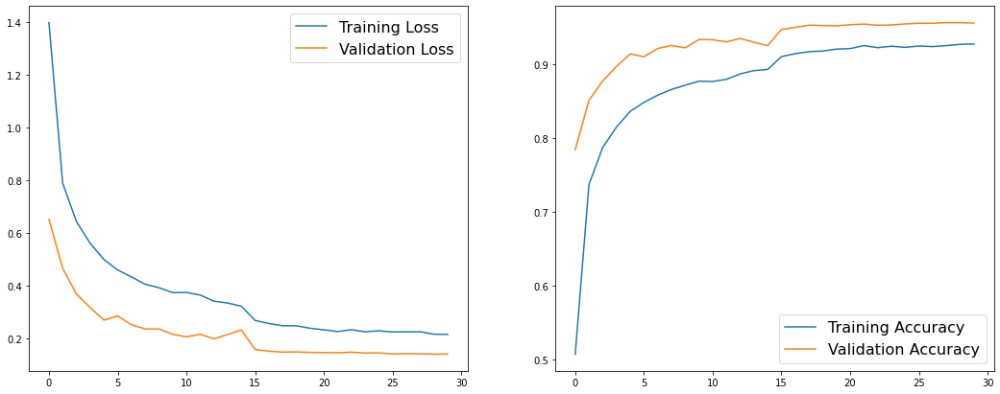

Test set accuracy: 95.295%


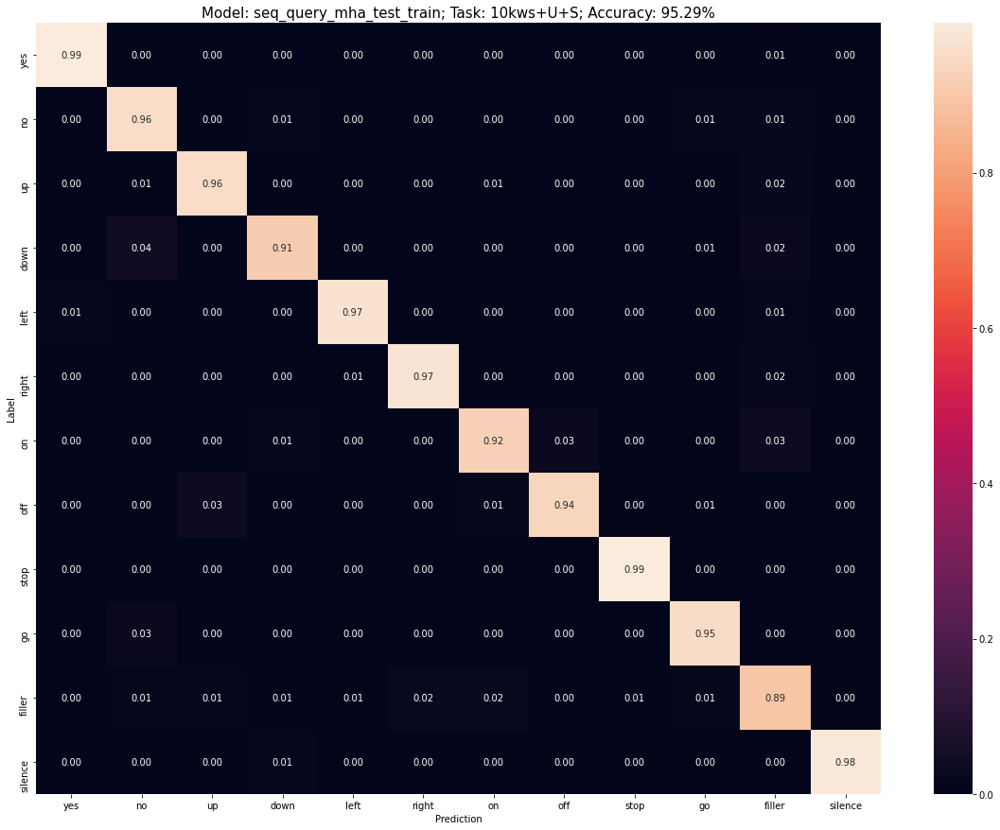

Input shape: (16000,)


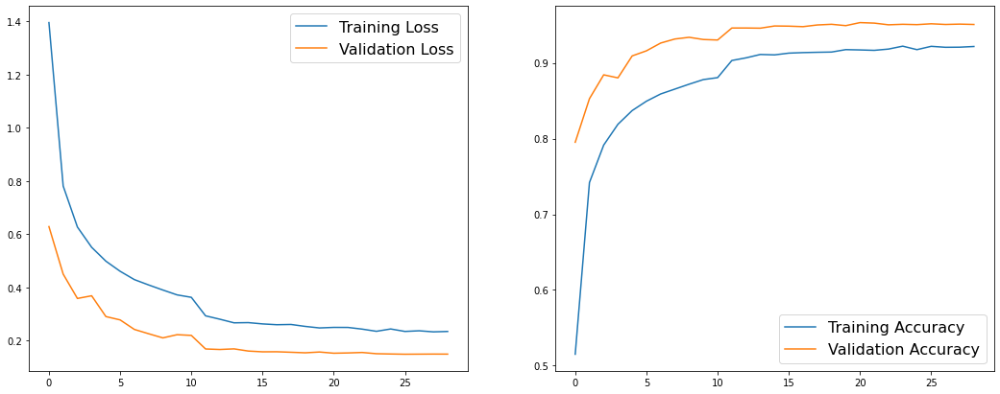

Test set accuracy: 95.397%


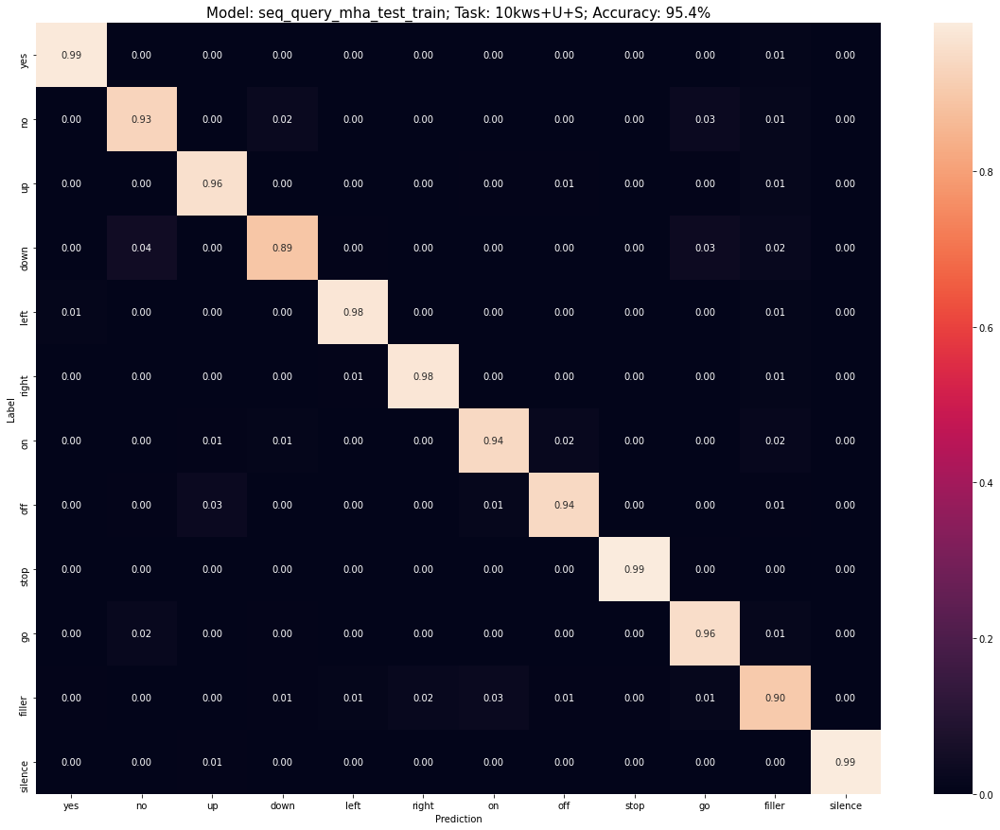

Input shape: (16000,)


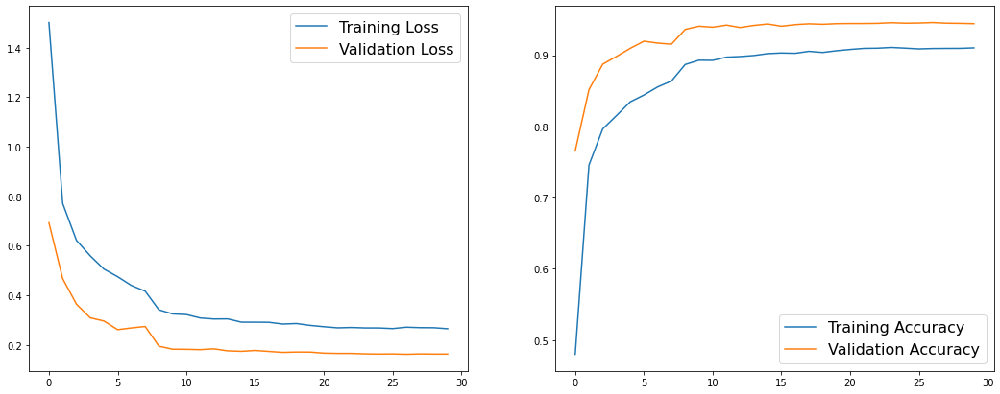

2021-08-31 12:02:22.891718: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 751109632 exceeds 10% of free system memory.


Test set accuracy: 94.722%


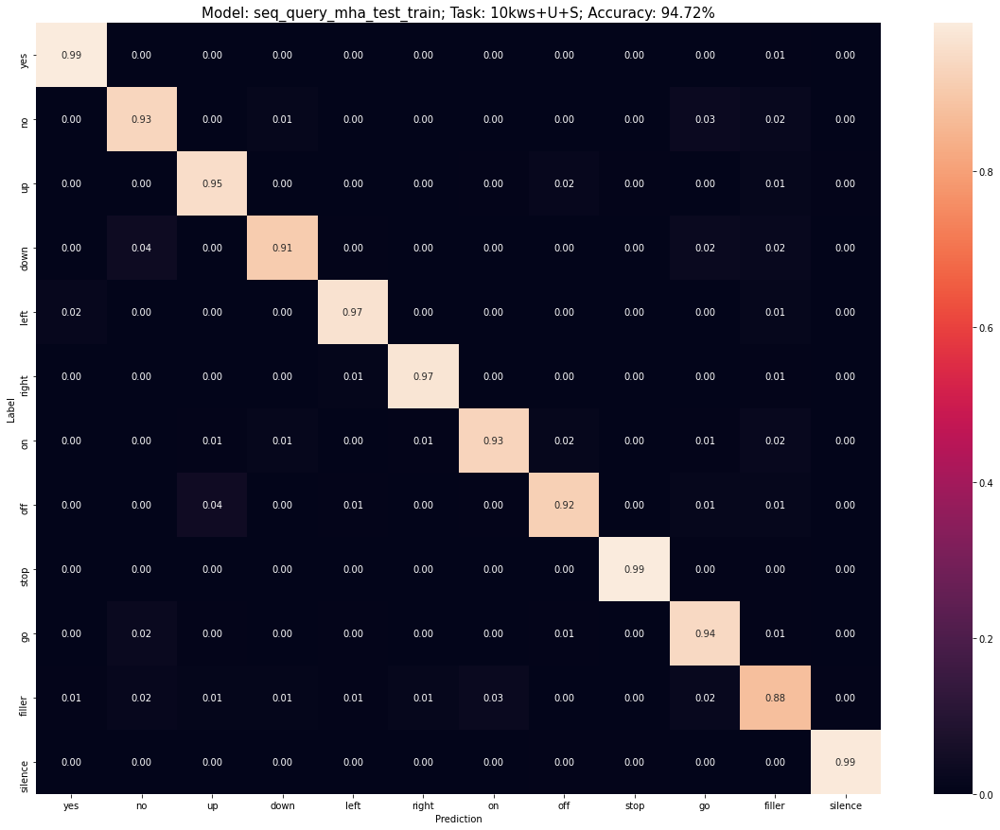

Input shape: (16000,)


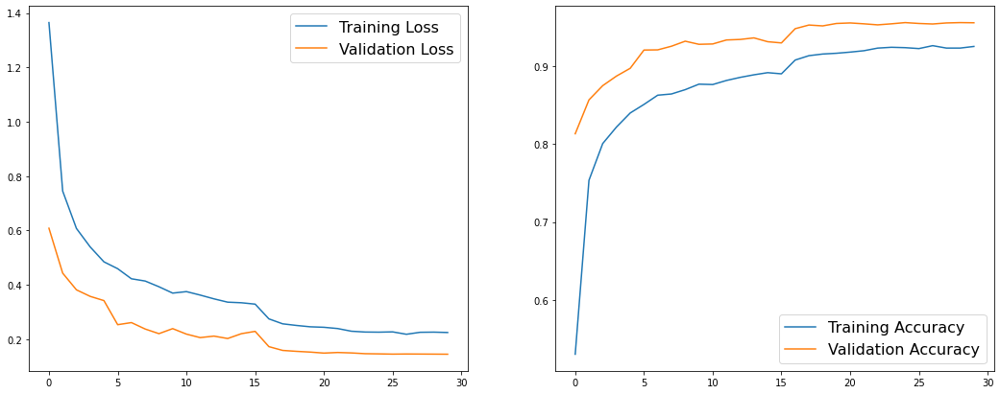

2021-08-31 12:02:28.583646: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 938887040 exceeds 10% of free system memory.


Test set accuracy: 95.683%


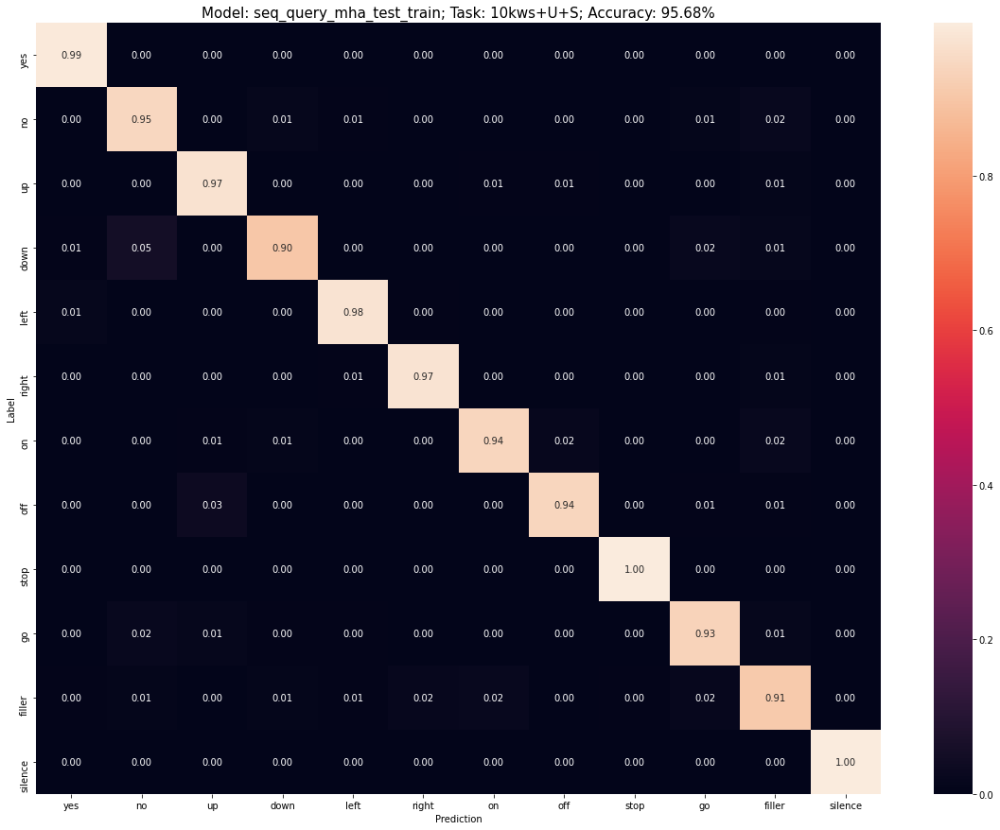

In [28]:
for n_heads in [2,3,4,5]:
    current_sq_mha_model = seq_query_mha_andreade(train_dataset, output_classes, "test_train", mfccs=True, n_heads=n_heads)
    current_sq_mha_model.load_weights(f"models/{current_task}/seq_query_mha_mfccs_{n_heads}heads_2rnn_layers/weights").expect_partial()
    with (open(f"models/{current_task}/seq_query_mha_mfccs_{n_heads}heads_2rnn_layers/train_history.pkl", "rb")) as openfile:
        history_current_sq_mha_model = pickle.load(openfile)
    plot_learning_curves(history_current_sq_mha_model['train_history'])
    y_scores, att_scores, test_acc = make_confmatrix(current_sq_mha_model, test_dataset)
    results_12kws_task = update_results(results_12kws_task, 
                                    current_sq_mha_model, 
                                    f"SQMHattRNN_{n_heads}heads", 
                                    y_scores, 
                                    att_scores, 
                                    test_acc)

## ResnetAttention

Input shape: (16000,)


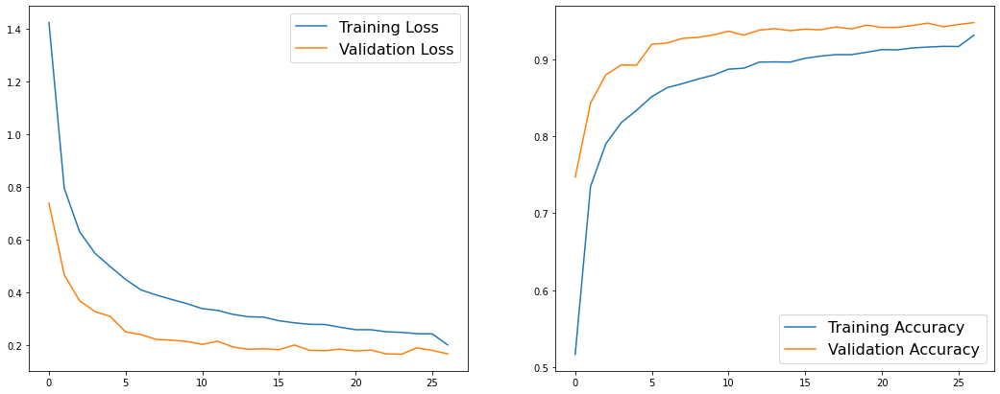

2021-08-31 12:03:02.444757: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 94.926%


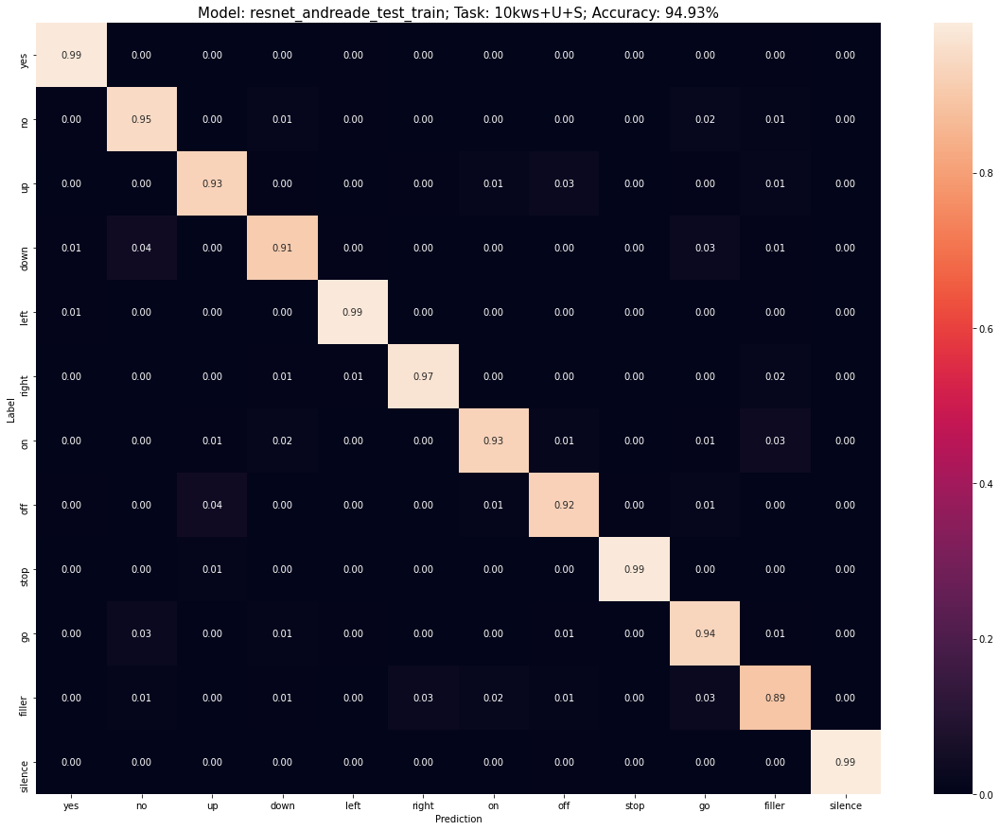

Input shape: (16000,)


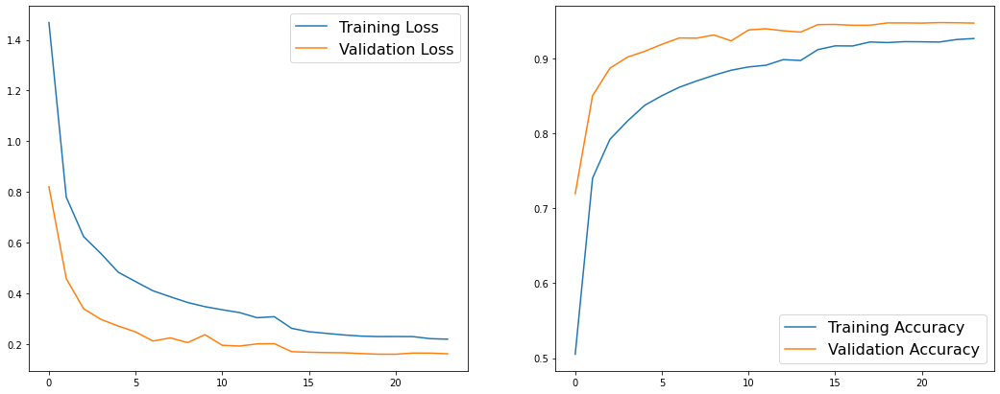

2021-08-31 12:03:06.573369: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 95.070%


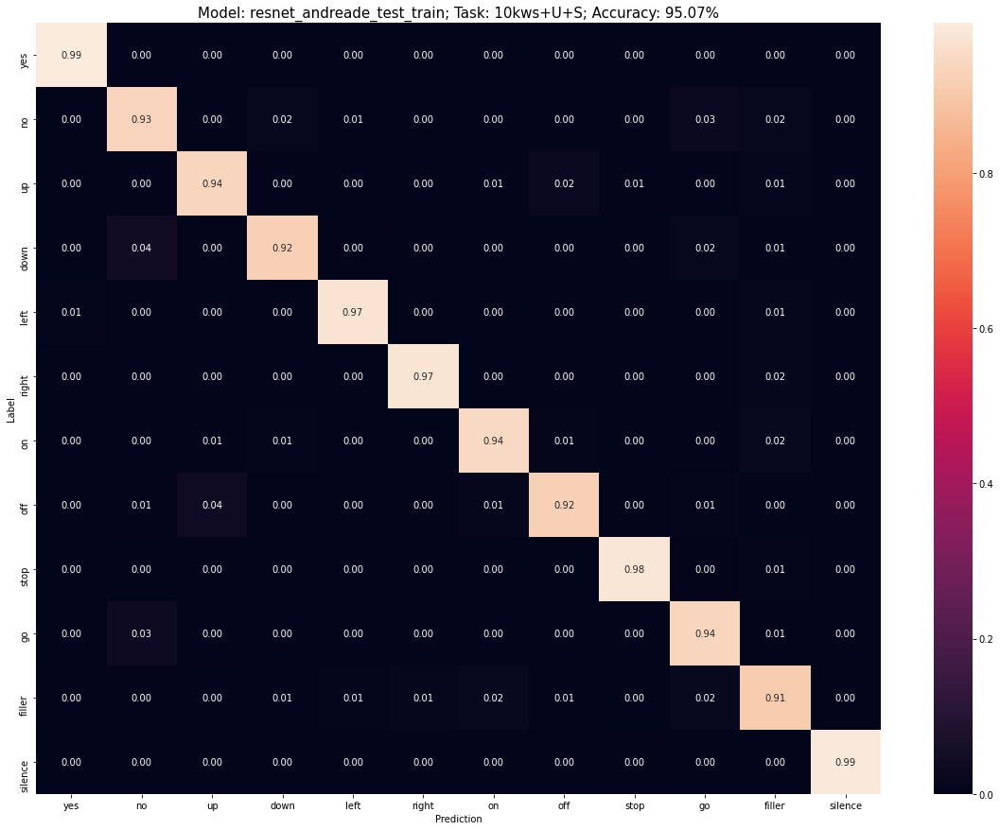

Input shape: (16000,)


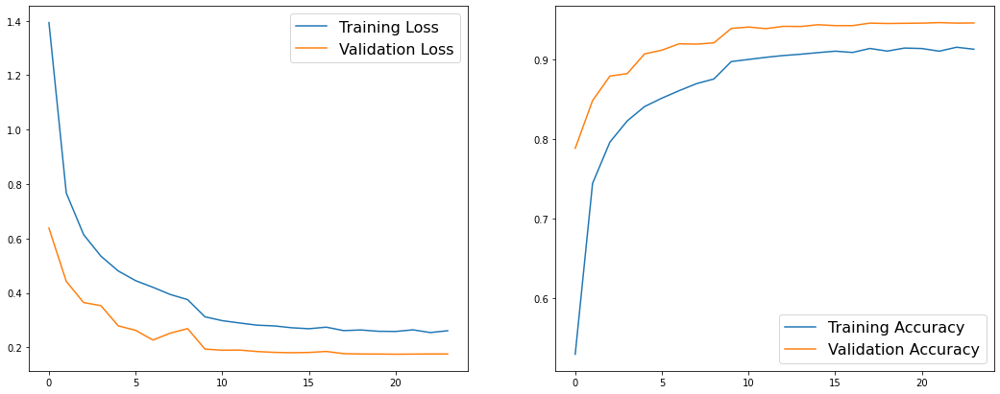

2021-08-31 12:03:11.030468: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 94.394%


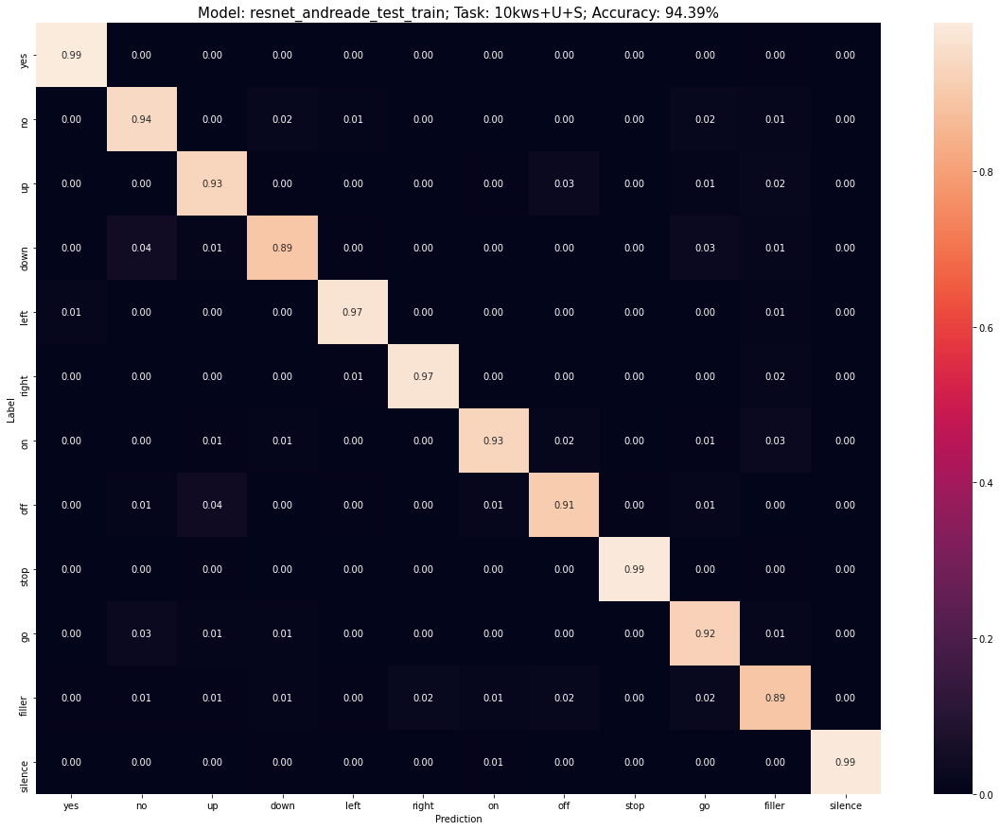

Input shape: (16000,)


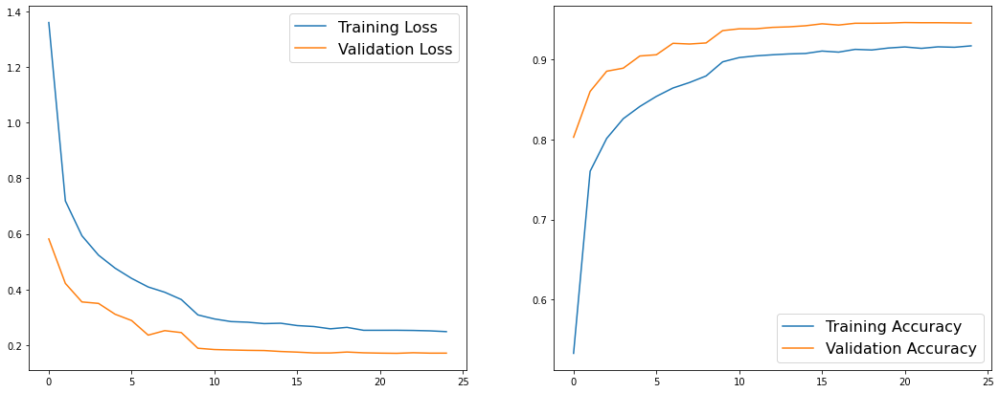

2021-08-31 12:03:15.412524: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 94.026%


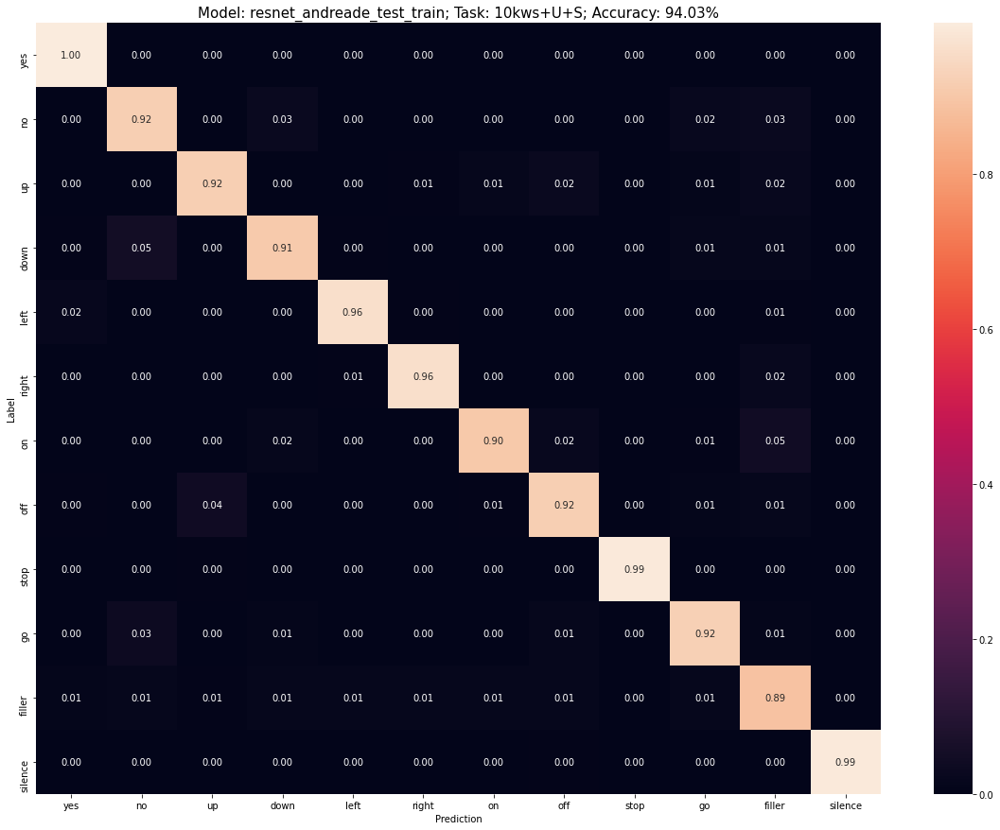

In [30]:
for n_layers in [2,3,4,5]:
    current_resnet_model = resnet_andreade(train_dataset, output_classes, "test_train", mfccs=True, n_res_blocks=n_layers)
    current_resnet_model.load_weights(f"models/{current_task}/resnet_andreade_mfccs_{n_layers}_layers/weights").expect_partial()
    
    with (open(f"models/{current_task}/resnet_andreade_mfccs_{n_layers}_layers/train_history.pkl", "rb")) as openfile:
        history_current_resnet_model = pickle.load(openfile)
    plot_learning_curves(history_current_resnet_model['train_history'])
    
    y_scores, att_scores, test_acc = make_confmatrix(current_resnet_model, test_dataset)
    results_12kws_task = update_results(results_12kws_task, 
                                    current_resnet_model, 
                                    f"ResAndreade_{n_layers}layers", 
                                    y_scores, 
                                    att_scores, 
                                    test_acc)
    del current_resnet_model

## KWT

In [29]:
## TODO

In [31]:
results_12kws_task.keys()

dict_keys(['SimpleAttModel', 'AndreadeOriginal', 'AndreadeSeqQuery', 'SeqQueryNoCNN', 'MHattRNN_2heads', 'MHattRNN_3heads', 'MHattRNN_4heads', 'MHattRNN_5heads', 'SQMHattRNN_2heads', 'SQMHattRNN_3heads', 'SQMHattRNN_4heads', 'SQMHattRNN_5heads', 'ResAndreade_2layers', 'ResAndreade_3layers', 'ResAndreade_4layers', 'ResAndreade_5layers'])

In [32]:
## Save all the results to disk
with open(hyperparams._MODELS_DIR_/current_task/'all_results.pkl', 'wb') as outp:
    pickle.dump(results_12kws_task, outp)

# 2) 35kws task

In [4]:
current_task = hyperparams._TASKS_[1]
print(current_task)
core_kws, aux_kws, output_classes = get_kws(hyperparams._DATA_DIR_, current_task)
print("Core keywords: ", core_kws)
print()
print("Auxiliary keywords: ", aux_kws)
print()
print("Output Classes: ", output_classes)

if len(os.listdir(hyperparams._BINARIES_DIR_/current_task)) == 0:
    #Get train, validation and test data from the splits provided in the data directory
    make_and_save_original_splits(current_task, return_canonical_test_set=False)

X_train, y_train, X_valid, y_valid, X_test, y_test = load_original_splits(current_task, smoke_size=-1)

batch_size = 64
train_dataset, train_steps, valid_dataset, valid_steps, test_dataset = get_tf_datasets(X_train, 
                             y_train, 
                             X_valid, 
                             y_valid, 
                             X_test, 
                             y_test, 
                             batch_size=batch_size,
                            task=current_task)

# just iterate one time on the test set in order to create the cache file
for i in iter(test_dataset):
    pass

35kws
Core keywords:  ['off', 'three', 'happy', 'eight', 'up', 'no', 'seven', 'marvin', 'five', 'cat', 'visual', 'forward', 'right', 'wow', 'zero', 'learn', 'bird', 'left', 'nine', 'house', 'dog', 'backward', 'on', 'two', 'sheila', 'follow', 'tree', 'yes', 'four', 'one', 'stop', 'six', 'down', 'go', 'bed']

Auxiliary keywords:  []

Output Classes:  ['off', 'three', 'happy', 'eight', 'up', 'no', 'seven', 'marvin', 'five', 'cat', 'visual', 'forward', 'right', 'wow', 'zero', 'learn', 'bird', 'left', 'nine', 'house', 'dog', 'backward', 'on', 'two', 'sheila', 'follow', 'tree', 'yes', 'four', 'one', 'stop', 'six', 'down', 'go', 'bed']


2021-08-31 12:41:23.091215: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-08-31 12:41:23.166028: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-08-31 12:41:23.166659: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: GeForce GTX 1060 6GB computeCapability: 6.1
coreClock: 1.7845GHz coreCount: 10 deviceMemorySize: 5.93GiB deviceMemoryBandwidth: 178.99GiB/s
2021-08-31 12:41:23.166725: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-08-31 12:41:23.201869: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2021-08-31 12:41:23.202136: I tensorflow/stream_executor/platf

Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.
Train steps: 1326
Validations steps: 156


2021-08-31 12:41:25.760803: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2021-08-31 12:41:25.785950: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 2699905000 Hz


Example of dataset element:
(<tf.Tensor: shape=(64, 16000), dtype=float32, numpy=
array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         6.76677679e-04,  2.85788323e-03,  6.47882262e-05],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
        -7.15032802e-05, -1.55194604e-04, -1.60069816e-04],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         2.25173790e-06,  2.25173790e-06, -7.28062587e-05],
       ...,
       [-8.37675855e-03,  5.72888367e-03, -4.02948260e-03, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
        -1.08472025e-02,  4.48914850e-03,  1.01433434e-02],
       [ 6.12840466e-02,  7.06826001e-02,  5.51371984e-02, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]], dtype=float32)>, <tf.Tensor: shape=(64,), dtype=int64, numpy=
array([ 0, 21,  5, 28, 26, 20, 27,  4, 31, 23, 30,  7,  5, 19, 27, 18, 32,
       23, 30, 29, 21, 2

## Simple Attention RNN

In [34]:
model_simple_att = simple_attention_rnn(train_dataset, output_classes, "eval", mfccs=True)
model_simple_att.summary()

model_simple_att.load_weights(f"models/{current_task}/simple_attention_rnn_mfccs/weights").expect_partial()
with (open("models/10kws+U+S/andreade_original_mfccs/train_history.pkl", "rb")) as openfile:
    history_simple_att = pickle.load(openfile)

Input shape: (16000,)
Model: "simple_attention_rnn_eval"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           [(None, 16000)]      0                                            
__________________________________________________________________________________________________
random_noise_augment_16 (Random (None, 16000)        0           input_17[0][0]                   
__________________________________________________________________________________________________
mfcc_16 (MFCC)                  (None, 98, 40, 1)    0           random_noise_augment_16[0][0]    
__________________________________________________________________________________________________
batch_normalization_72 (BatchNo (None, 98, 40, 1)    4           mfcc_16[0][0]                    
____________________________________________________

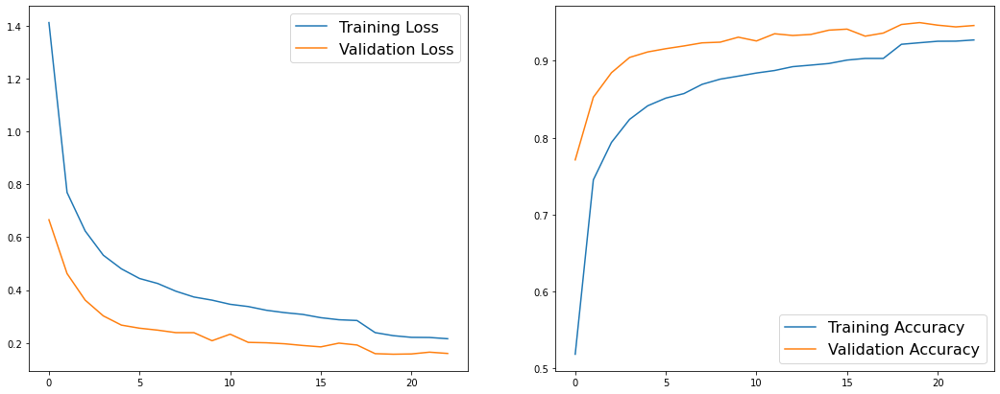

In [35]:
plot_learning_curves(history_simple_att['train_history'])

2021-08-31 12:04:24.282836: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 92.821%


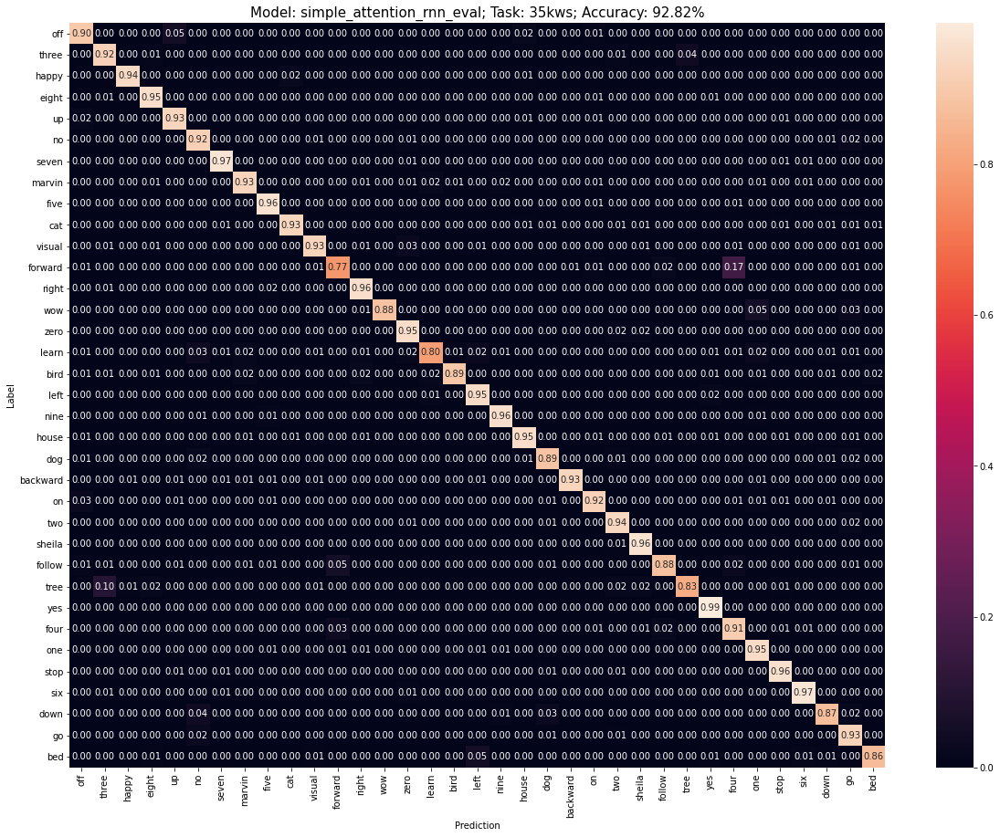

In [36]:
y_scores, att_scores, test_acc = make_confmatrix(model_simple_att, test_dataset)

#update results
results_35kws_task = update_results(results_35kws_task, 
                                    model_simple_att, 
                                    "SimpleAttModel", 
                                    y_scores, 
                                    att_scores, 
                                    test_acc)

## De Andreade Attention model


In [37]:
model_att_andreade = attention_rnn_andreade(train_dataset, output_classes, "test_train", mfccs=True)
model_att_andreade.summary()

model_att_andreade.load_weights(f"models/{current_task}/andreade_original_mfccs/weights").expect_partial()
with (open(f"models/{current_task}/andreade_original_mfccs/train_history.pkl", "rb")) as openfile:
    history_andreade = pickle.load(openfile)

Input shape: (16000,)
Model: "andreade_original_test_train"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_18 (InputLayer)           [(None, 16000)]      0                                            
__________________________________________________________________________________________________
random_noise_augment_17 (Random (None, 16000)        0           input_18[0][0]                   
__________________________________________________________________________________________________
mfcc_17 (MFCC)                  (None, 98, 40, 1)    0           random_noise_augment_17[0][0]    
__________________________________________________________________________________________________
batch_normalization_73 (BatchNo (None, 98, 40, 1)    4           mfcc_17[0][0]                    
_________________________________________________

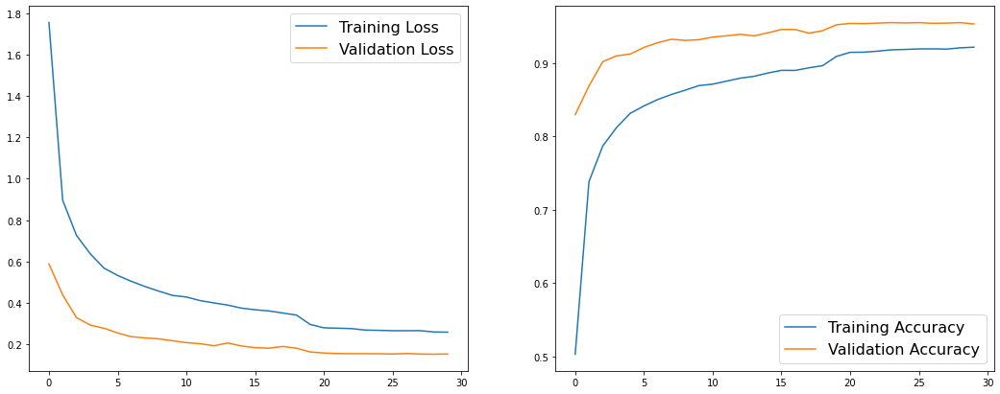

In [38]:
plot_learning_curves(history_andreade['train_history'])

2021-08-31 12:04:32.132309: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 95.184%


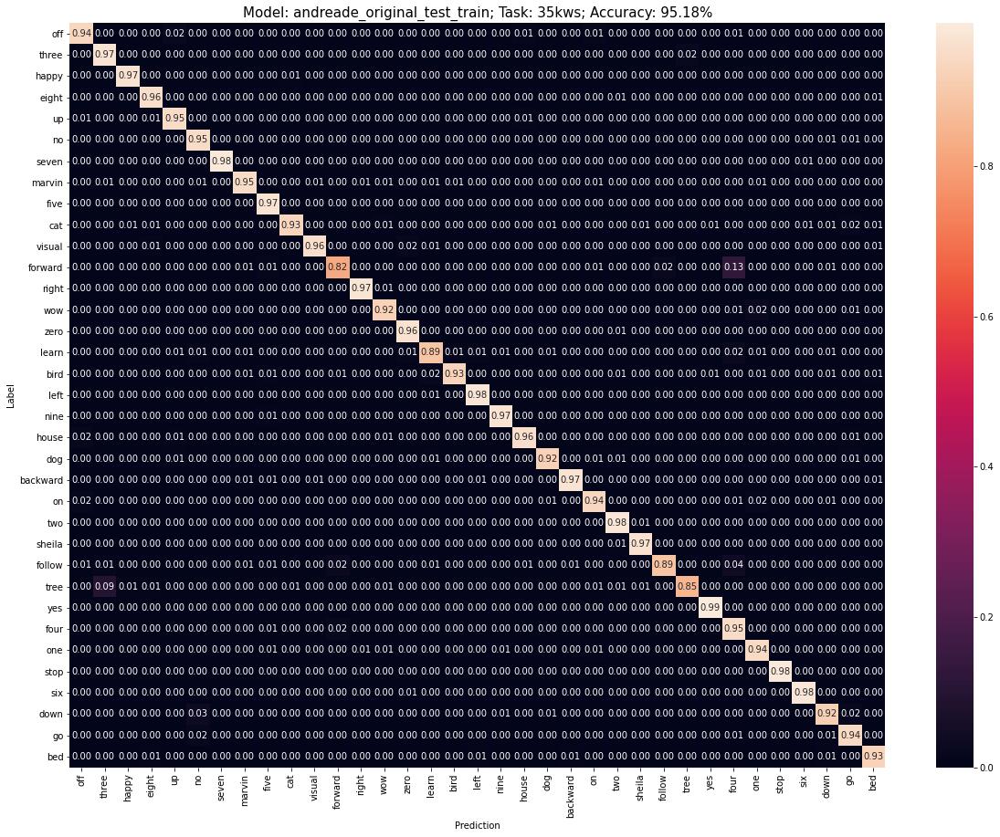

In [39]:
y_scores, att_scores, test_acc = make_confmatrix(model_att_andreade, test_dataset)

results_35kws_task = update_results(results_35kws_task, 
                                    model_att_andreade, 
                                    "AndreadeOriginal", 
                                    y_scores, 
                                    att_scores, 
                                   test_acc)

## De Andreade Attention model - seq query

In [40]:
andreade_seq_query = attention_rnn_andreade_seq_query(train_dataset, output_classes, "test_train", mfccs=True)
andreade_seq_query.summary()

andreade_seq_query.load_weights(f"models/{current_task}/andreade_seq_query_mfccs_2rnn_layers/weights").expect_partial()
with (open(f"models/{current_task}/andreade_seq_query_mfccs_2rnn_layers/train_history.pkl", "rb")) as openfile:
    history_seq_query = pickle.load(openfile)

Input shape: (16000,)
Model: "andreade_seq_query_test_train"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_19 (InputLayer)           [(None, 16000)]      0                                            
__________________________________________________________________________________________________
random_noise_augment_18 (Random (None, 16000)        0           input_19[0][0]                   
__________________________________________________________________________________________________
mfcc_18 (MFCC)                  (None, 98, 40, 1)    0           random_noise_augment_18[0][0]    
__________________________________________________________________________________________________
batch_normalization_76 (BatchNo (None, 98, 40, 1)    4           mfcc_18[0][0]                    
________________________________________________

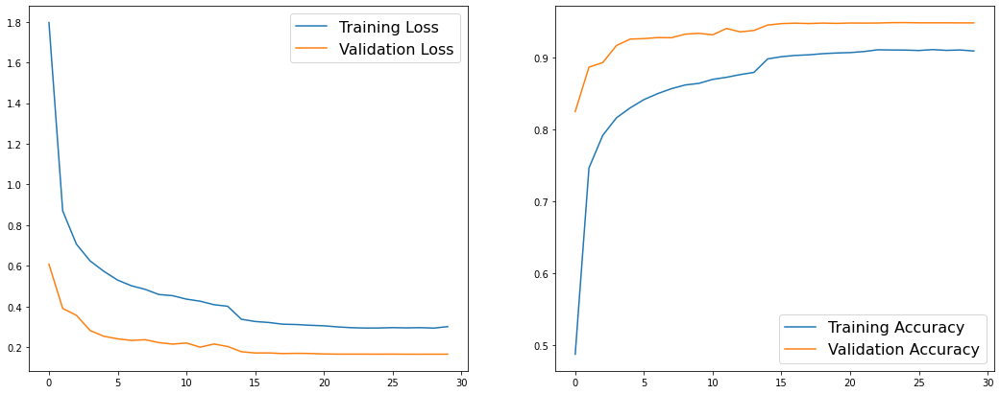

In [41]:
plot_learning_curves(history_seq_query['train_history'])

2021-08-31 12:05:35.100013: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 94.557%


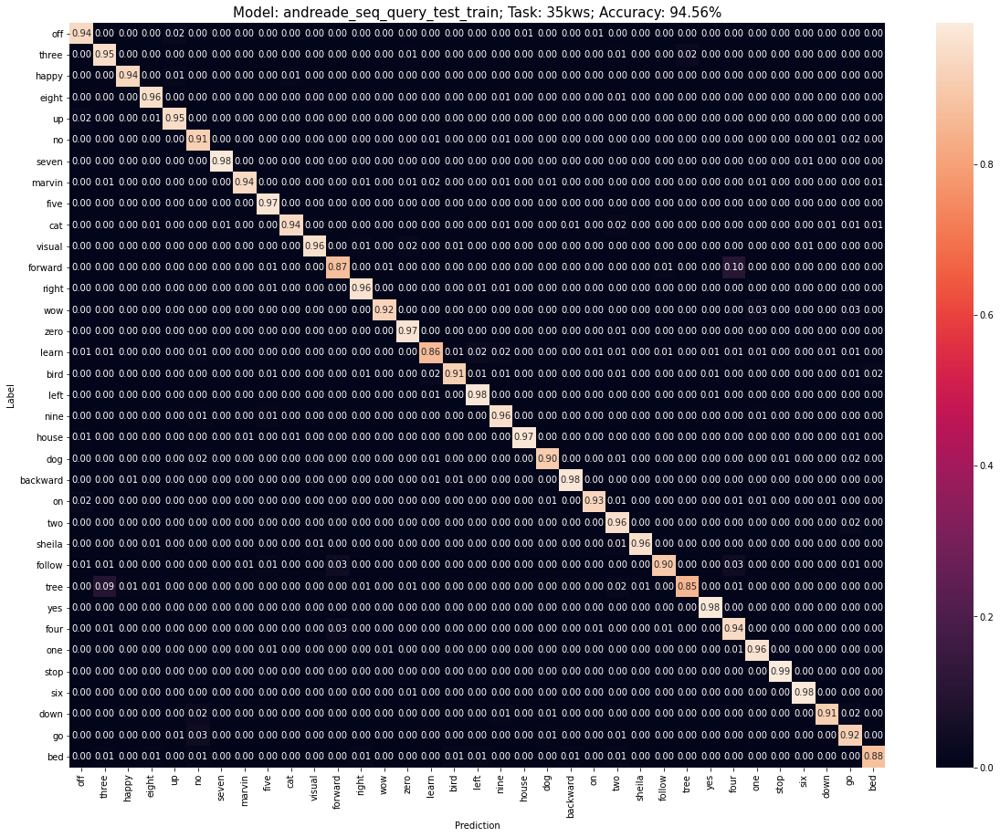

In [42]:
y_scores, att_scores, test_acc = make_confmatrix(andreade_seq_query, test_dataset)

results_35kws_task = update_results(results_35kws_task, 
                                    andreade_seq_query, 
                                    "AndreadeSeqQuery", 
                                    y_scores, 
                                    att_scores, 
                                    test_acc)

## Seq Query, no CNN

In [43]:
seq_query_no_cnn = andreade_seq_query_no_cnn(train_dataset, output_classes, "test_train", mfccs=True)
seq_query_no_cnn.summary()

seq_query_no_cnn.load_weights(f"models/{current_task}/andreade_seq_query_no_CNN_mfccs/weights").expect_partial()
with (open(f"models/{current_task}/andreade_seq_query_no_CNN_mfccs/train_history.pkl", "rb")) as openfile:
    history_seq_query_no_cnn = pickle.load(openfile)

Input shape: (16000,)
Model: "andreade_seq_query_no_CNN_test_train"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_20 (InputLayer)           [(None, 16000)]      0                                            
__________________________________________________________________________________________________
random_noise_augment_19 (Random (None, 16000)        0           input_20[0][0]                   
__________________________________________________________________________________________________
mfcc_19 (MFCC)                  (None, 98, 40, 1)    0           random_noise_augment_19[0][0]    
__________________________________________________________________________________________________
batch_normalization_79 (BatchNo (None, 98, 40, 1)    4           mfcc_19[0][0]                    
_________________________________________

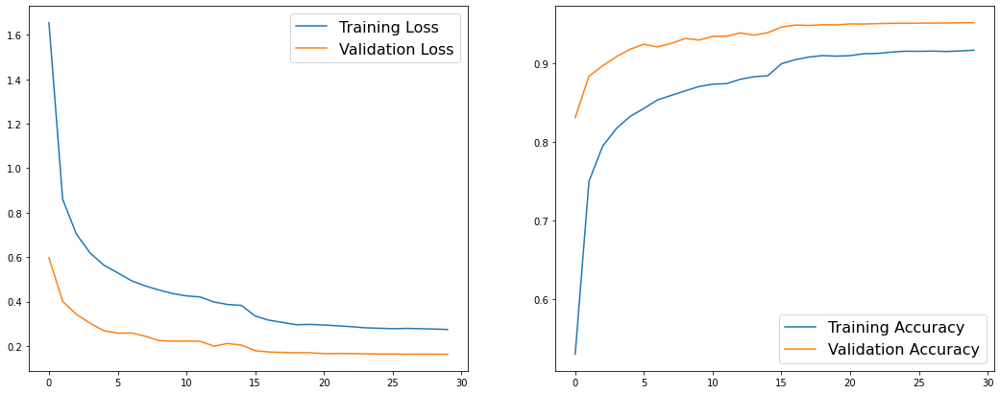

In [44]:
plot_learning_curves(history_seq_query_no_cnn['train_history'])

2021-08-31 12:06:30.823098: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 94.793%


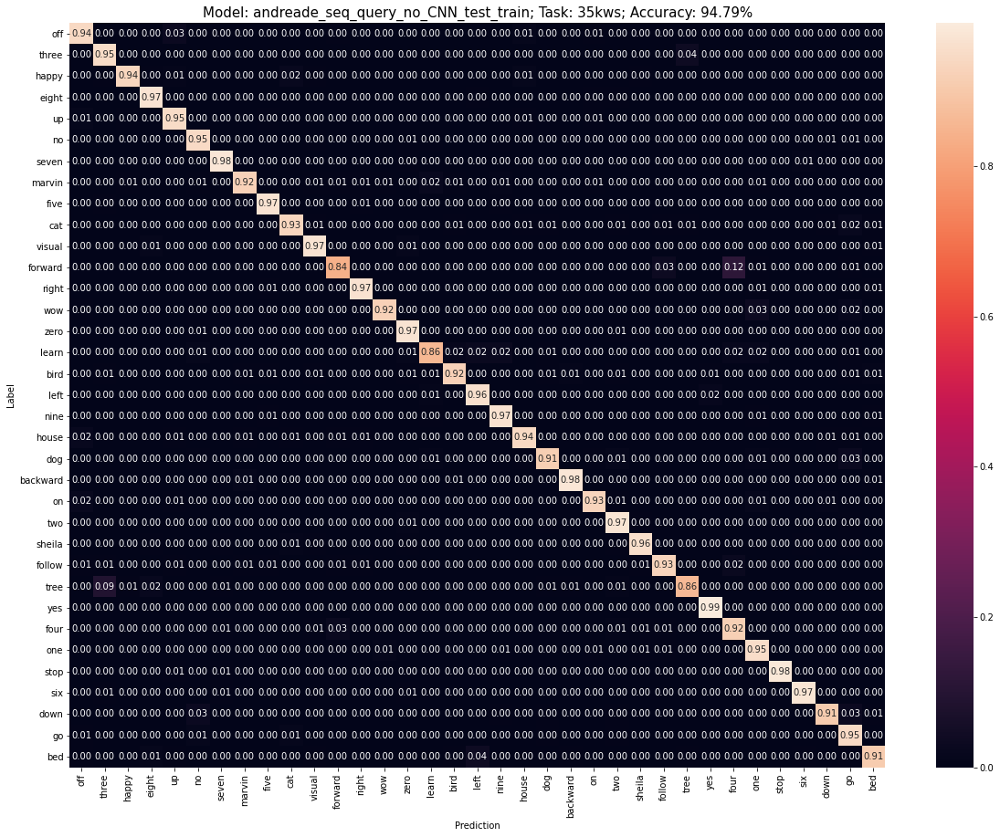

In [45]:
y_scores, att_scores, test_acc = make_confmatrix(seq_query_no_cnn, test_dataset)

results_35kws_task = update_results(results_35kws_task, 
                                    seq_query_no_cnn, 
                                    "SeqQueryNoCNN", 
                                    y_scores, 
                                    att_scores, 
                                    test_acc)


## MHAtt-RNN

Input shape: (16000,)


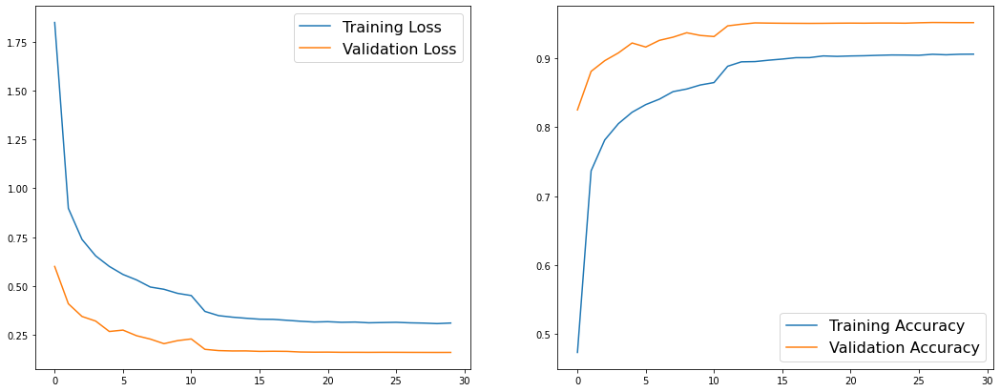

Test set accuracy: 94.802%


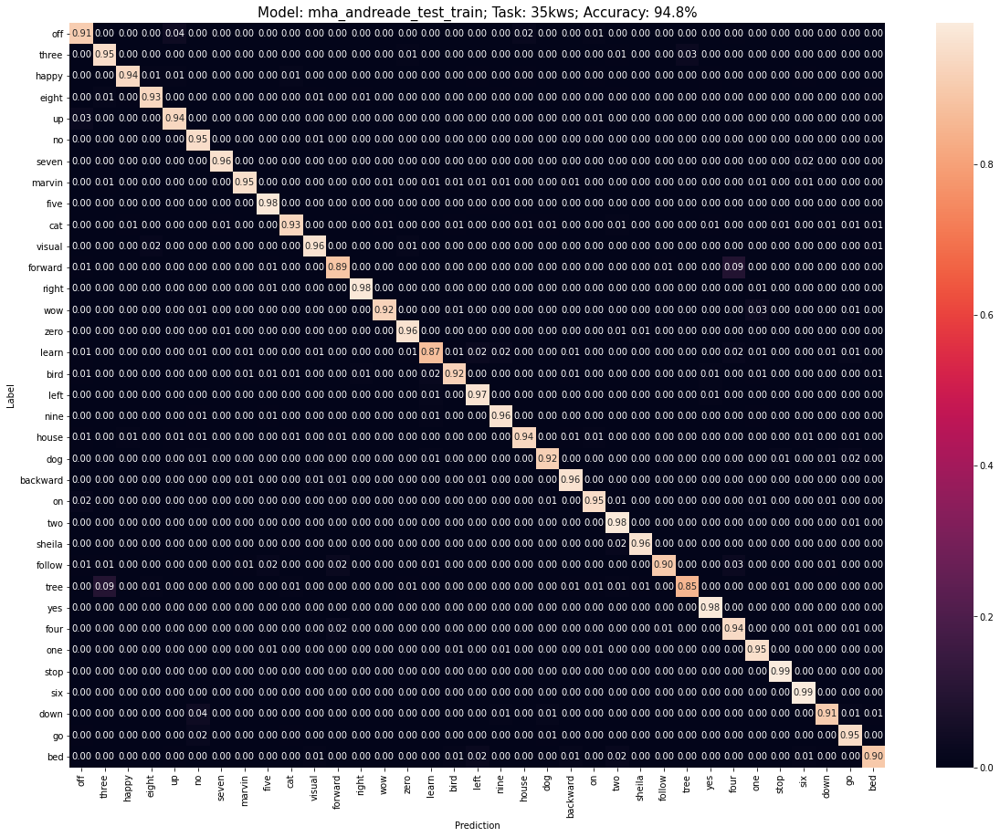

Input shape: (16000,)


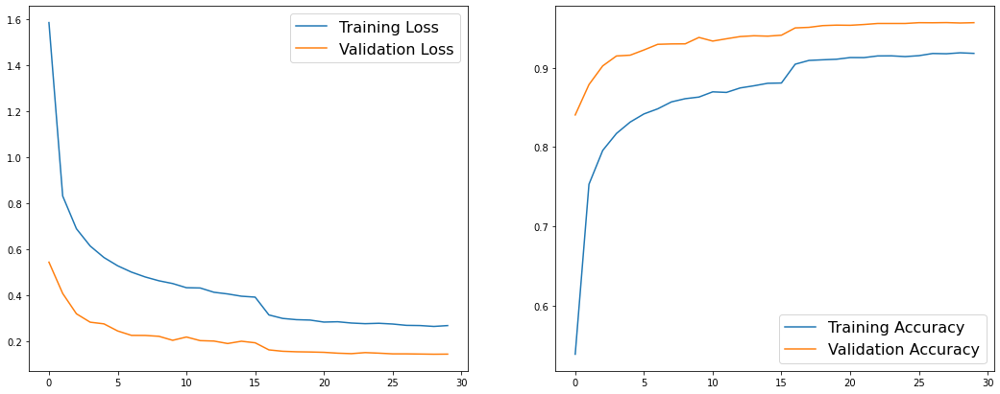

Test set accuracy: 95.320%


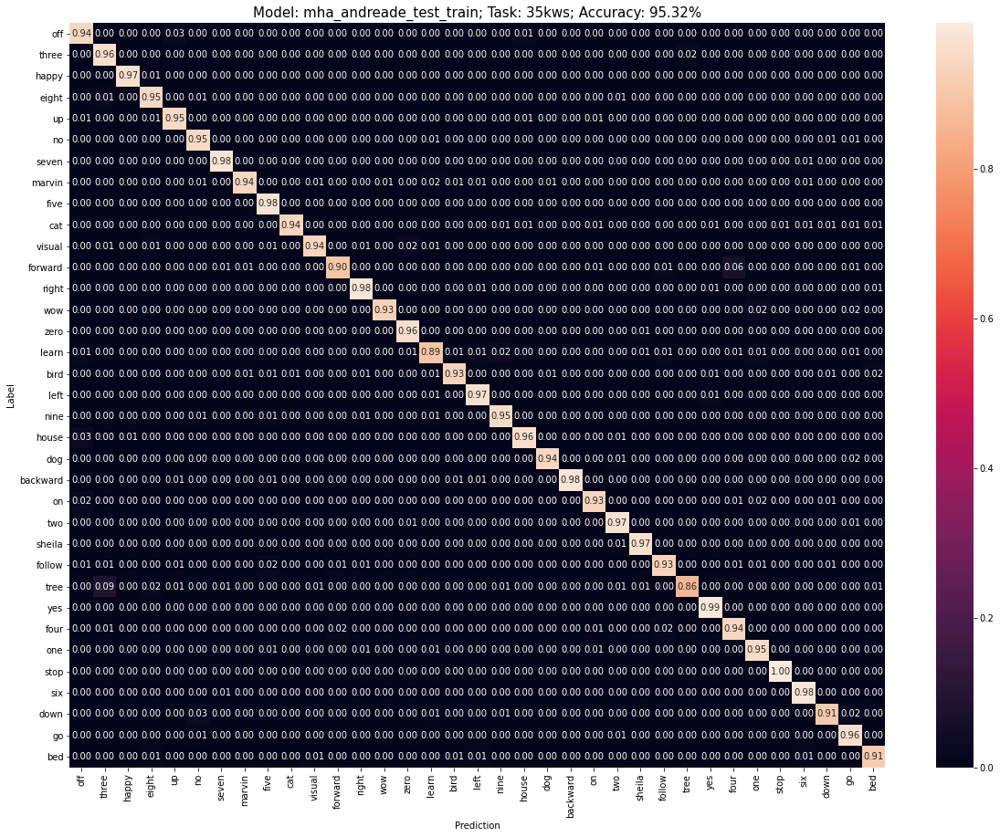

Input shape: (16000,)


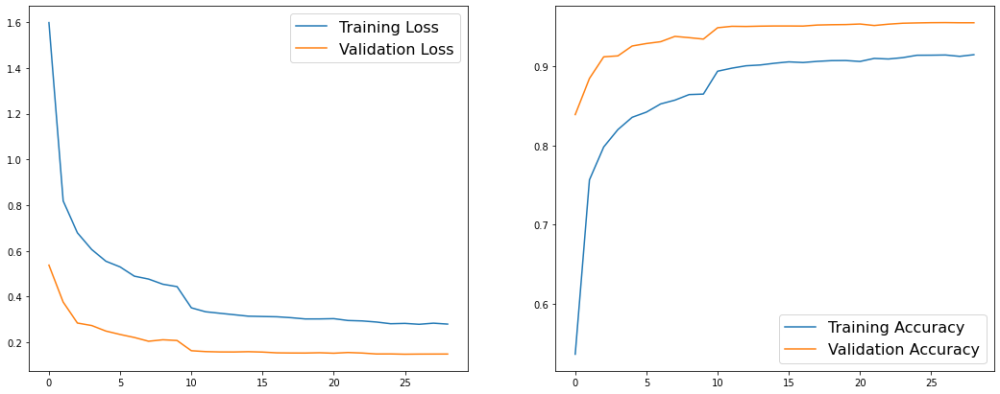

Test set accuracy: 95.329%


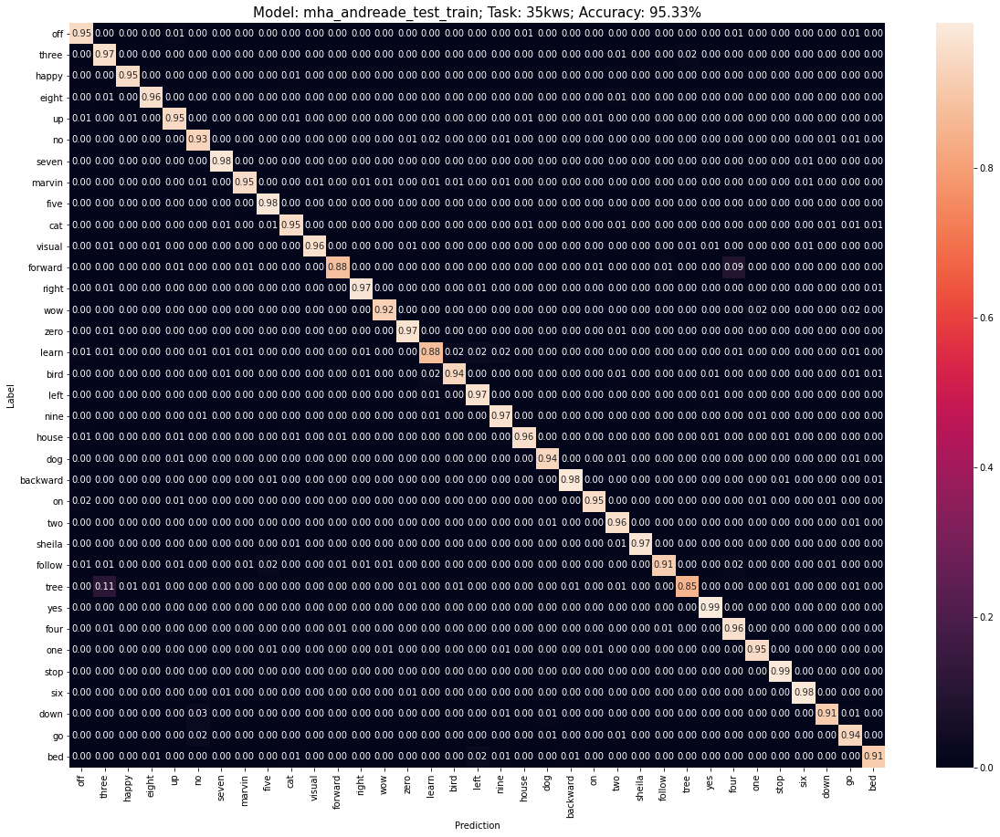

Input shape: (16000,)


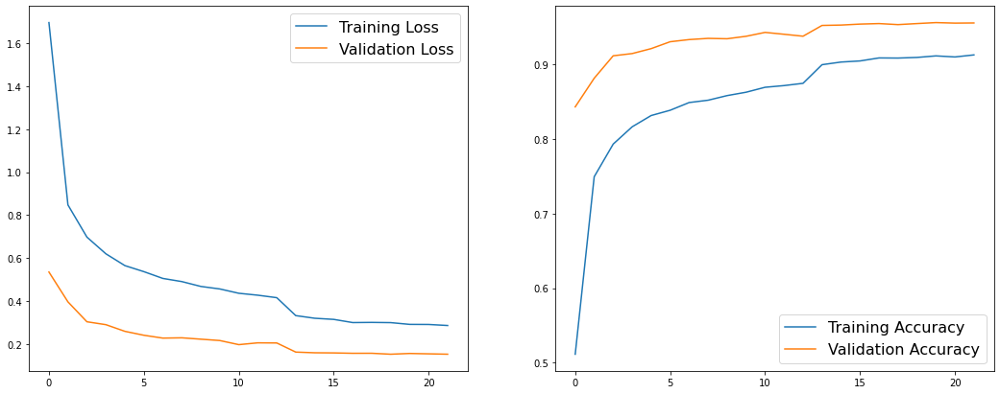

Test set accuracy: 95.102%


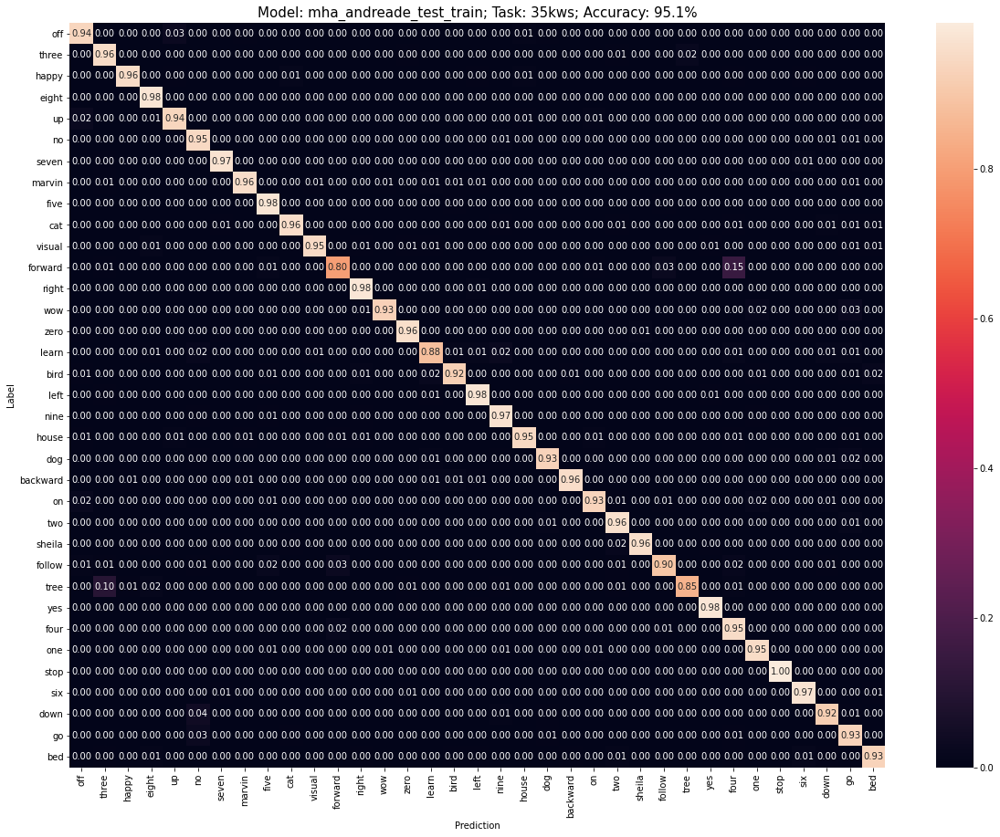

In [46]:
for n_heads in [2,3,4,5]:
    current_mha_model = mha_andreade(train_dataset, output_classes, "test_train", mfccs=True, n_heads=n_heads)
    current_mha_model.load_weights(f"models/{current_task}/mha_andreade_mfccs_{n_heads}heads/weights").expect_partial()
    with (open(f"models/{current_task}/mha_andreade_mfccs_{n_heads}heads/train_history.pkl", "rb")) as openfile:
        history_current_mha_model = pickle.load(openfile)
    plot_learning_curves(history_current_mha_model['train_history'])
    y_scores, att_scores, test_acc = make_confmatrix(current_mha_model, test_dataset)
    results_35kws_task = update_results(results_35kws_task, 
                                    current_mha_model, 
                                    f"MHattRNN_{n_heads}heads", 
                                    y_scores, 
                                    att_scores, 
                                    test_acc)

## ResnetAttention

Input shape: (16000,)


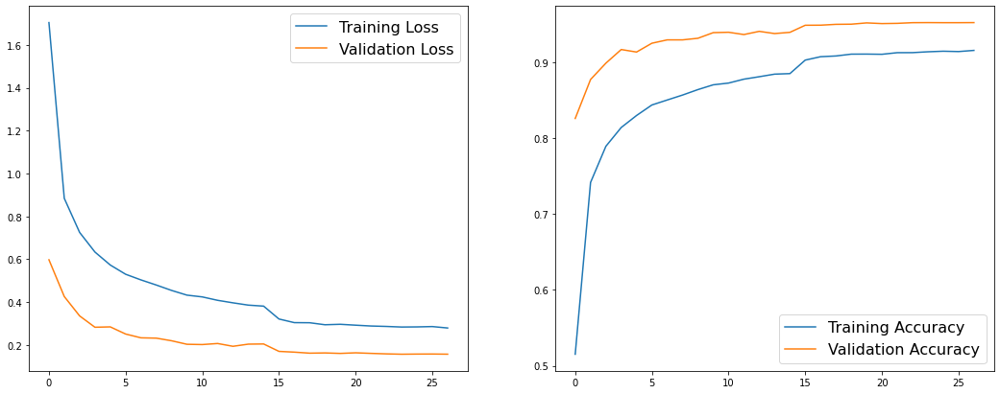

2021-08-31 12:08:04.620879: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 94.621%


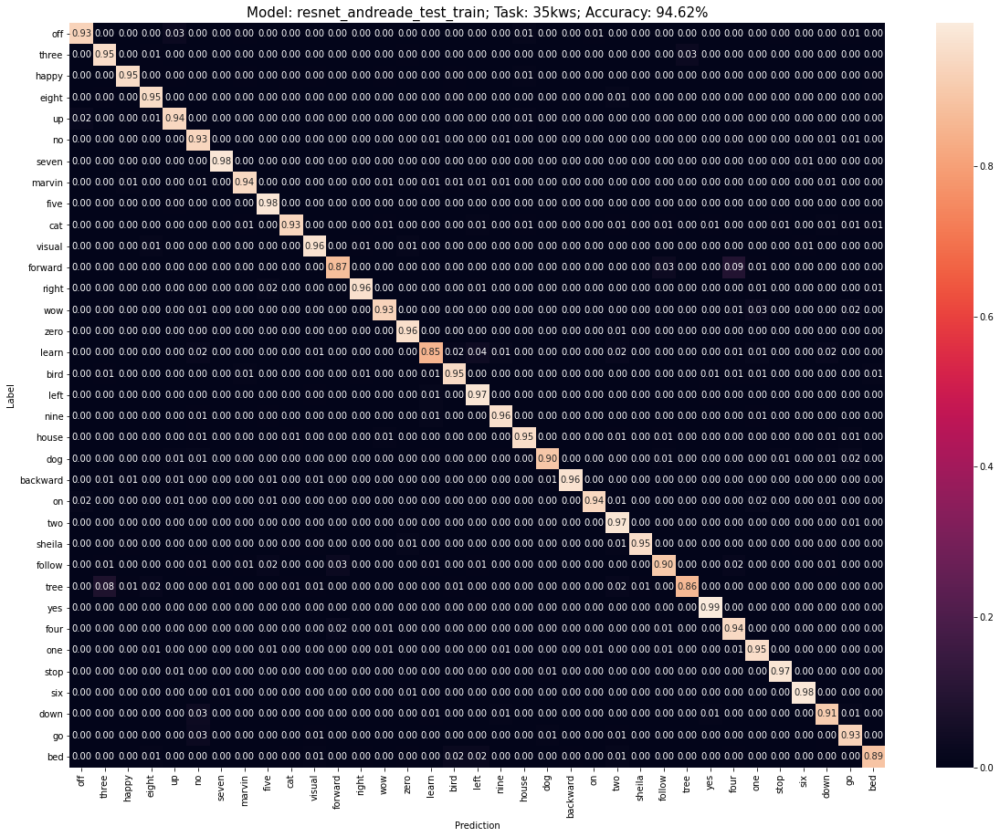

Input shape: (16000,)


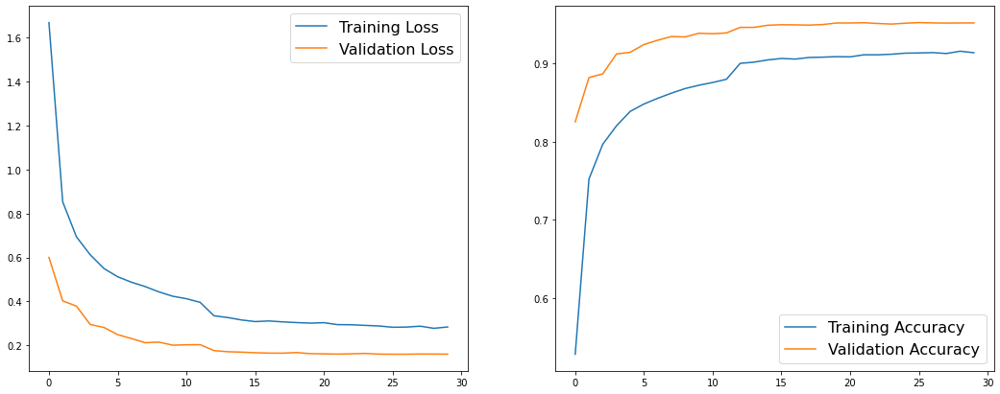

2021-08-31 12:08:13.297355: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 94.721%


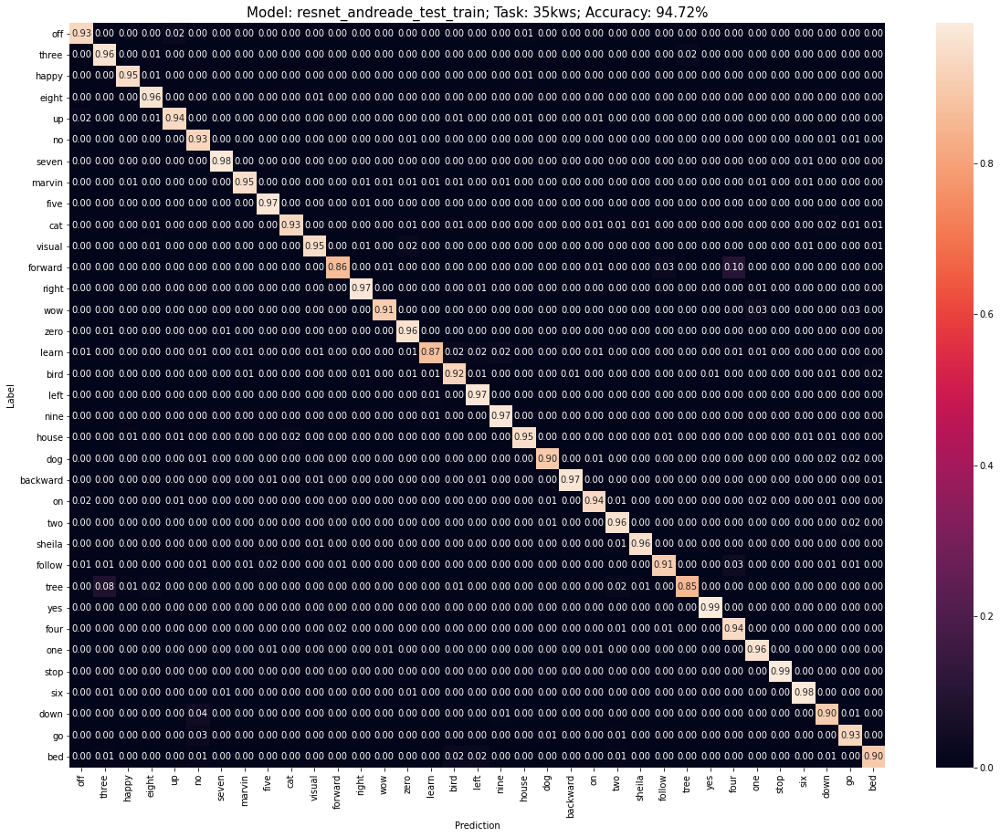

Input shape: (16000,)


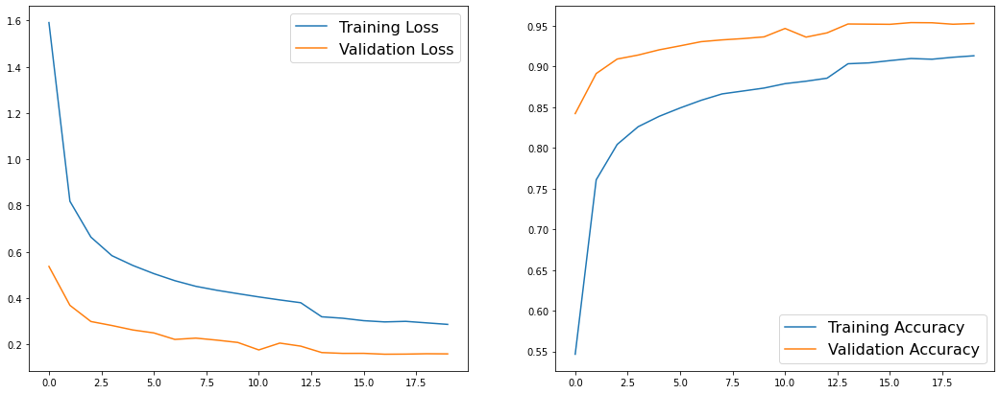

2021-08-31 12:08:22.297511: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:689] Error in PredictCost() for the op: op: "Softmax" attr { key: "T" value { type: DT_FLOAT } } inputs { dtype: DT_FLOAT shape { unknown_rank: true } } device { type: "GPU" vendor: "NVIDIA" model: "GeForce GTX 1060 6GB" frequency: 1784 num_cores: 10 environment { key: "architecture" value: "6.1" } environment { key: "cuda" value: "11020" } environment { key: "cudnn" value: "8100" } num_registers: 65536 l1_cache_size: 24576 l2_cache_size: 1572864 shared_memory_size_per_multiprocessor: 98304 memory_size: 5059510272 bandwidth: 192192000 } outputs { dtype: DT_FLOAT shape { unknown_rank: true } }


Test set accuracy: 94.830%


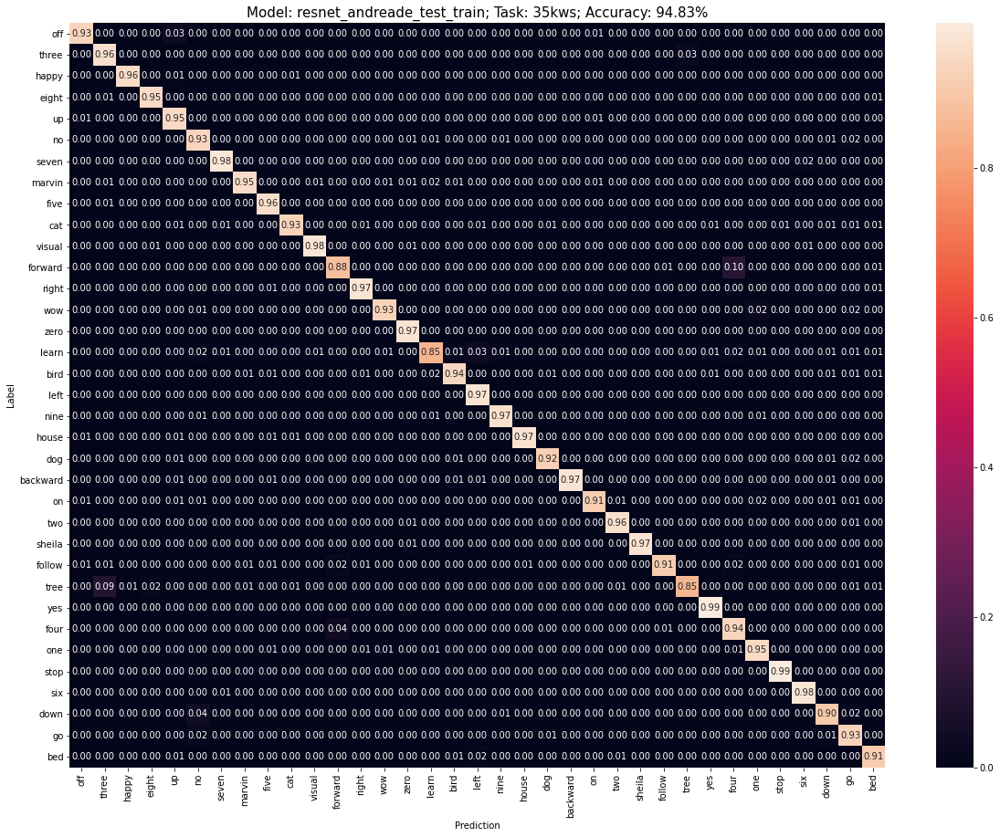

In [47]:
for n_layers in [3,4,5]:
    current_resnet_model = resnet_andreade(train_dataset, output_classes, "test_train", mfccs=True, n_res_blocks=n_layers)
    current_resnet_model.load_weights(f"models/{current_task}/resnet_andreade_mfccs_{n_layers}_layers/weights").expect_partial()
    
    with (open(f"models/{current_task}/resnet_andreade_mfccs_{n_layers}_layers/train_history.pkl", "rb")) as openfile:
        history_current_resnet_model = pickle.load(openfile)
    plot_learning_curves(history_current_resnet_model['train_history'])
    
    y_scores, att_scores, test_acc = make_confmatrix(current_resnet_model, test_dataset)
    results_35kws_task = update_results(results_35kws_task, 
                                    current_resnet_model, 
                                    f"ResAndreade_{n_layers}layers", 
                                    y_scores, 
                                    att_scores, 
                                    test_acc)
    del current_resnet_model

In [48]:
results_35kws_task.keys()

dict_keys(['SimpleAttModel', 'AndreadeOriginal', 'AndreadeSeqQuery', 'SeqQueryNoCNN', 'MHattRNN_2heads', 'MHattRNN_3heads', 'MHattRNN_4heads', 'MHattRNN_5heads', 'ResAndreade_3layers', 'ResAndreade_4layers', 'ResAndreade_5layers'])

In [49]:
## Save all the results to disk
with open(hyperparams._MODELS_DIR_/current_task/'all_results.pkl', 'wb') as outp:
    pickle.dump(results_35kws_task, outp, pickle.HIGHEST_PROTOCOL)

## Seq Query MHA

In [5]:
current_task

'35kws'

In [6]:
results_35kws_task = {}
results_35kws_task

{}

Input shape: (16000,)


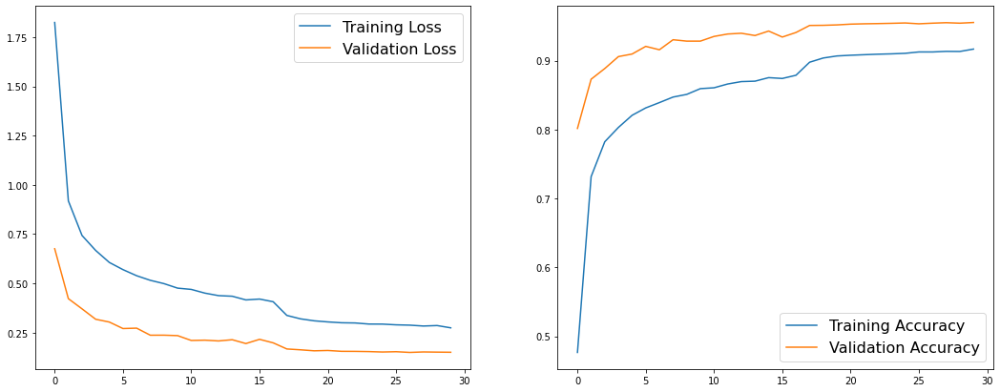

2021-08-31 12:42:00.699423: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcufft.so.10
2021-08-31 12:42:00.806489: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2021-08-31 12:42:01.841034: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublasLt.so.11
2021-08-31 12:42:01.855853: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2021-08-31 12:42:02.845823: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8100


Test set accuracy: 95.393%


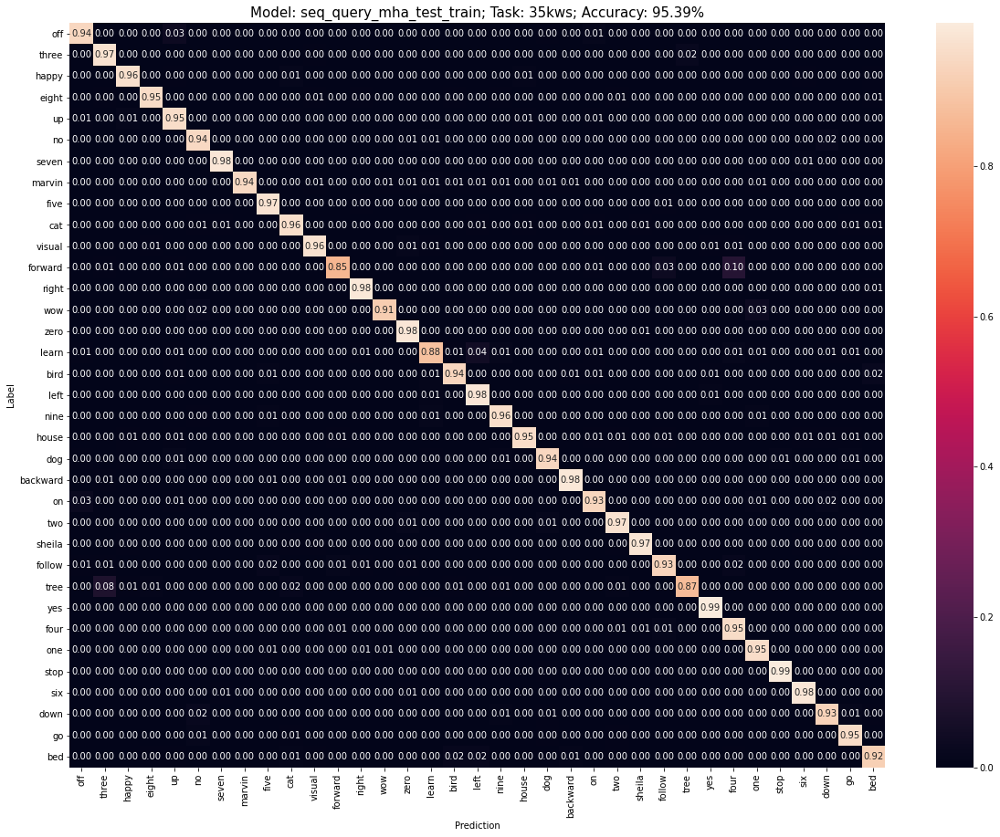

Input shape: (16000,)


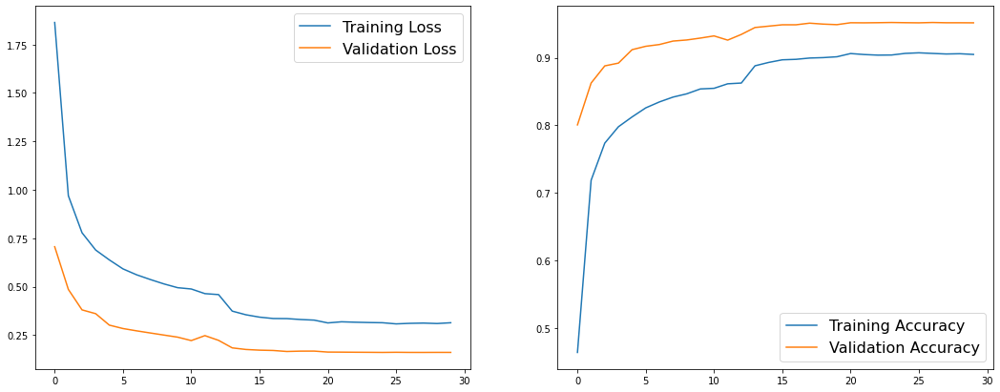

2021-08-31 12:42:18.927381: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1268304240 exceeds 10% of free system memory.


Test set accuracy: 94.403%


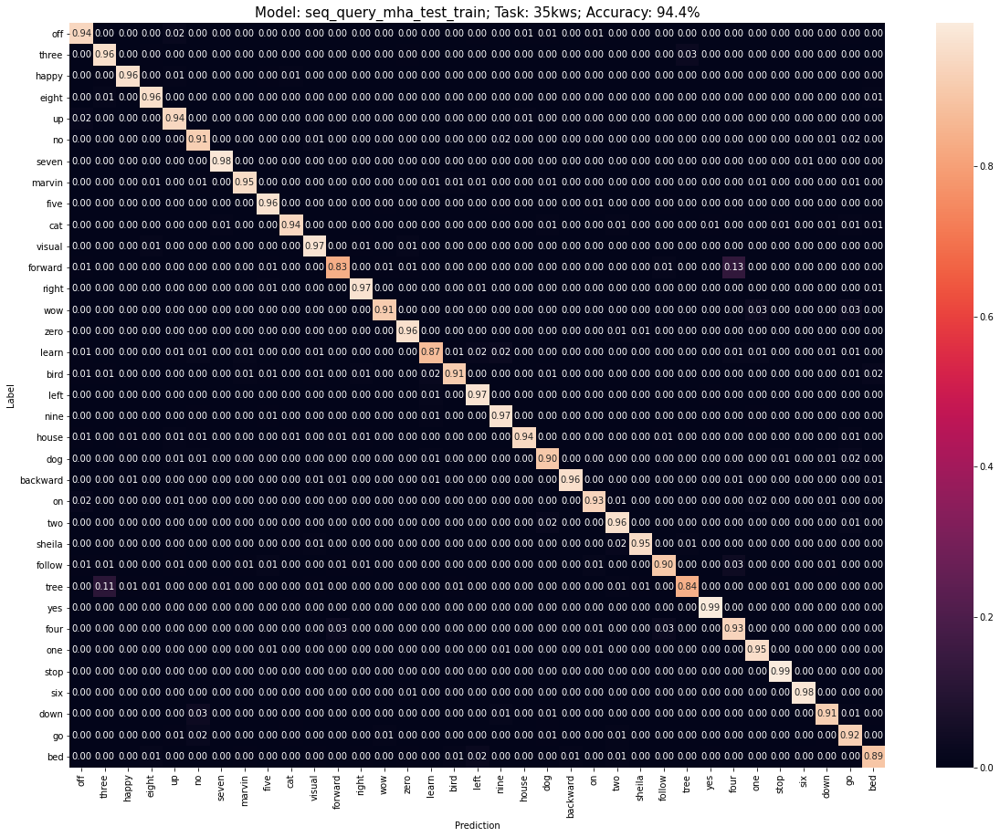

Input shape: (16000,)


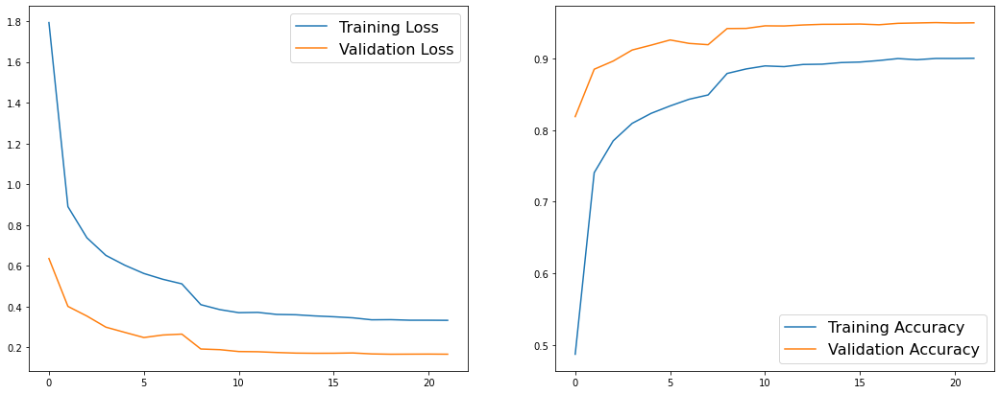

2021-08-31 12:42:29.899873: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1691072320 exceeds 10% of free system memory.


Test set accuracy: 94.339%


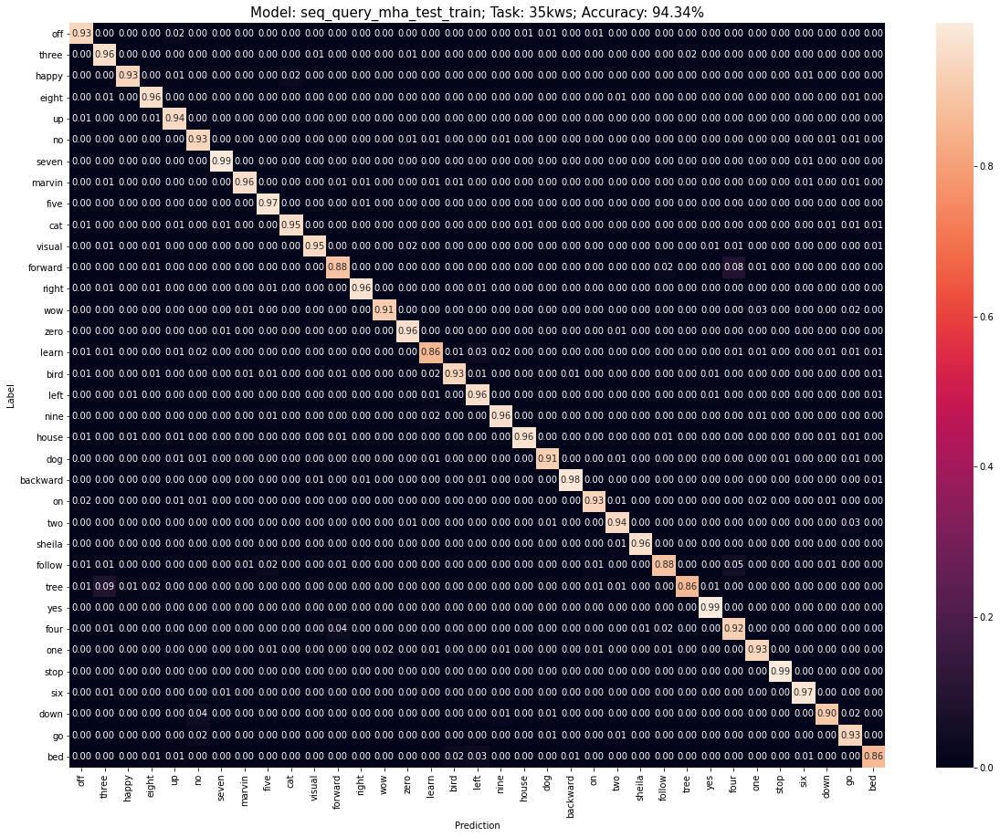

Input shape: (16000,)


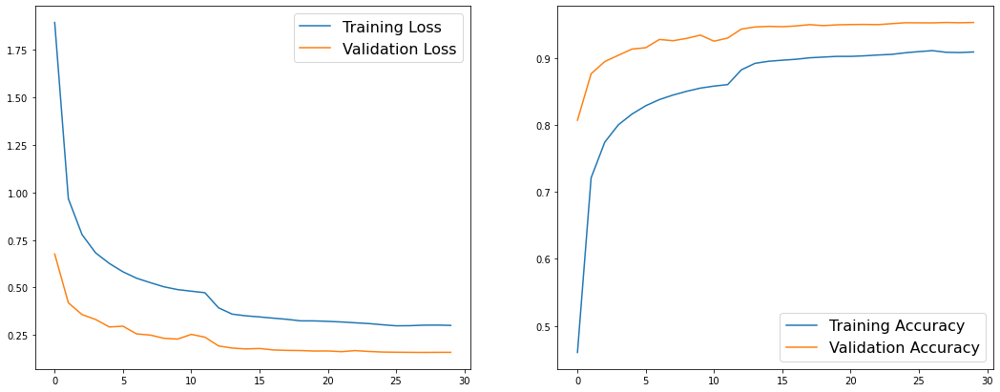

2021-08-31 12:42:42.214409: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 2113840400 exceeds 10% of free system memory.


Test set accuracy: 94.975%


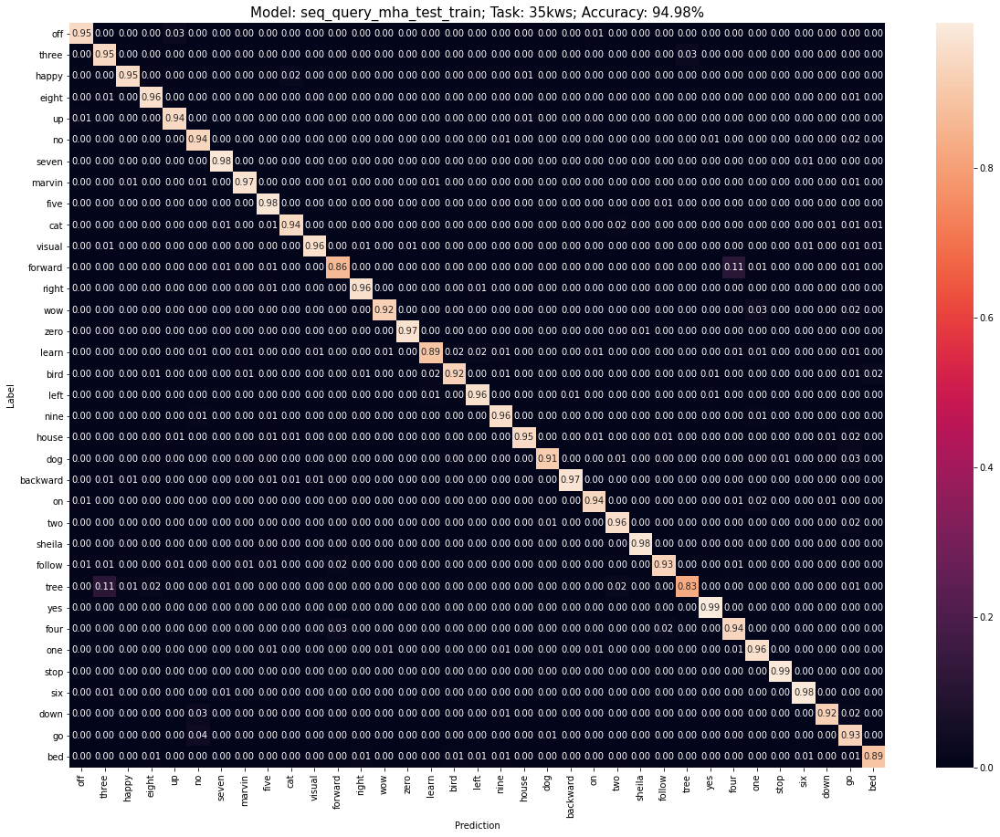

In [7]:
for n_heads in [2,3,4,5]:
    current_sq_mha_model = seq_query_mha_andreade(train_dataset, output_classes, "test_train", mfccs=True, n_heads=n_heads)
    current_sq_mha_model.load_weights(f"models/{current_task}/seq_query_mha_mfccs_{n_heads}heads_2rnn_layers/weights").expect_partial()
    with (open(f"models/{current_task}/seq_query_mha_mfccs_{n_heads}heads_2rnn_layers/train_history.pkl", "rb")) as openfile:
        history_current_sq_mha_model = pickle.load(openfile)
    plot_learning_curves(history_current_sq_mha_model['train_history'])
    y_scores, att_scores, test_acc = make_confmatrix(current_sq_mha_model, test_dataset)
    results_35kws_task = update_results(results_35kws_task, 
                                    current_sq_mha_model, 
                                    f"SQMHattRNN_{n_heads}heads", 
                                    y_scores, 
                                    att_scores, 
                                    test_acc)

In [8]:
results_35kws_task.keys()

dict_keys(['SQMHattRNN_2heads', 'SQMHattRNN_3heads', 'SQMHattRNN_4heads', 'SQMHattRNN_5heads'])

In [9]:
## Save SQMHA results to disk
with open(hyperparams._MODELS_DIR_/current_task/'results_SQMHA.pkl', 'wb') as outp:
    pickle.dump(results_35kws_task, outp, pickle.HIGHEST_PROTOCOL)

# Roc Curves

In [23]:
sns.set_context("paper")

In [7]:
with (open(f"models/10kws+U+S/all_results.pkl", "rb")) as openfile:
        results_12kws_task = pickle.load(openfile)
        
with (open(f"models/35kws/all_results.pkl", "rb")) as openfile:
        results_35kws_task = pickle.load(openfile)

In [8]:
results_12kws_task.keys()

dict_keys(['SimpleAttModel', 'AndreadeOriginal', 'AndreadeSeqQuery', 'SeqQueryNoCNN', 'MHattRNN_2heads', 'MHattRNN_3heads', 'MHattRNN_4heads', 'MHattRNN_5heads', 'SQMHattRNN_2heads', 'SQMHattRNN_3heads', 'SQMHattRNN_4heads', 'SQMHattRNN_5heads', 'ResAndreade_2layers', 'ResAndreade_3layers', 'ResAndreade_4layers', 'ResAndreade_5layers'])

In [9]:
results_12kws_task['AndreadeOriginal'].keys()

dict_keys(['y_scores', 'att_scores', 'test_acc', 'n_params', 'fpr', 'fnr', 'roc_auc'])

In [27]:
selected_models = ['SimpleAttModel', 
                   'AndreadeOriginal', 
                   'AndreadeSeqQuery', 
                   'SeqQueryNoCNN', 
                   'MHattRNN_2heads', 
                   'MHattRNN_3heads', 
                   'MHattRNN_4heads',
#                    'MHattRNN_5heads', 
                   'ResAndreade_3layers', 
                   'ResAndreade_4layers', 
                   'ResAndreade_5layers']

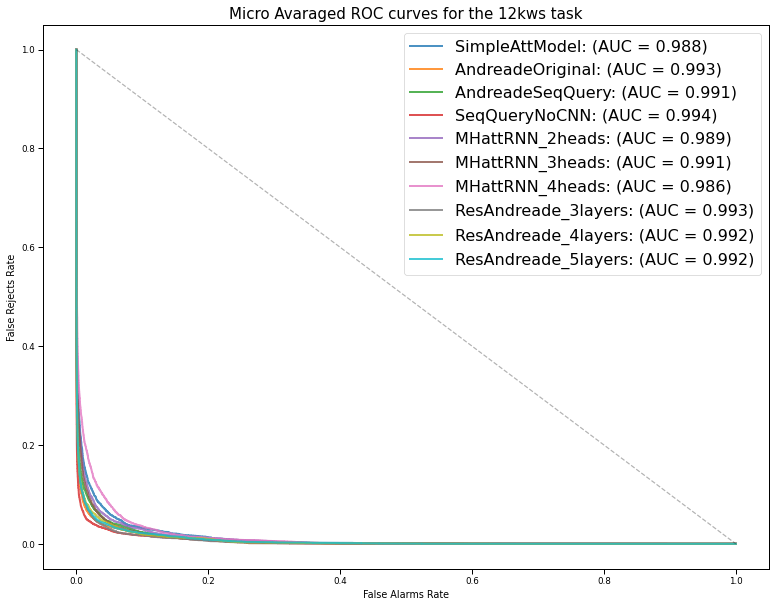

In [29]:
plt.figure(figsize=(13,10))
# for model in ["AndreadeOriginal"]:
# for model in results_12kws_task.keys():
for model in selected_models:
    fpr =results_12kws_task[model]['fpr']
    fnr = results_12kws_task[model]['fnr']
    roc_auc = results_12kws_task[model]['roc_auc']

    plt.plot(fpr["micro"], fnr["micro"],
#              color='deeppink', 
             linestyle='-', linewidth=2, label=f'{model}: (AUC = {round(roc_auc["micro"],3)})', alpha=0.8)
plt.plot((0,1),(1,0), linestyle="--", color="black", alpha=0.3)
plt.xlabel("False Alarms Rate")
plt.ylabel("False Rejects Rate")
plt.title("Micro Avaraged ROC curves for the 12kws task", fontsize=15)
plt.legend(fontsize=16)
plt.show()

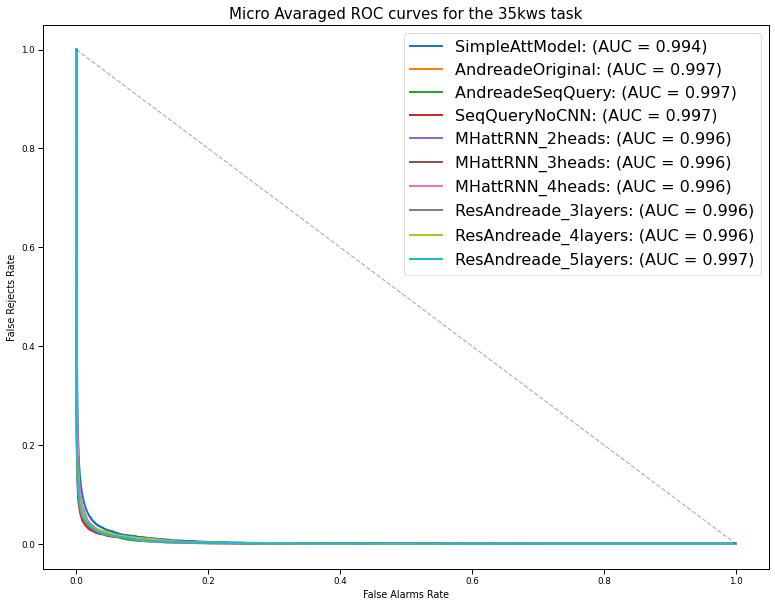

In [30]:
plt.figure(figsize=(13,10))
# for model in ["AndreadeOriginal"]:
# for model in results_12kws_task.keys():
for model in selected_models:
    fpr =results_35kws_task[model]['fpr']
    fnr = results_35kws_task[model]['fnr']
    roc_auc = results_35kws_task[model]['roc_auc']

    plt.plot(fpr["micro"], fnr["micro"],
#              color='deeppink', 
             linestyle='-', linewidth=2, label=f'{model}: (AUC = {round(roc_auc["micro"],3)})')
plt.plot((0,1),(1,0), linestyle="--", color="black", alpha=0.3)
plt.xlabel("False Alarms Rate")
plt.ylabel("False Rejects Rate")
plt.title("Micro Avaraged ROC curves for the 35kws task", fontsize=15)
plt.legend(fontsize=16)
plt.show()

## N.Params vs Accuracy

In [4]:
with (open(f"models/10kws+U+S/all_results.pkl", "rb")) as openfile:
        results_12kws_task = pickle.load(openfile)
        
with (open(f"models/35kws/all_results.pkl", "rb")) as openfile:
        results_35kws_task = pickle.load(openfile)

print(results_12kws_task.keys())
print(results_12kws_task['AndreadeOriginal'].keys())

dict_keys(['SimpleAttModel', 'AndreadeOriginal', 'AndreadeSeqQuery', 'SeqQueryNoCNN', 'MHattRNN_2heads', 'MHattRNN_3heads', 'MHattRNN_4heads', 'MHattRNN_5heads', 'SQMHattRNN_2heads', 'SQMHattRNN_3heads', 'SQMHattRNN_4heads', 'SQMHattRNN_5heads', 'ResAndreade_2layers', 'ResAndreade_3layers', 'ResAndreade_4layers', 'ResAndreade_5layers'])
dict_keys(['y_scores', 'att_scores', 'test_acc', 'n_params', 'fpr', 'fnr', 'roc_auc'])


In [5]:
with (open(f"models/35kws/results_SQMHA.pkl", "rb")) as openfile:
        results_35kws_task_SQMHA = pickle.load(openfile)

In [6]:
results_35kws_task_SQMHA.keys()

dict_keys(['SQMHattRNN_2heads', 'SQMHattRNN_3heads', 'SQMHattRNN_4heads', 'SQMHattRNN_5heads'])

In [7]:
for i in [2,3,4,5]:
    results_35kws_task[f'SQMHattRNN_{i}heads'] = results_35kws_task_SQMHA[f'SQMHattRNN_{i}heads']

In [8]:
print(results_35kws_task.keys())
print(results_35kws_task['AndreadeOriginal'].keys())

dict_keys(['SimpleAttModel', 'AndreadeOriginal', 'AndreadeSeqQuery', 'SeqQueryNoCNN', 'MHattRNN_2heads', 'MHattRNN_3heads', 'MHattRNN_4heads', 'MHattRNN_5heads', 'ResAndreade_3layers', 'ResAndreade_4layers', 'ResAndreade_5layers', 'SQMHattRNN_2heads', 'SQMHattRNN_3heads', 'SQMHattRNN_4heads', 'SQMHattRNN_5heads'])
dict_keys(['y_scores', 'att_scores', 'test_acc', 'n_params', 'fpr', 'fnr', 'roc_auc'])


In [9]:
selected_models = [
#                     'SimpleAttModel', 
                   'AndreadeOriginal', 
                   'AndreadeSeqQuery', 
                   'SeqQueryNoCNN', 
                   'MHattRNN_2heads', 
                   'MHattRNN_3heads', 
                   'MHattRNN_4heads', 
                   'MHattRNN_5heads', 
                   'ResAndreade_3layers', 
                   'ResAndreade_4layers', 
                   'ResAndreade_5layers',
                  'SQMHattRNN_2heads',
                  'SQMHattRNN_3heads',
                  'SQMHattRNN_4heads',
                  'SQMHattRNN_5heads']

names = {'SimpleAttModel': 'SimpleAtt',
       'AndreadeOriginal': 'Att-RNN',
       'AndreadeSeqQuery': 'SQAtt-RNN',
       'SeqQueryNoCNN': 'SQ-noCNN',
       'MHattRNN_2heads': 'MHatt-RNN2',
       'MHattRNN_3heads':'MHAtt-RNN3',
       'MHattRNN_4heads':'MHAtt-RNN4',
       'MHattRNN_5heads':'MHAtt-RNN5',
       'ResAndreade_3layers':'ResAtt3',
       'ResAndreade_4layers': 'ResAtt4',
       'ResAndreade_5layers': 'ResAtt5',
      'SQMHattRNN_2heads':'SQMHAtt-RNN2',
      'SQMHattRNN_3heads': 'SQMHAtt-RNN3',
      'SQMHattRNN_4heads':'SQMHAtt-RNN4',
         'SQMHattRNN_5heads':'SQMHAtt-RNN5'
    
}



In [10]:
cpal = sns.color_palette('deep')
cpal

[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

In [11]:
sns.set_context("paper")
sns.set_style("whitegrid")
# sns.set_style("darkgrid")

In [106]:
# c_mha = 'orange'
# c_res = 'cyan'
# c_sq_mha = 'green'
# c_simple = 'grey'
# c_orig = 'black'
# c_sq = 'purple'
# c_no_cnn = 'red'

c_mha = cpal[0]
c_res = cpal[1]
c_sq_mha = cpal[2]
c_simple = cpal[3]
c_orig = cpal[4]
c_sq = cpal[5]
c_no_cnn = cpal[6]

colors = {'SimpleAttModel': c_simple,
       'AndreadeOriginal': c_orig,
       'AndreadeSeqQuery': c_sq,
       'SeqQueryNoCNN': c_no_cnn,
       'MHattRNN_2heads': c_mha,
       'MHattRNN_3heads':c_mha,
       'MHattRNN_4heads':c_mha,
       'MHattRNN_5heads':c_mha,
       'ResAndreade_3layers':c_res,
       'ResAndreade_4layers': c_res,
       'ResAndreade_5layers': c_res,
      'SQMHattRNN_2heads':c_sq_mha,
      'SQMHattRNN_3heads': c_sq_mha,
      'SQMHattRNN_4heads':c_sq_mha,
           'SQMHattRNN_5heads':c_sq_mha
    
}

mrk_mha = 'v'
mrk_res = 's'
mrk_sq_mha = 'X'
mrk_simple = 'o'
mrk_orig = 'o'
mrk_sq = 'o'
mrk_no_cnn = 'D'

markers = {'SimpleAttModel': mrk_simple,
       'AndreadeOriginal': mrk_orig,
       'AndreadeSeqQuery': mrk_sq,
       'SeqQueryNoCNN': mrk_no_cnn,
       'MHattRNN_2heads': mrk_mha,
       'MHattRNN_3heads':mrk_mha,
       'MHattRNN_4heads':mrk_mha,
       'MHattRNN_5heads':mrk_mha,
       'ResAndreade_3layers':mrk_res,
       'ResAndreade_4layers': mrk_res,
       'ResAndreade_5layers': mrk_res,
      'SQMHattRNN_2heads':mrk_sq_mha,
      'SQMHattRNN_3heads': mrk_sq_mha,
      'SQMHattRNN_4heads':mrk_sq_mha,
          'SQMHattRNN_5heads':mrk_sq_mha}

base_offset = (1000,0.0005)

offsets = {
    'SimpleAttModel': (base_offset[0] , base_offset[1] ),
    'AndreadeOriginal': (base_offset[0] - 18000 , base_offset[1] -0.0013 ),
    'AndreadeSeqQuery': (base_offset[0] - 10000 , base_offset[1]),
    'SeqQueryNoCNN': (base_offset[0] - 8000 , base_offset[1]),
    'MHattRNN_2heads': (base_offset[0] , base_offset[1] - 0.001 ),
    'MHattRNN_3heads': (base_offset[0] + 4000 , base_offset[1] - 0.0005 ),
    'MHattRNN_4heads': (base_offset[0] , base_offset[1] - 0.001 ),
    'MHattRNN_5heads': (base_offset[0] , base_offset[1] ),
    'ResAndreade_3layers': (base_offset[0] - 8000 , base_offset[1]),
    'ResAndreade_4layers': (base_offset[0] +2000, base_offset[1] -0.0004),
    'ResAndreade_5layers': (base_offset[0]+2000 , base_offset[1] -0.0004),
    'SQMHattRNN_2heads': (base_offset[0]-16000, base_offset[1], 0.001),
    'SQMHattRNN_3heads': (base_offset[0], base_offset[1]),
    'SQMHattRNN_4heads': (base_offset[0] + 4000, base_offset[1] - 0.001),
    'SQMHattRNN_5heads': (base_offset[0] - 30000, base_offset[1] - 0.0002)}

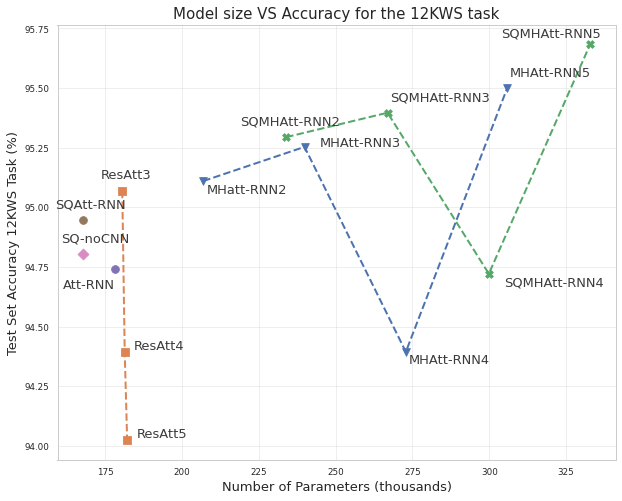

In [107]:
plt.figure(figsize=(10,8))
for model in selected_models:
    pars = results_12kws_task[model]['n_params']
    acc = results_12kws_task[model]['test_acc']
    plt.scatter(pars/1000., 100*acc, s=60, color = colors[model], marker = markers[model])
#     plt.text(pars + offs_x, acc + offs_y, names[model], fontsize=14, alpha=0.7)
    plt.text((pars + offsets[model][0])/1000., 100*(acc + offsets[model][1]), names[model], fontsize=13, alpha=0.9)

plt.plot(
    [results_12kws_task[f'MHattRNN_{i}heads']['n_params']/1000. for i in [2,3,4,5]],
    [results_12kws_task[f'MHattRNN_{i}heads']['test_acc']*100 for i in [2,3,4,5]],
    '--',
    lw=2,
    color = c_mha, 
    )

plt.plot(
    [results_12kws_task[f'SQMHattRNN_{i}heads']['n_params']/1000. for i in [2,3,4,5]],
    [results_12kws_task[f'SQMHattRNN_{i}heads']['test_acc']*100 for i in [2,3,4,5]],
    '--',
    lw=2,
    color = c_sq_mha, 

)

plt.plot(
    [results_12kws_task[f'ResAndreade_{i}layers']['n_params']/1000. for i in [3,4,5]],
    [results_12kws_task[f'ResAndreade_{i}layers']['test_acc']*100 for i in [3,4,5]],
    '--',
    lw=2,
    color = c_res 
    )


plt.xlabel("Number of Parameters (thousands)", fontsize=13)
plt.ylabel("Test Set Accuracy 12KWS Task (%)", fontsize=13)
plt.grid(alpha=0.4)
plt.title("Model size VS Accuracy for the 12KWS task", fontsize=15)
plt.savefig(hyperparams._MODELS_DIR_/"10kws+U+S/size_vs_accuracy12.pdf")
plt.show()

In [108]:
base_offset = (1000,0.0003)

offsets = {
    'SimpleAttModel': (base_offset[0] + 0, base_offset[1] ),
    'AndreadeOriginal': (base_offset[0] , base_offset[1] ),
    'AndreadeSeqQuery': (base_offset[0] , base_offset[1]-0.0008),
    'SeqQueryNoCNN': (base_offset[0] - 9000  , base_offset[1] ),
    'MHattRNN_2heads': (base_offset[0] + 2000 , base_offset[1] - 0.0002),
    'MHattRNN_3heads': (base_offset[0] , base_offset[1]),
    'MHattRNN_4heads': (base_offset[0] , base_offset[1]),
    'MHattRNN_5heads': (base_offset[0] , base_offset[1]),
    'ResAndreade_3layers': (base_offset[0] , base_offset[1]),
    'ResAndreade_4layers': (base_offset[0] , base_offset[1]),
    'ResAndreade_5layers': (base_offset[0] , base_offset[1]),
    'SQMHattRNN_2heads': (base_offset[0] - 20000 , base_offset[1] - 0.0001),
    'SQMHattRNN_3heads': (base_offset[0] , base_offset[1] ),
    'SQMHattRNN_4heads': (base_offset[0] + 2000 , base_offset[1] ),
'SQMHattRNN_5heads': (base_offset[0] - 29000 , base_offset[1] )}

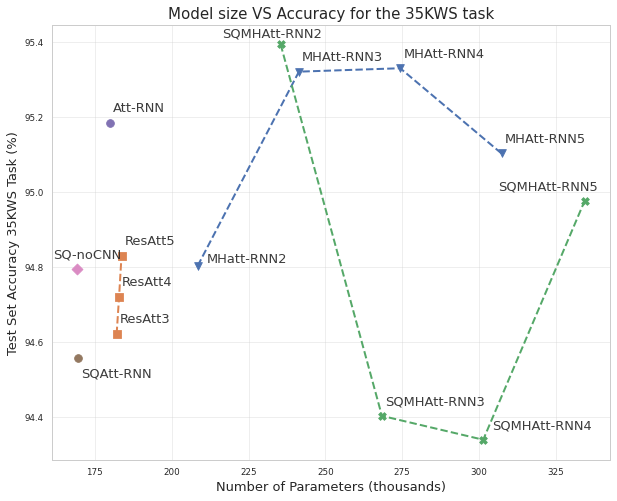

In [109]:
plt.figure(figsize=(10,8))
for model in selected_models:
    pars = results_35kws_task[model]['n_params']
    acc = results_35kws_task[model]['test_acc']
    plt.scatter(pars/1000., 100*acc, s=60, color = colors[model], marker = markers[model])
#     plt.text(pars + offs_x, acc + offs_y, names[model], fontsize=14, alpha=0.7)
    plt.text((pars + offsets[model][0])/1000., 100*(acc + offsets[model][1]), names[model], fontsize=13, alpha=0.9)

plt.plot(
    [results_35kws_task[f'MHattRNN_{i}heads']['n_params']/1000. for i in [2,3,4,5]],
    [results_35kws_task[f'MHattRNN_{i}heads']['test_acc']*100 for i in [2,3,4,5]],
    '--',
    lw=2,
    color = c_mha, 
    )

plt.plot(
    [results_35kws_task[f'SQMHattRNN_{i}heads']['n_params']/1000. for i in [2,3,4,5]],
    [results_35kws_task[f'SQMHattRNN_{i}heads']['test_acc']*100 for i in [2,3,4,5]],
    '--',
    lw=2,
    color = c_sq_mha, 
    )

plt.plot(
    [results_35kws_task[f'ResAndreade_{i}layers']['n_params']/1000. for i in [3,4,5]],
    [results_35kws_task[f'ResAndreade_{i}layers']['test_acc']*100 for i in [3,4,5]],
    '--',
    lw=2,
    color = c_res 
    )


plt.xlabel("Number of Parameters (thousands)", fontsize=13)
plt.ylabel("Test Set Accuracy 35KWS Task (%)", fontsize=13)
plt.grid(alpha=0.4)
plt.title("Model size VS Accuracy for the 35KWS task", fontsize=15)
plt.savefig(hyperparams._MODELS_DIR_/"35kws/size_vs_accuracy35.pdf")
plt.show()

## Test Accs

In [155]:
s_models_best12 = ['SimpleAttModel',
                 'AndreadeOriginal',
                 'AndreadeSeqQuery',
                 'SeqQueryNoCNN',
#                  'MHattRNN_2heads',
#                  'MHattRNN_3heads',
#                  'MHattRNN_4heads',
                 'MHattRNN_5heads',
                 'ResAndreade_3layers',
#                  'ResAndreade_4layers',
#                  'ResAndreade_5layers',
#                  'SQMHattRNN_2heads',
                 'SQMHattRNN_3heads']
#                  'SQMHattRNN_4heads']

s_models_best35 = ['SimpleAttModel',
                 'AndreadeOriginal',
                 'AndreadeSeqQuery',
                 'SeqQueryNoCNN',
#                  'MHattRNN_2heads',
#                  'MHattRNN_3heads',
                 'MHattRNN_4heads',
#                  'MHattRNN_5heads',
#                  'ResAndreade_3layers',
#                  'ResAndreade_4layers',
                 'ResAndreade_5layers',
                 'SQMHattRNN_2heads']
#                  'SQMHattRNN_3heads']
#                  'SQMHattRNN_4heads']

In [161]:
results_12kws_task["AndreadeOriginal"]['n_params']

178259

In [162]:
results_35kws_task["AndreadeOriginal"]['n_params']

179754

In [159]:
accs_12 = [results_12kws_task[m]['test_acc']*100 for m in s_models_best]

In [158]:
accs_35 = [results_35kws_task[m]['test_acc']*100 for m in s_models_best]

## Class specific ROC curves

In [180]:
current_task = hyperparams._TASKS_[0]
print(current_task)
core_kws, aux_kws, output_classes = get_kws(hyperparams._DATA_DIR_, current_task)
print("Output Classes: ", output_classes)

10kws+U+S
Output Classes:  ['yes', 'no', 'up', 'down', 'left', 'right', 'on', 'off', 'stop', 'go', 'filler', 'silence']


In [181]:
selected_models

['SimpleAttModel',
 'AndreadeOriginal',
 'AndreadeSeqQuery',
 'SeqQueryNoCNN',
 'MHattRNN_2heads',
 'MHattRNN_3heads',
 'MHattRNN_4heads',
 'MHattRNN_5heads',
 'ResAndreade_3layers',
 'ResAndreade_4layers',
 'ResAndreade_5layers',
 'SQMHattRNN_2heads',
 'SQMHattRNN_3heads',
 'SQMHattRNN_4heads']

In [182]:
results_12kws_task['AndreadeOriginal']['fpr'].keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 'micro'])

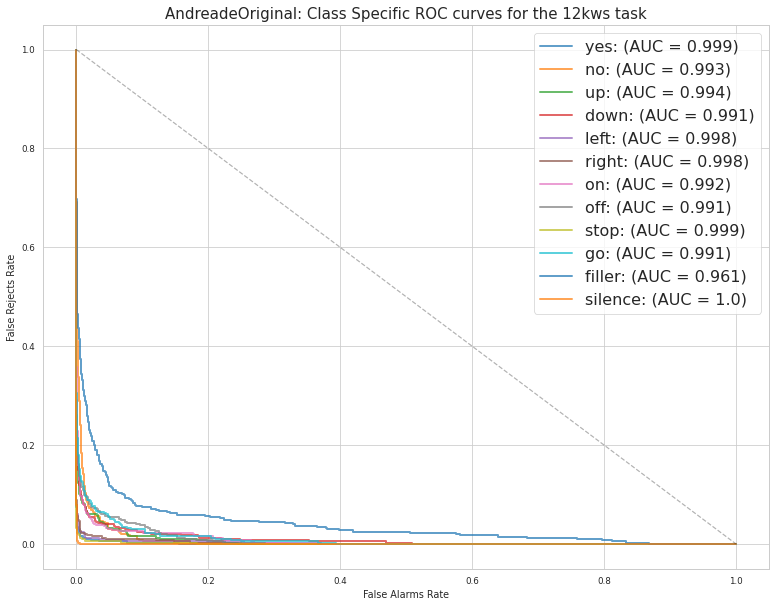

In [183]:
plt.figure(figsize=(13,10))
# for model in ["AndreadeOriginal"]:
# for model in results_12kws_task.keys():
for model in ["AndreadeOriginal"]:
    fpr =results_12kws_task[model]['fpr']
    fnr = results_12kws_task[model]['fnr']
    roc_auc = results_12kws_task[model]['roc_auc']
    
    for c in range(len(output_classes)):
        plt.plot(fpr[c], fnr[c],
    #              color='deeppink', 
                 linestyle='-', linewidth=2, label=f'{output_classes[c]}: (AUC = {round(roc_auc[c],3)})', alpha=0.7)
plt.plot((0,1),(1,0), linestyle="--", color="black", alpha=0.3)
plt.xlabel("False Alarms Rate")
plt.ylabel("False Rejects Rate")
plt.title(f"{model}: Class Specific ROC curves for the 12kws task", fontsize=15)
plt.legend(fontsize=16)
plt.show()

In [184]:
current_task = hyperparams._TASKS_[1]
print(current_task)
core_kws, aux_kws, output_classes = get_kws(hyperparams._DATA_DIR_, current_task)
print("Output Classes: ", output_classes)

35kws
Output Classes:  ['off', 'three', 'happy', 'eight', 'up', 'no', 'seven', 'marvin', 'five', 'cat', 'visual', 'forward', 'right', 'wow', 'zero', 'learn', 'bird', 'left', 'nine', 'house', 'dog', 'backward', 'on', 'two', 'sheila', 'follow', 'tree', 'yes', 'four', 'one', 'stop', 'six', 'down', 'go', 'bed']


In [188]:
# plt.figure(figsize=(13,10))
# # for model in ["AndreadeOriginal"]:
# # for model in results_12kws_task.keys():
# for model in ["AndreadeOriginal"]:
#     fpr =results_35kws_task[model]['fpr']
#     fnr = results_35kws_task[model]['fnr']
#     roc_auc = results_35kws_task[model]['roc_auc']
    
#     for c in range(len(output_classes)):
#         plt.plot(fpr[c], fnr[c],
#     #              color='deeppink', 
#                  linestyle='-', linewidth=2, label=f'{output_classes[c]}: (AUC = {round(roc_auc[c],3)})', alpha=0.7)
# plt.plot((0,1),(1,0), linestyle="--", color="black", alpha=0.3)
# plt.xlabel("False Alarms Rate")
# plt.ylabel("False Rejects Rate")
# plt.title(f"{model}: Class Specific ROC curves for the 12kws task", fontsize=15)
# plt.legend(fontsize=16)
# plt.show()

## Attention Plots

### 12 kws

In [17]:
from IPython import display
sns.set_context("paper")
sns.set_style("ticks")

In [41]:
current_task = hyperparams._TASKS_[0]
print(current_task)
core_kws, aux_kws, output_classes = get_kws(hyperparams._DATA_DIR_, current_task)
print("Output Classes: ", output_classes)

X_train, y_train, X_valid, y_valid, X_test, y_test = load_original_splits(current_task, smoke_size=-1)

batch_size = 64
train_dataset, train_steps, valid_dataset, valid_steps, test_dataset = get_tf_datasets(X_train, 
                             y_train, 
                             X_valid, 
                             y_valid, 
                             X_test, 
                             y_test, 
                             batch_size=batch_size,
                            task=current_task)

10kws+U+S
Output Classes:  ['yes', 'no', 'up', 'down', 'left', 'right', 'on', 'off', 'stop', 'go', 'filler', 'silence']
Train steps: 577
Validations steps: 70
Example of dataset element:
(<tf.Tensor: shape=(64, 16000), dtype=float32, numpy=
array([[ 5.2438723e-04,  1.2007816e-03,  2.1150047e-03, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 3.9687343e-03,  3.2551083e-04, -9.1811395e-05, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 1.7819758e-01, -1.8951995e-02, -2.9395428e-01, ...,
        -1.3361004e-01,  4.6150091e-01, -6.0698265e-01],
       ...,
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 7.7220076e-03,  3.6036037e-02,  1.5444015e-02, ...,
         2.5740026e-02, -3.8610038e-03, -2.3423423e-01],
       [-2.4454433e-03,  5.7820235e-03,  3.8961307e-03, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00]], dtype=float32)>, <tf.Tensor: shape=(64

In [42]:
atts_mha3 = results_12kws_task['MHattRNN_3heads']['att_scores']

In [43]:
yscores_mha3 = results_12kws_task['MHattRNN_3heads']['y_scores']

In [44]:
atts_mha3.shape

(4888, 3, 1, 98)

In [45]:
test_examples = []
for ex in test_dataset.take(100):
    test_examples.append(ex)

In [46]:
cols = sns.color_palette("magma", 3, desat=0.9)
cols

[(0.31284209999999985, 0.09237449999999997, 0.4646955),
 (0.69131675, 0.24005224999999997, 0.4743294499999997),
 (0.9564754999999998, 0.5504693000000002, 0.41243450000000026)]

36


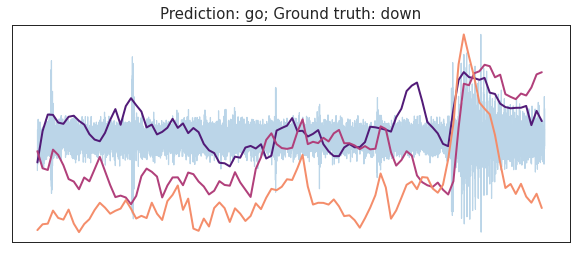

45


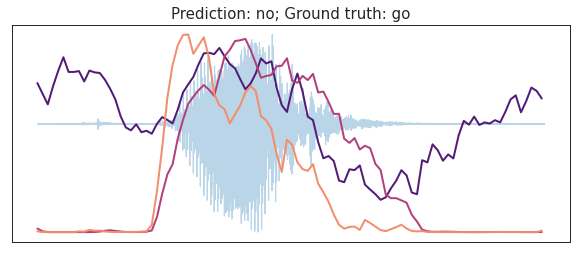

46


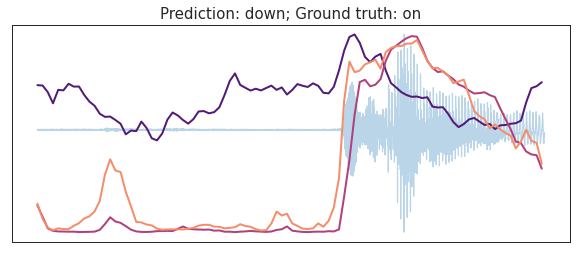

74


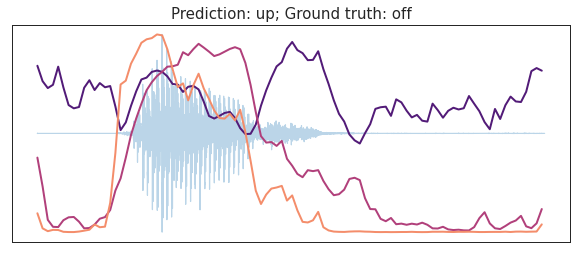

88


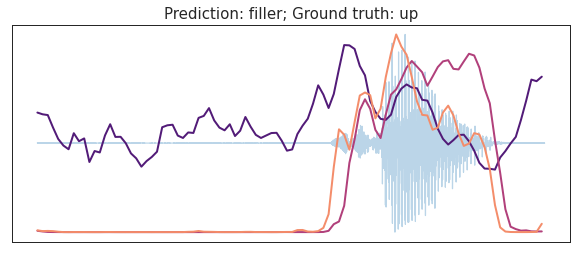

98


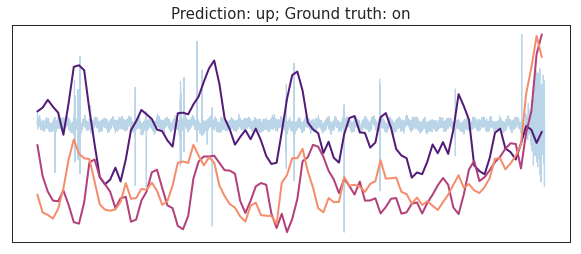

In [47]:
for i,ex in enumerate(test_examples):
    # look at wrong predictions
    if np.argmax(yscores_mha3[i]) != ex[1]:
        print(i)
        fig, ax1 = plt.subplots(figsize=(10,4))
        ax1.plot(ex[0], alpha=0.3, color='tab:blue')

        ax2 = ax1.twinx() 

        atts1 = np.log(atts_mha3[i,0,0,:] + 1e-6)
        atts2 = np.log(atts_mha3[i,1,0,:] + 1e-6)
        atts3 = np.log(atts_mha3[i,2,0,:] + 1e-6)

        ax2.plot(np.arange(1,16000,164),atts1, lw=2, alpha=0.99, color=cols[0])
        ax2.plot(np.arange(1,16000,164),atts2, lw=2, alpha=0.99, color=cols[1])
        ax2.plot(np.arange(1,16000,164),atts3, lw=2, alpha=0.99, color=cols[2])
        plt.title("Prediction: " + output_classes[np.argmax(yscores_mha3[i])] + "; Ground truth: " + output_classes[ex[1]], fontsize=15)

        ax1.get_yaxis().set_ticks([])
        ax1.get_xaxis().set_ticks([])
        ax2.get_yaxis().set_ticks([])
        plt.show()
        display.display(display.Audio(ex[0], rate=16000))

23


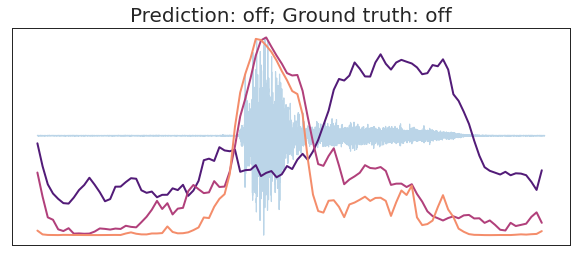

42


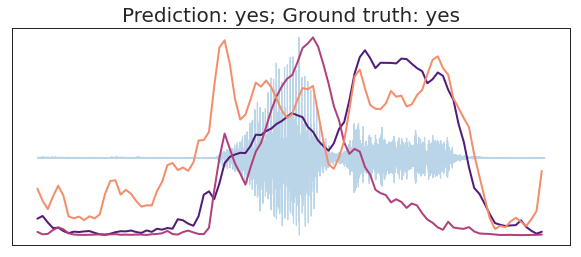

72


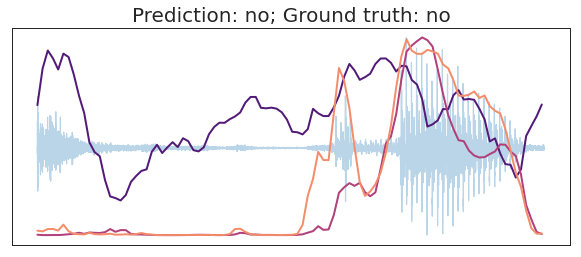

In [65]:
for i,ex in enumerate(test_examples):
    # look at correct predictions
    if np.argmax(yscores_mha3[i]) == ex[1] and i in [23,42,72]:
        print(i)
        fig, ax1 = plt.subplots(figsize=(10,4))
        ax1.plot(ex[0], alpha=0.3, color='tab:blue')

        ax2 = ax1.twinx() 

        atts1 = np.log(atts_mha3[i,0,0,:] + 1e-6)
        atts2 = np.log(atts_mha3[i,1,0,:] + 1e-6)
        atts3 = np.log(atts_mha3[i,2,0,:] + 1e-6)

        ax2.plot(np.arange(1,16000,164),atts1, lw=2, alpha=0.99, color=cols[0])
        ax2.plot(np.arange(1,16000,164),atts2, lw=2, alpha=0.99, color=cols[1])
        ax2.plot(np.arange(1,16000,164),atts3, lw=2, alpha=0.99, color=cols[2])
        plt.title("Prediction: " + output_classes[np.argmax(yscores_mha3[i])] + "; Ground truth: " + output_classes[ex[1]], fontsize=20)

        ax1.get_yaxis().set_ticks([])
        ax1.get_xaxis().set_ticks([])
        ax2.get_yaxis().set_ticks([])
        plt.savefig(f'project_report/imgs/att_scores12_{i}.pdf',bbox_inches='tight', pad_inches=0)
        plt.show()
        display.display(display.Audio(ex[0], rate=16000))

In [51]:
atts_andreade = results_12kws_task["AndreadeOriginal"]['att_scores']

In [55]:
yscores_andreade = results_12kws_task["AndreadeOriginal"]['y_scores']

In [52]:
atts_andreade.shape

(4888, 1, 98)

23


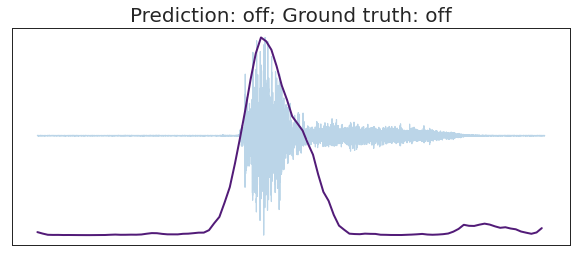

42


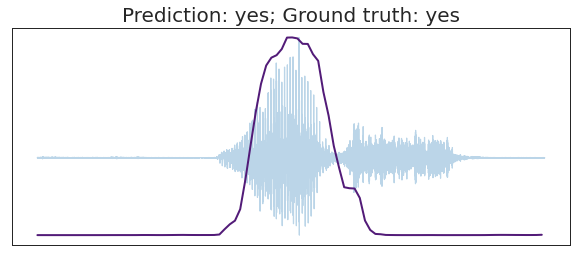

72


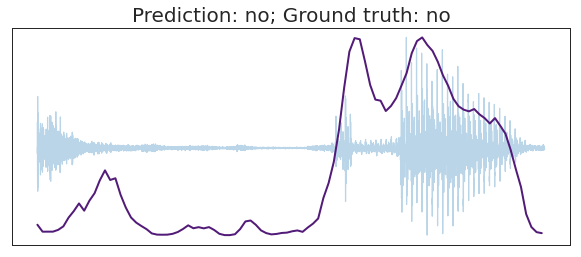

In [66]:
for i,ex in enumerate(test_examples):
#     look at correct predictions
    if np.argmax(yscores_mha3[i]) == ex[1] and i in [23,42,72]:
#     if True:
        print(i)
    # 1 subplot

        fig, ax1 = plt.subplots(figsize=(10,4))
        ax1.plot(ex[0], alpha=0.3, color='tab:blue')

        ax2 = ax1.twinx() 

        atts1 = np.log(atts_andreade[i,0,:] + 1e-6)

        ax2.plot(np.arange(1,16000,164),atts1, lw=2, alpha=0.99, color=cols[0])
        plt.title("Prediction: " + output_classes[np.argmax(yscores_andreade[i])] + "; Ground truth: " + output_classes[ex[1]], fontsize=20)

        ax1.get_yaxis().set_ticks([])
        ax1.get_xaxis().set_ticks([])
        ax2.get_yaxis().set_ticks([])
        
        plt.savefig(f'project_report/imgs/att_scores12_{i}_andreade.pdf', bbox_inches='tight', pad_inches=0)
        plt.show()
        display.display(display.Audio(ex[0], rate=16000))

### 35 kws

In [26]:
current_task = hyperparams._TASKS_[1]
print(current_task)
core_kws, aux_kws, output_classes = get_kws(hyperparams._DATA_DIR_, current_task)
print("Output Classes: ", output_classes)

X_train, y_train, X_valid, y_valid, X_test, y_test = load_original_splits(current_task, smoke_size=-1)

batch_size = 64
train_dataset, train_steps, valid_dataset, valid_steps, test_dataset = get_tf_datasets(X_train, 
                             y_train, 
                             X_valid, 
                             y_valid, 
                             X_test, 
                             y_test, 
                             batch_size=batch_size,
                            task=current_task)

35kws
Output Classes:  ['off', 'three', 'happy', 'eight', 'up', 'no', 'seven', 'marvin', 'five', 'cat', 'visual', 'forward', 'right', 'wow', 'zero', 'learn', 'bird', 'left', 'nine', 'house', 'dog', 'backward', 'on', 'two', 'sheila', 'follow', 'tree', 'yes', 'four', 'one', 'stop', 'six', 'down', 'go', 'bed']
Train steps: 1326
Validations steps: 156
Example of dataset element:
(<tf.Tensor: shape=(64, 16000), dtype=float32, numpy=
array([[-3.4913688e-04,  7.1986986e-04,  3.8153099e-04, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         6.3784170e-04,  5.7608885e-04, -1.3813138e-04],
       [ 0.0000000e+00,  7.5058000e-05, -7.2806259e-05, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       ...,
       [-4.9705948e-03, -4.8834779e-03,  1.7141252e-03, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         8.8093784e-03,

In [27]:
y_test

array([30, 15,  0, ..., 13, 28, 33])

In [28]:
atts_mha3 = results_35kws_task['MHattRNN_3heads']['att_scores']
yscores_mha3 = results_35kws_task['MHattRNN_3heads']['y_scores']

In [34]:
test_examples = []
for ex in test_dataset.take(2000):
    test_examples.append(ex)

18


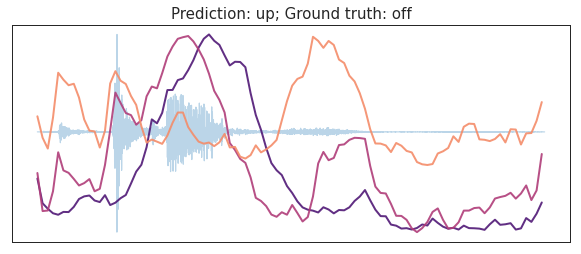

27


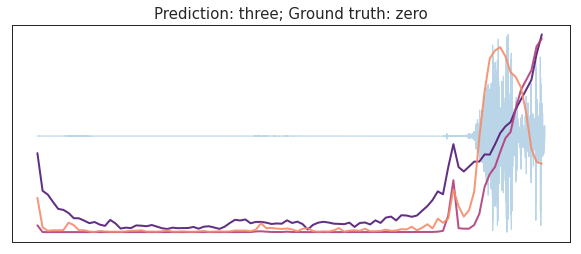

55


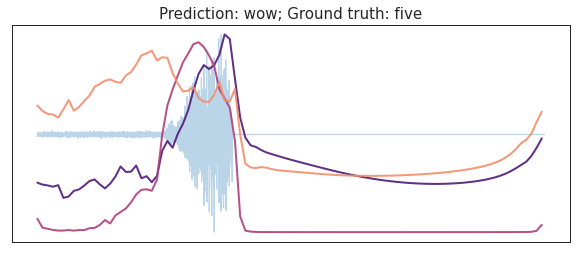

71


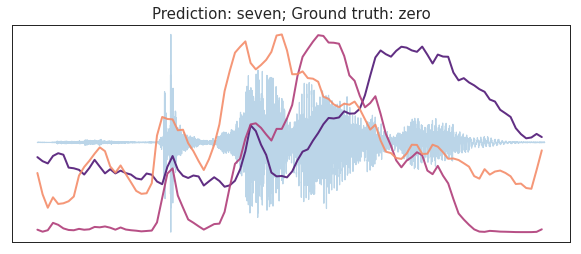

179


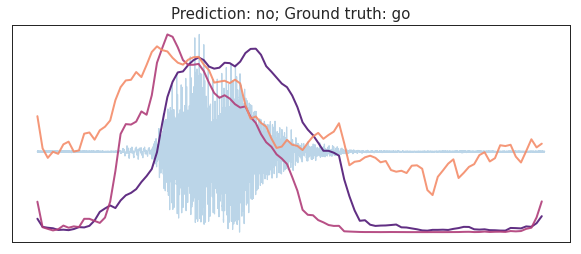

203


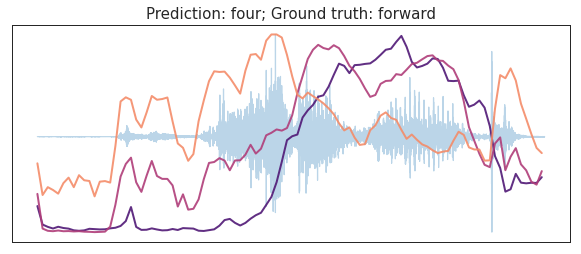

213


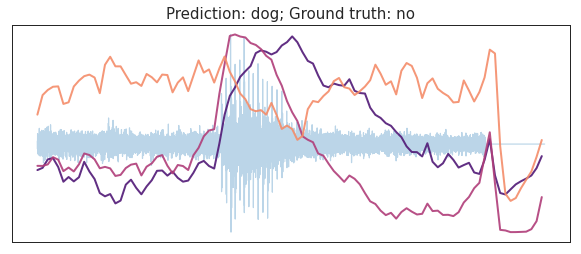

225


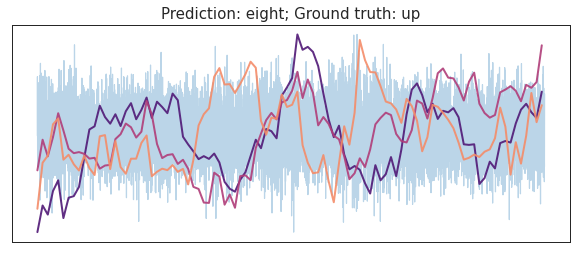

265


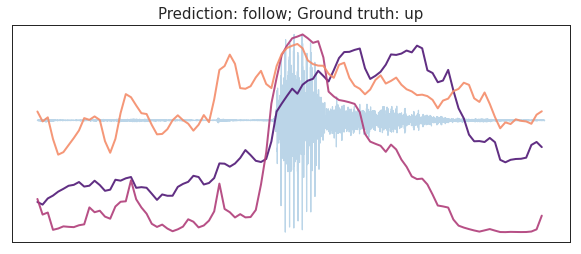

309


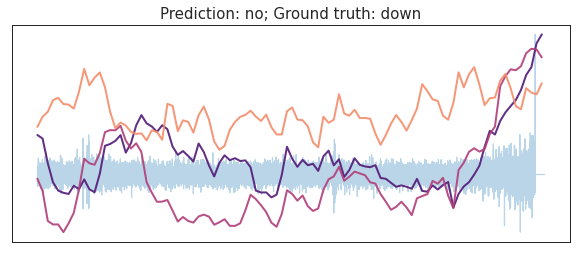

317


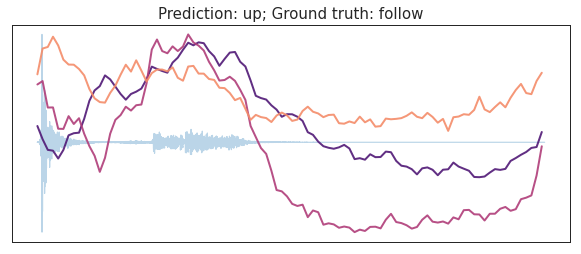

328


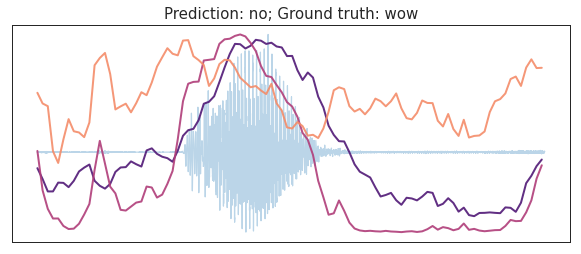

388


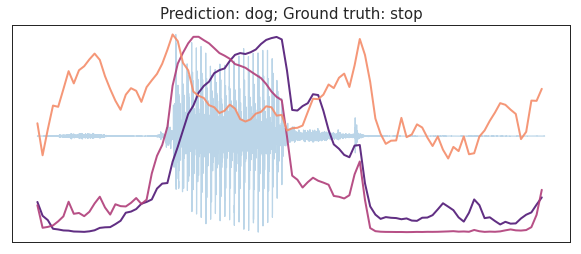

398


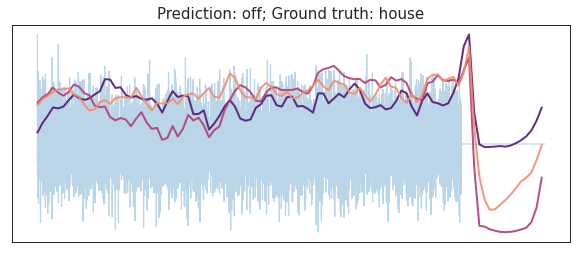

399


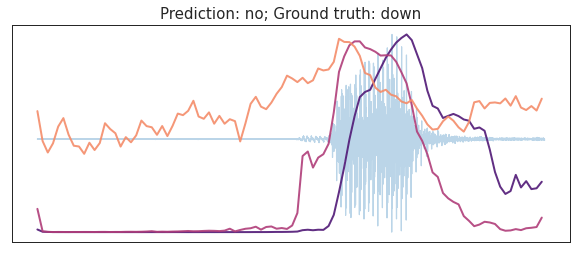

434


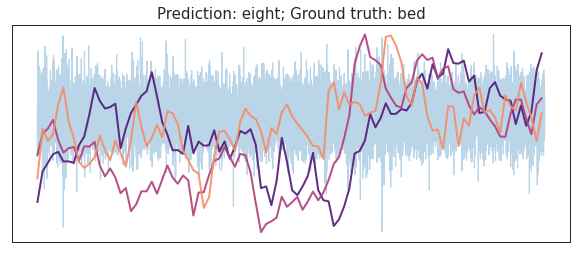

482


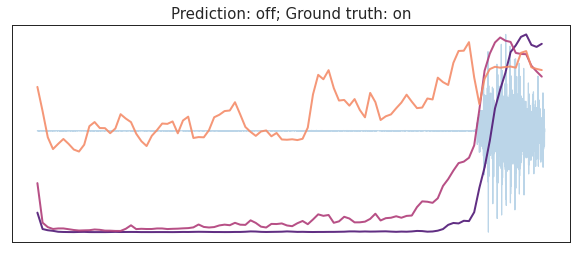

525


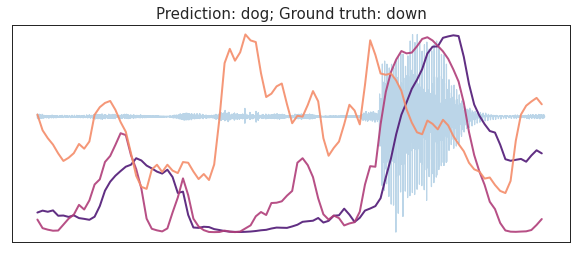

528


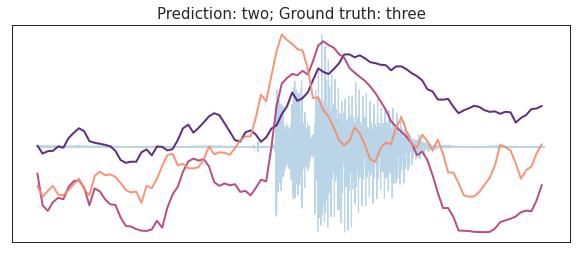

545


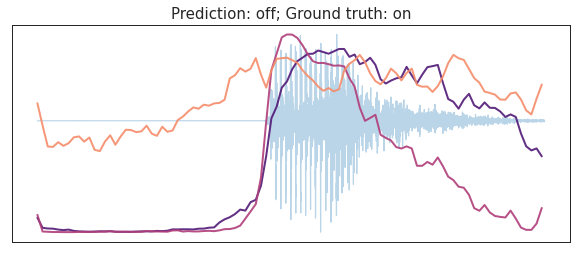

564


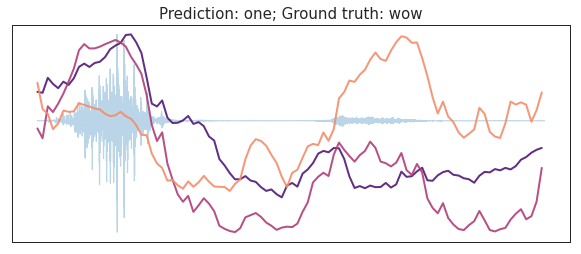

617


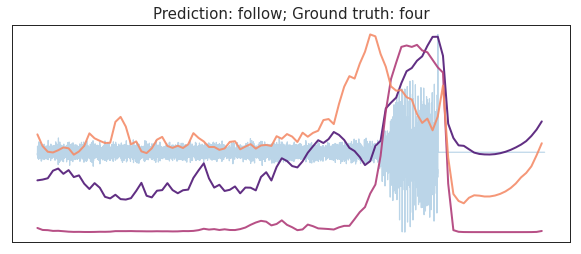

647


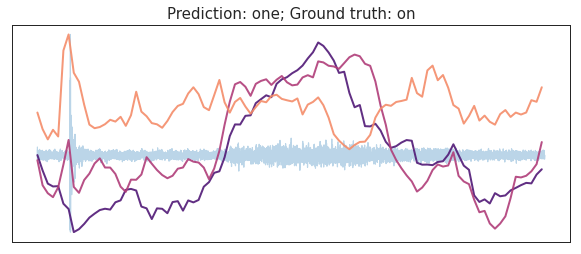

692


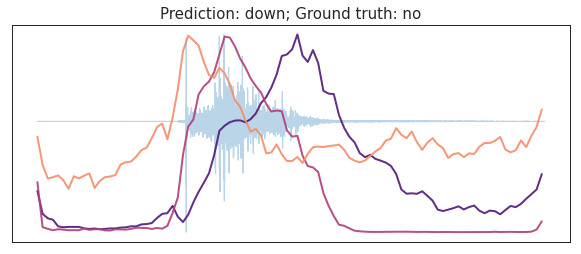

734


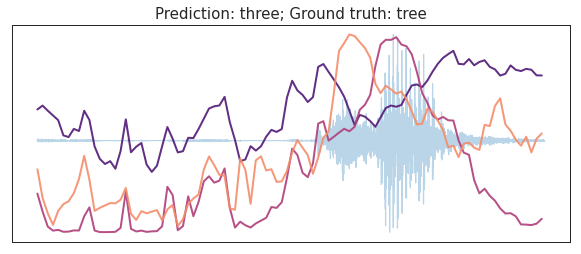

807


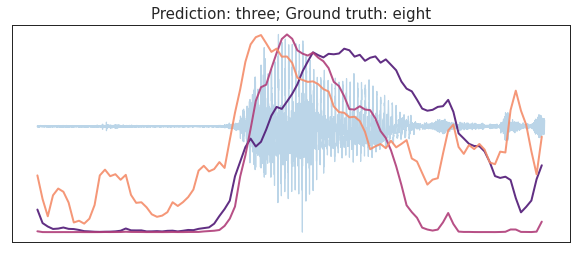

877


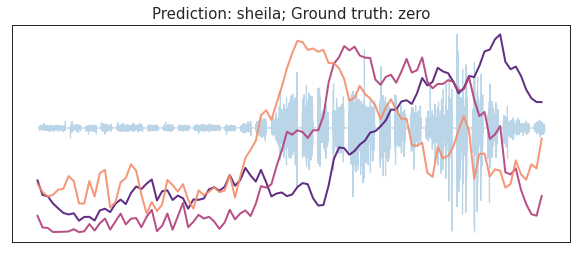

912


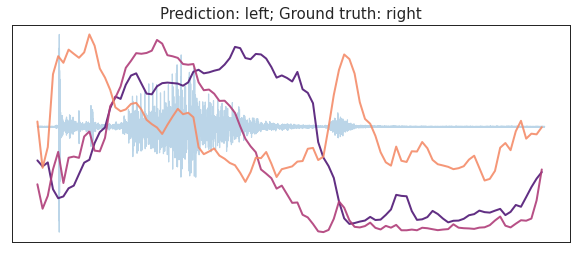

930


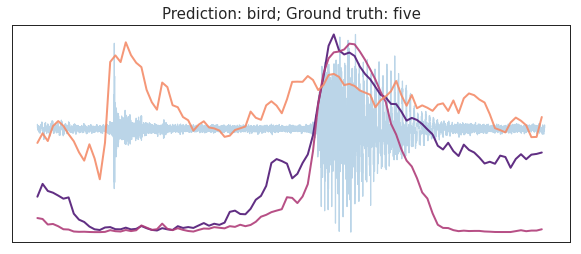

942


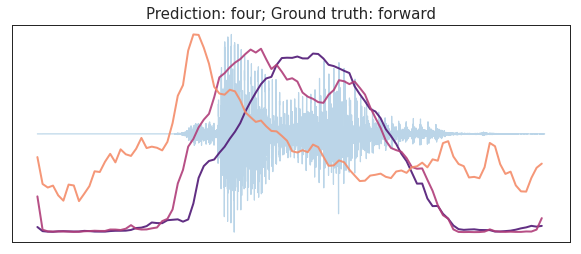

991


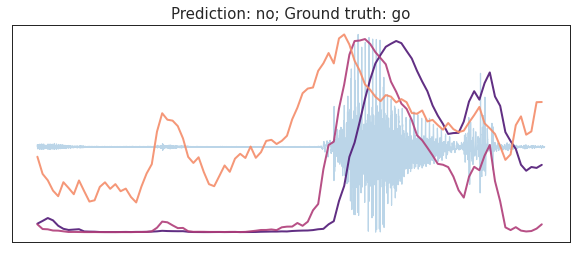

994


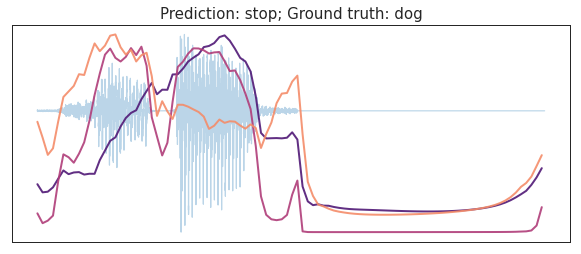

1001


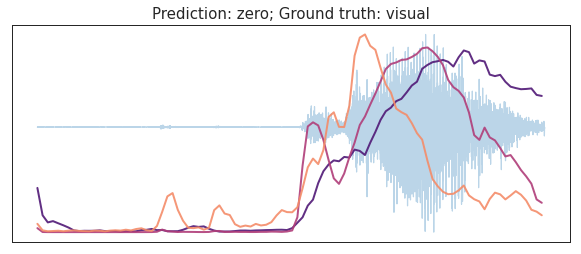

1002


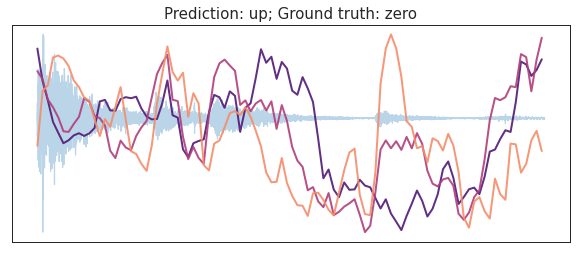

1013


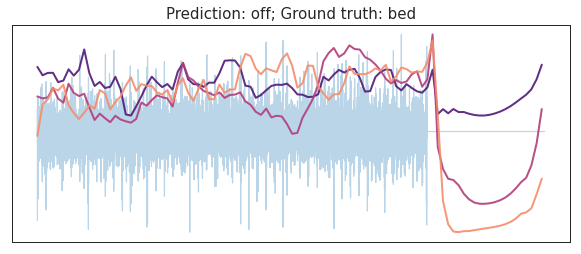

1026


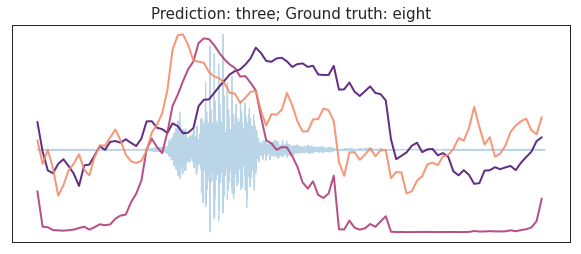

1064


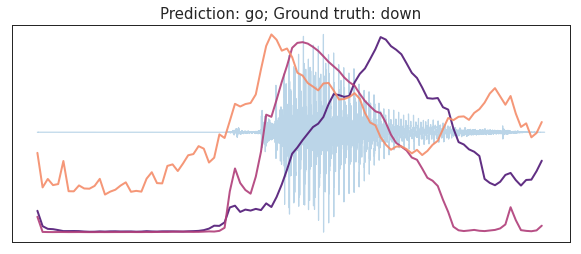

1077


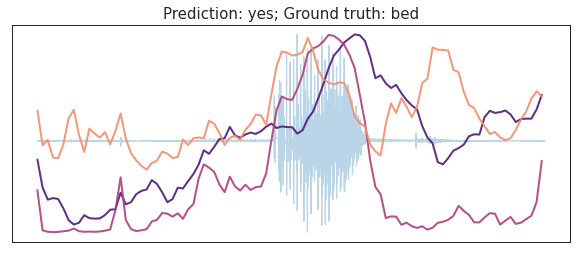

1103


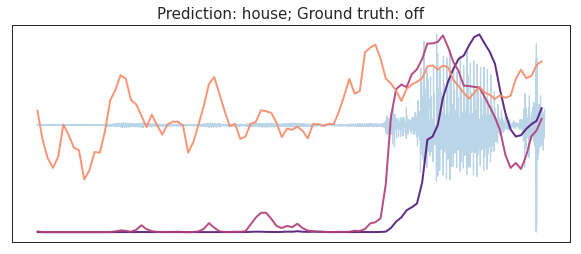

1109


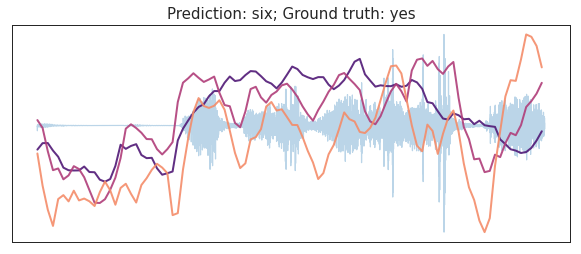

1149


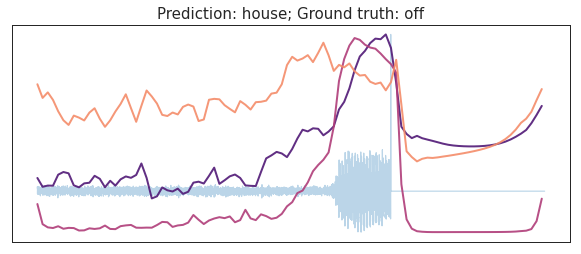

1167


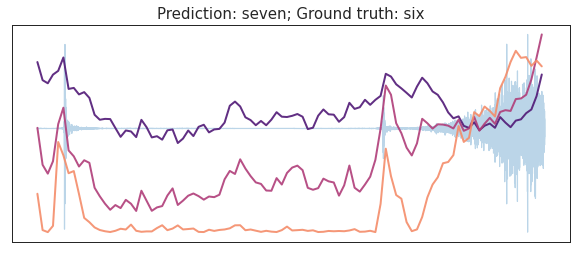

1178


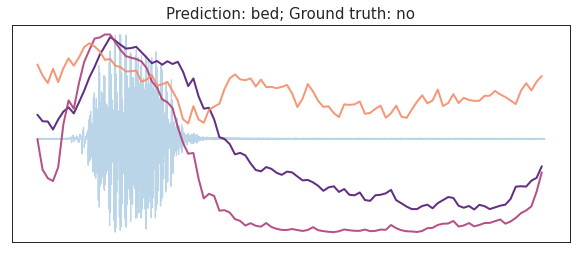

1213


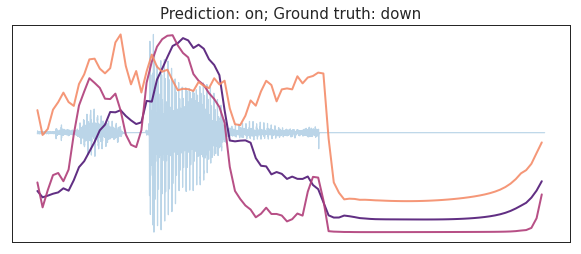

1219


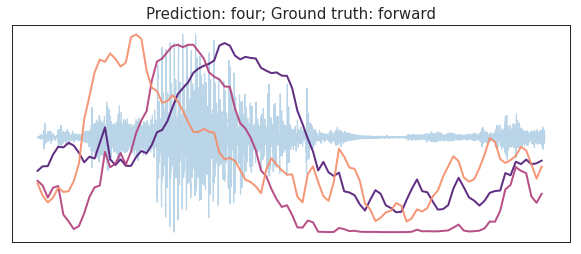

1247


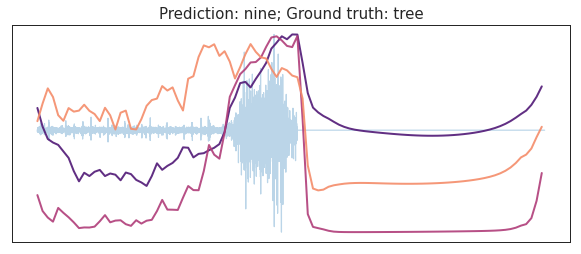

1254


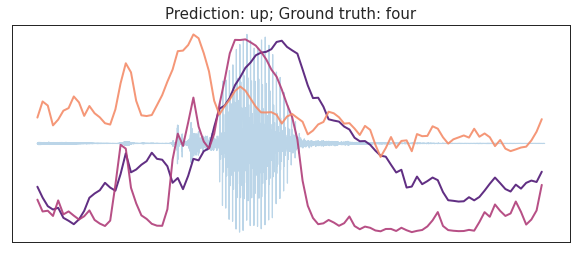

1277


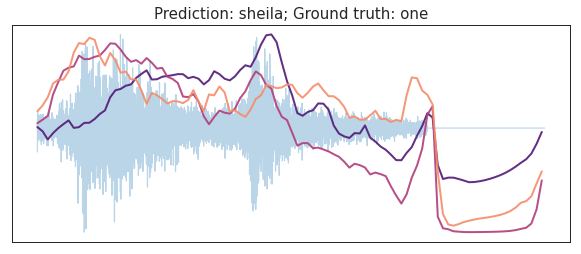

1304


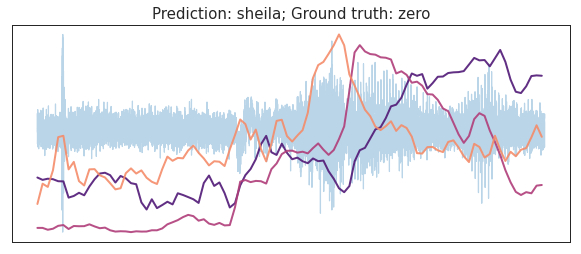

1308


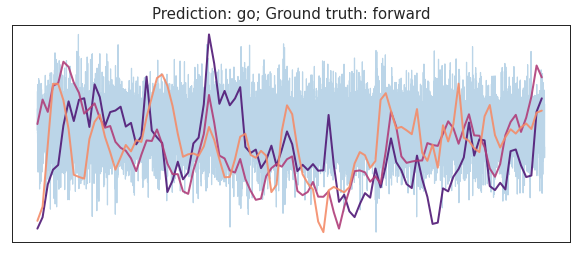

1316


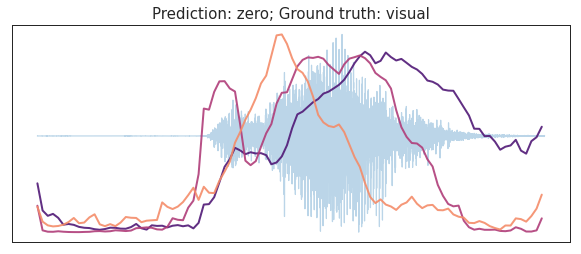

1375


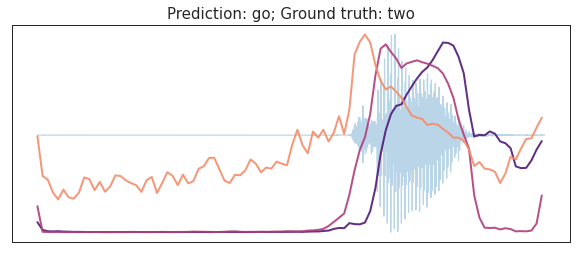

1415


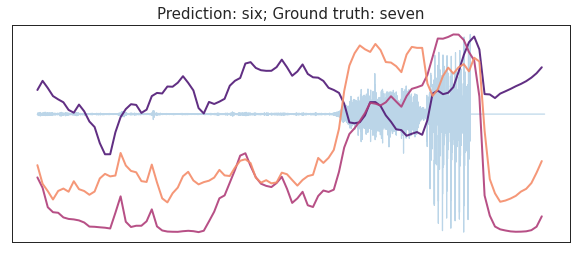

1451


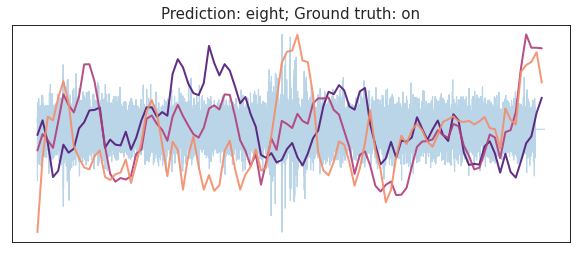

1518


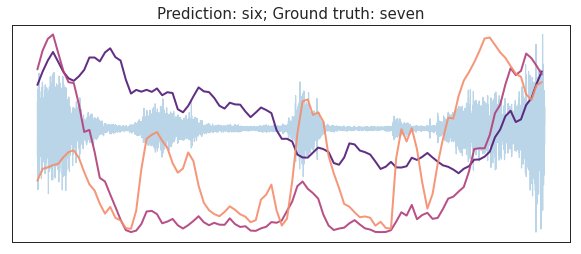

1552


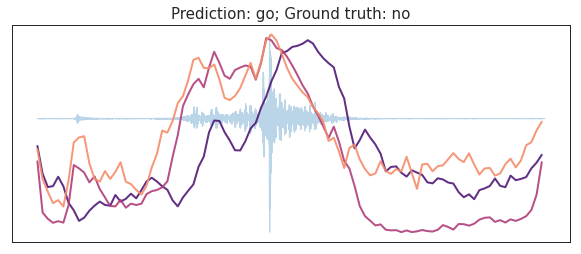

1569


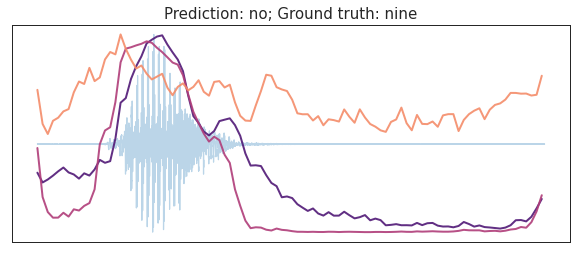

1710


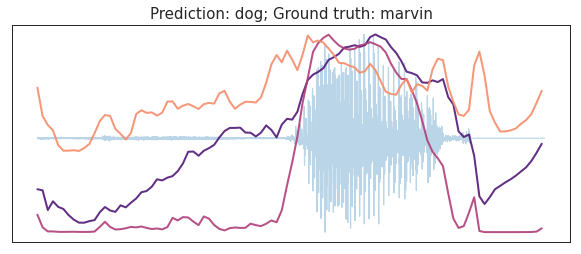

1728


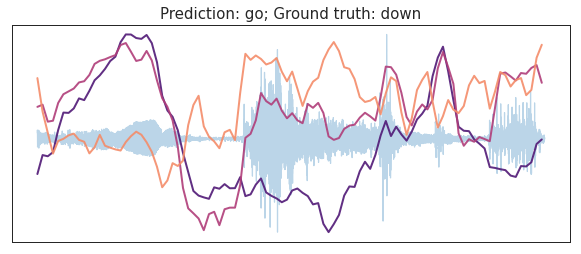

1738


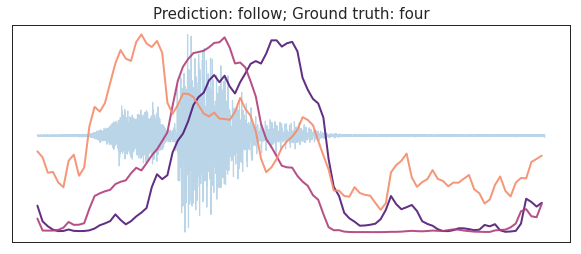

1742


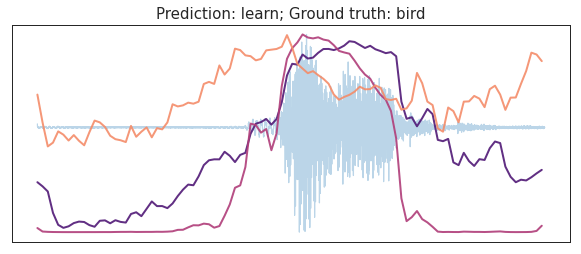

1748


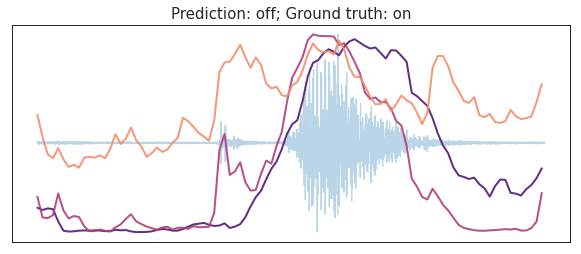

1762


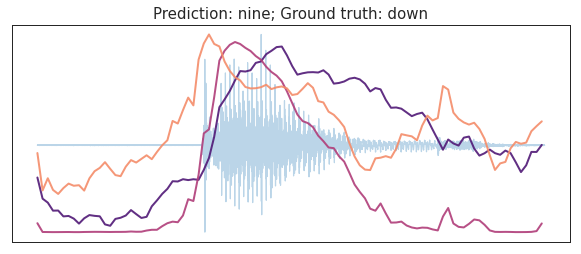

1763


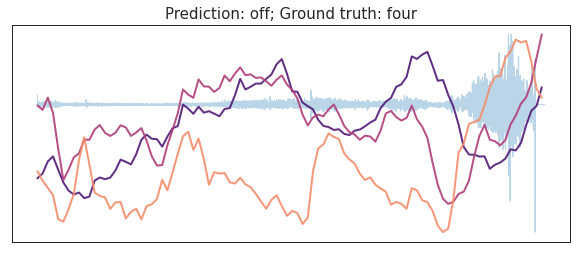

1774


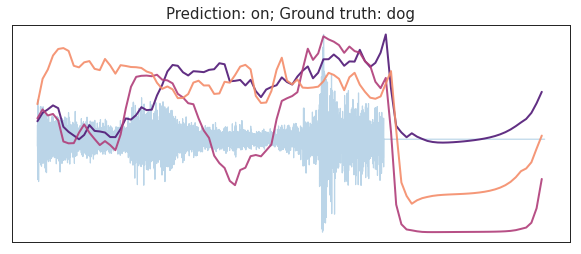

1833


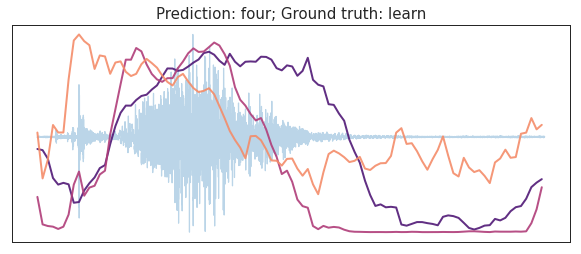

1912


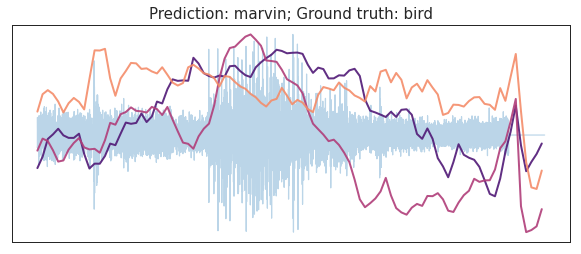

1918


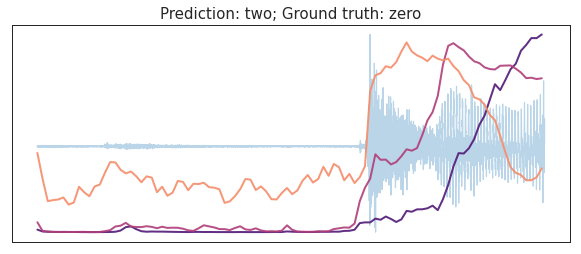

1925


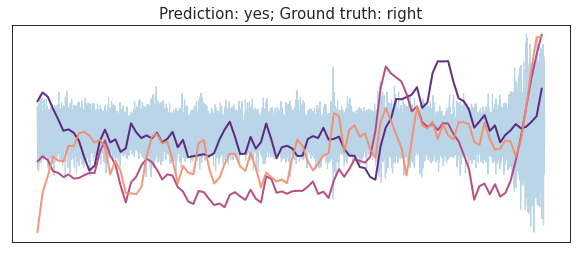

1945


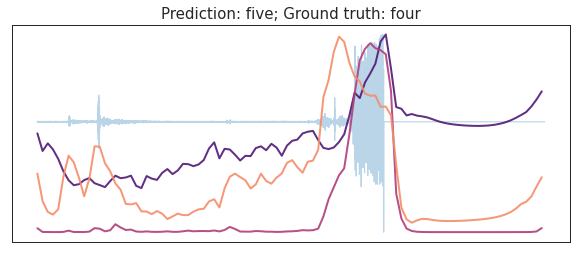

1974


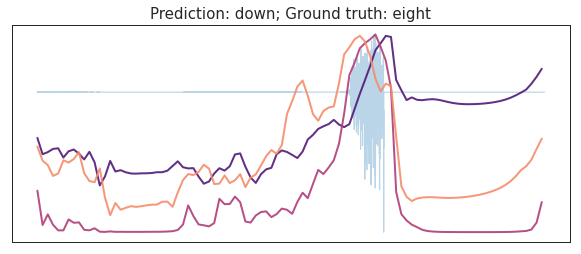

In [37]:
for i,ex in enumerate(test_examples):
    # look at wrong predictions
    if np.argmax(yscores_mha3[i]) != ex[1] :
        print(i)
        fig, ax1 = plt.subplots(figsize=(10,4))
        ax1.plot(ex[0], alpha=0.3, color='tab:blue')

        ax2 = ax1.twinx() 

        atts1 = np.log(atts_mha3[i,0,0,:] + 1e-6)
        atts2 = np.log(atts_mha3[i,1,0,:] + 1e-6)
        atts3 = np.log(atts_mha3[i,2,0,:] + 1e-6)

        ax2.plot(np.arange(1,16000,164),atts1, lw=2, alpha=0.9, color=cols[0])
        ax2.plot(np.arange(1,16000,164),atts2, lw=2, alpha=0.9, color=cols[1])
        ax2.plot(np.arange(1,16000,164),atts3, lw=2, alpha=0.9, color=cols[2])
        plt.title("Prediction: " + output_classes[np.argmax(yscores_mha3[i])] + "; Ground truth: " + output_classes[ex[1]], fontsize=15)

        ax1.get_yaxis().set_ticks([])
        ax1.get_xaxis().set_ticks([])
        ax2.get_yaxis().set_ticks([])
        plt.show()
        display.display(display.Audio(ex[0], rate=16000))

21


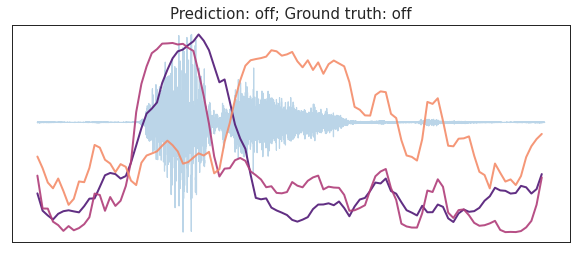

32


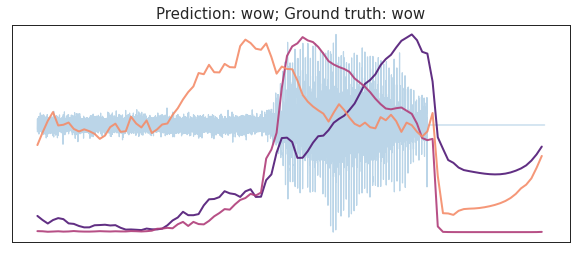

39


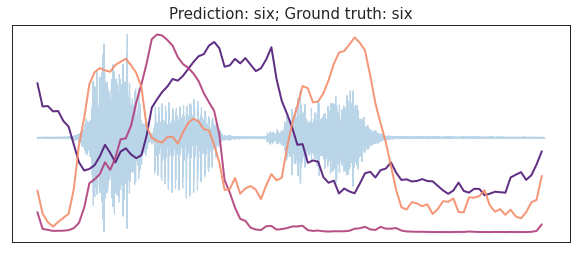

44


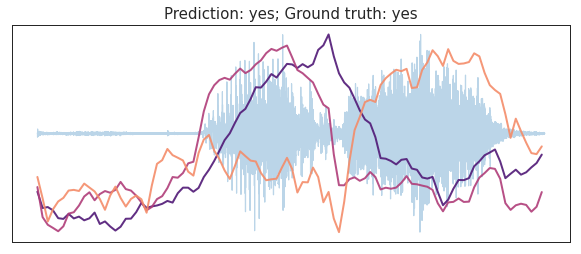

In [40]:
for i,ex in enumerate(test_examples):
    # look at correct predictions
    if np.argmax(yscores_mha3[i]) == ex[1] and i in [21,32,39,44]:
        print(i)
        fig, ax1 = plt.subplots(figsize=(10,4))
        ax1.plot(ex[0], alpha=0.3, color='tab:blue')

        ax2 = ax1.twinx() 

        atts1 = np.log(atts_mha3[i,0,0,:] + 1e-6)
        atts2 = np.log(atts_mha3[i,1,0,:] + 1e-6)
        atts3 = np.log(atts_mha3[i,2,0,:] + 1e-6)

        ax2.plot(np.arange(1,16000,164),atts1, lw=2, alpha=0.9, color=cols[0])
        ax2.plot(np.arange(1,16000,164),atts2, lw=2, alpha=0.9, color=cols[1])
        ax2.plot(np.arange(1,16000,164),atts3, lw=2, alpha=0.9, color=cols[2])
        plt.title("Prediction: " + output_classes[np.argmax(yscores_mha3[i])] + "; Ground truth: " + output_classes[ex[1]], fontsize=15)

        ax1.get_yaxis().set_ticks([])
        ax1.get_xaxis().set_ticks([])
        ax2.get_yaxis().set_ticks([])
        plt.savefig(f'project_report/imgs/att_scores35_{i}.pdf')
        plt.show()
        display.display(display.Audio(ex[0], rate=16000))

## Results Table

In [114]:
for key in results_35kws_task.keys():
    print(key, results_35kws_task[key]['n_params']/1000)

SimpleAttModel 84.261
AndreadeOriginal 179.754
AndreadeSeqQuery 169.387
SeqQueryNoCNN 169.253
MHattRNN_2heads 208.426
MHattRNN_3heads 241.386
MHattRNN_4heads 274.346
MHattRNN_5heads 307.306
ResAndreade_3layers 182.074
ResAndreade_4layers 182.869
ResAndreade_5layers 183.664
SQMHattRNN_2heads 235.434
SQMHattRNN_3heads 268.394
SQMHattRNN_4heads 301.354
SQMHattRNN_5heads 334.314


In [117]:
for key in results_12kws_task.keys():
    print(key, results_12kws_task[key]['test_acc']*100)

SimpleAttModel 92.9214402618658
AndreadeOriginal 94.74222585924713
AndreadeSeqQuery 94.9468085106383
SeqQueryNoCNN 94.80360065466449
MHattRNN_2heads 95.11047463175123
MHattRNN_3heads 95.25368248772504
MHattRNN_4heads 94.39443535188215
MHattRNN_5heads 95.49918166939445
SQMHattRNN_2heads 95.29459901800328
SQMHattRNN_3heads 95.39689034369886
SQMHattRNN_4heads 94.72176759410802
SQMHattRNN_5heads 95.68330605564648
ResAndreade_2layers 94.92635024549918
ResAndreade_3layers 95.06955810147299
ResAndreade_4layers 94.39443535188215
ResAndreade_5layers 94.02618657937806


In [116]:
for key in results_35kws_task.keys():
    print(key, results_35kws_task[key]['test_acc']*100)

SimpleAttModel 92.82144479781917
AndreadeOriginal 95.18400726942299
AndreadeSeqQuery 94.55701953657429
SeqQueryNoCNN 94.79327578373467
MHattRNN_2heads 94.80236256247161
MHattRNN_3heads 95.32030895047706
MHattRNN_4heads 95.329395729214
MHattRNN_5heads 95.10222626079054
ResAndreade_3layers 94.62062698773285
ResAndreade_4layers 94.72058155383917
ResAndreade_5layers 94.82962289868242
SQMHattRNN_2heads 95.39300318037256
SQMHattRNN_3heads 94.40254429804634
SQMHattRNN_4heads 94.33893684688778
SQMHattRNN_5heads 94.97501135847341
